In [1]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nptdms import TdmsFile #Process ramping file
import math

#For building ML models
import keras
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility


Bad key "text.kerning_factor" on line 4 in
/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


In [2]:
def load_sensor(dir_path, sensor, time_range = None):
    
    data = pd.DataFrame(data = {sensor: np.load(dir_path + sensor + ".npy"),
                                "time": np.load(dir_path + "time.npy")})
    
    start = min(data["time"])
    end = max(data["time"])
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    data = data[(data["time"] > start) & (data["time"] < end)]
   
    %reset -f in
    
    return data[sensor]

def load_time_label(dir_path, time_range, window = 2000, step = 10):
    
    time_label =  np.load(dir_path + "time.npy")
    
    start = min(time_label)
    end = max(time_label)
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    time_label = time_label[(time_label > start) & (time_label < end)][window-1::step]
    
    %reset -f in
    
    return time_label

#### Mean of abs(signal)
def generate_mean_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_sd

#### Thresholded zero crossings
def zero_crossings(array):
    
    #Set values outside of range (0.001, 0.1) = 0
    array[abs(array) > 0.1] = 0
    array[abs(array) < 0.005] = 0
    
    #Calculate number of zero-crossing points, normalized by the window size
    zero_crossings = ((array[:-1] * array[1:]) < 0).sum()/array.size
    
    return zero_crossings


def generate_crossings_data(dir_path, time_range = None, window = 5000, step = 10):
    
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_crossings = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_crossings


def generate_data(dir_path, time_range, window = 2000, thres_win = 25000, step = 10):
    
    #Selection index due to using different window
    selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(dir_path, time_range, window = window, step = step)[selection_index:]
    moving_sd = generate_sd_data(dir_path, time_range, window = window, step = step)[selection_index:]
    #moving_thres_crossings = generate_crossings_data(dir_path, time_range, window = thres_win, step = step)
    time_label = load_time_label(dir_path, time_range, window = window, step = step)[selection_index:]
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label

#####-------INCREMENTAL LEARNING IMPLEMENTATION-------######

def create_threshold_list(trigger_sections, start_thres = 4.0, end_thres = 2.6):
    
    increment = (start_thres - end_thres)/(trigger_sections-3)
    
    trigger_thres = [0,0] #No trigger in the first two sections
    
    trigger_thres.extend([start_thres - i*increment for i in range(trigger_sections - 2)])
    
    return trigger_thres

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(6, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=12))

    model.add(Dense(3,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(12,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(trigger_threshold, current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    print("Triggering threshold is: ", trigger_threshold)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is far away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > trigger_threshold)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=trigger_threshold, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        return list(time_test[peaks])
    
    else:
        return None
    

def simulation(dir_path, section_size, time_range, reached_max):
    
    #Load data and create the model
    X, time_axis = generate_data(dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Setting dynamic trigger threshold
    start_time = time_range[0]
    
    changing_range = abs(start_time - reached_max)
    
    trigger_sections = int(changing_range/section_size - (changing_range/section_size)%1)
    
    print("Number of triggering sections", trigger_sections)
    
    trigger_thres = create_threshold_list(trigger_sections, start_thres = 4.5, end_thres = 2.6)
    
    print("List of trigger thresholds: ", trigger_thres)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
            
            
            #Select the trigger threshold
            
            if i >= len(trigger_thres):
                trigger_threshold = trigger_thres[-1]
            else:
                trigger_threshold = trigger_thres[i]
                
            
            trigger_time = trigger(trigger_threshold, current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
        
        print("<--------")
        
    print("Finished simulation, all the triggered times are: ", trigger_log)

In [ ]:
# Start 4.5; End 2.6

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (897500, 12)
Flushing input history
Number of sections: 9
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


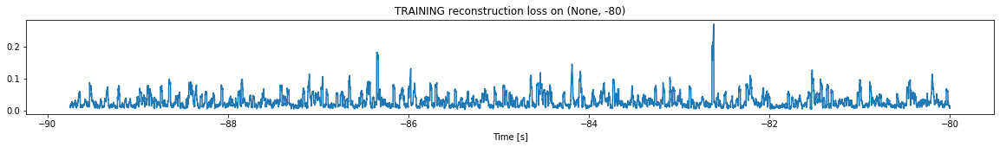

Finished training, median of the log(loss) is:  -1.648723879127963
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


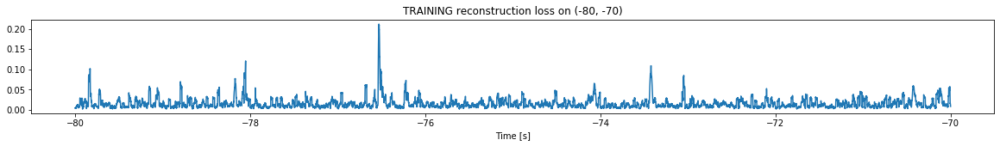

Finished training, median of the log(loss) is:  -1.9027879993453731
Triggering for section:  (-70, -60)
Using this median for triggering: -1.648723879127963
Triggering threshold is:  4.5


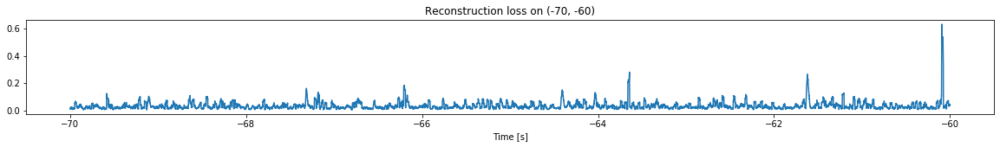

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


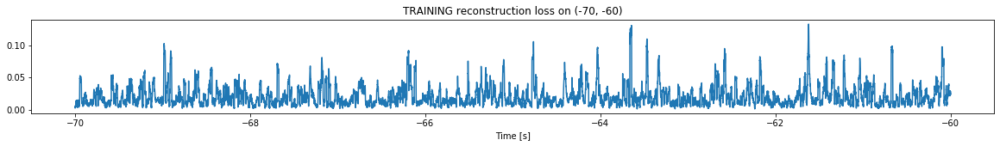

Finished training, median of the log(loss) is:  -1.772860960613445
Triggering for section:  (-60, -50)
Using this median for triggering: -1.9027879993453731
Triggering threshold is:  4.12


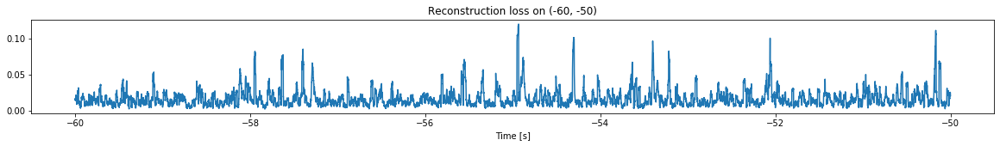

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


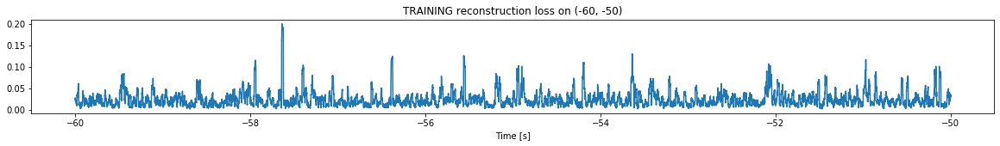

Finished training, median of the log(loss) is:  -1.7133885870865846
Triggering for section:  (-50, -40)
Using this median for triggering: -1.772860960613445
Triggering threshold is:  3.74


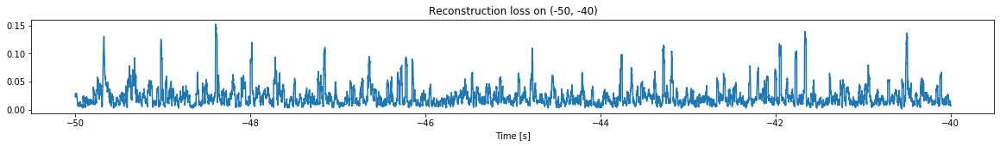

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


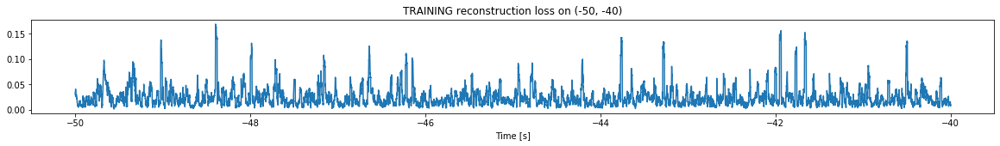

Finished training, median of the log(loss) is:  -1.699341935811046
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7133885870865846
Triggering threshold is:  3.36


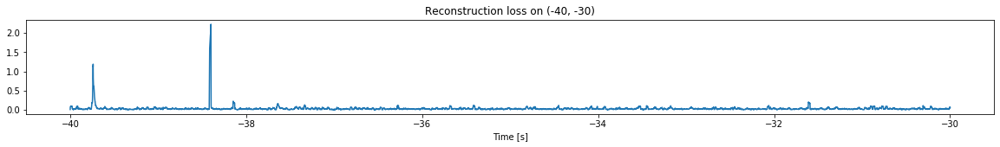

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


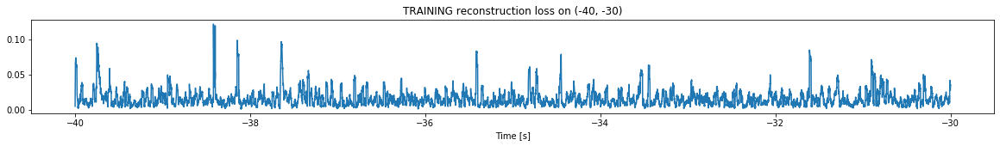

Finished training, median of the log(loss) is:  -1.8777628848179335
Triggering for section:  (-30, -20)
Using this median for triggering: -1.699341935811046
Triggering threshold is:  2.98


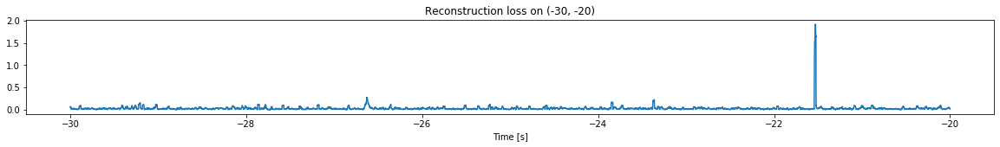

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


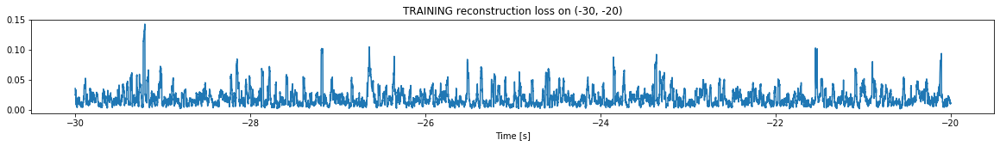

Finished training, median of the log(loss) is:  -1.7867288640241838
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8777628848179335
Triggering threshold is:  2.6


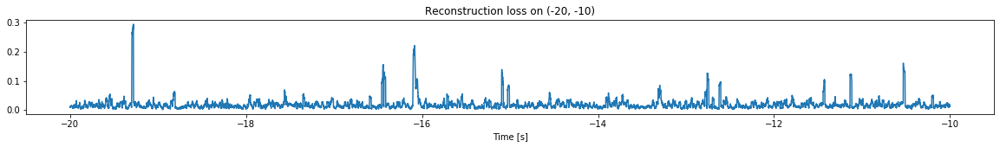

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


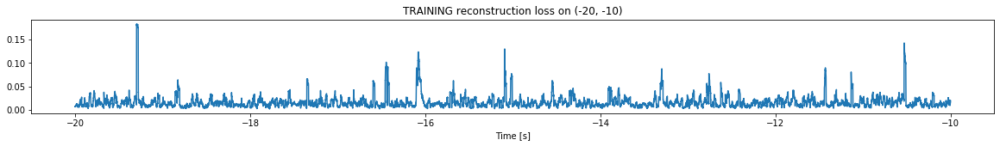

Finished training, median of the log(loss) is:  -1.8803840725525667
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7867288640241838
Triggering threshold is:  2.6


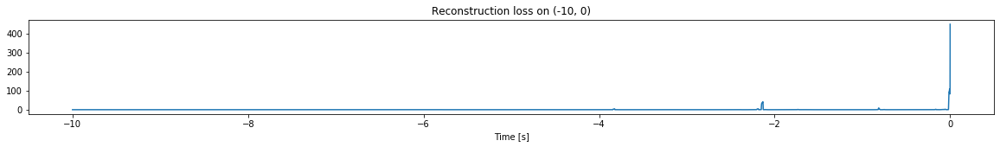

Other trigger time:  [-2.1325998 -0.8125    -0.006    ]
Their log loss values are:  [3.40594436 2.7517951  3.82292995]


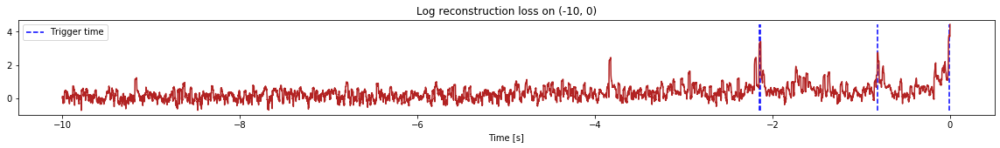

Triggered at:  [-2.1325998, -0.8125, -0.006]
<--------
Finished simulation, all the triggered times are:  [-2.1325998, -0.8125, -0.006]


In [4]:
simulation("./data/Ramp4/", 10, (-90,0), -3.9)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (897500, 12)
Flushing input history
Number of sections: 9
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 4.5, 4.183333333333334, 3.8666666666666667, 3.55, 3.2333333333333334, 2.916666666666667, 2.6]
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


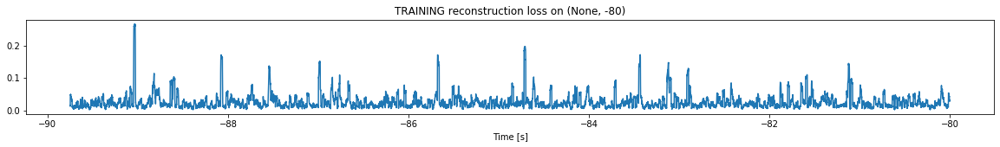

Finished training, median of the log(loss) is:  -1.6865405378577778
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


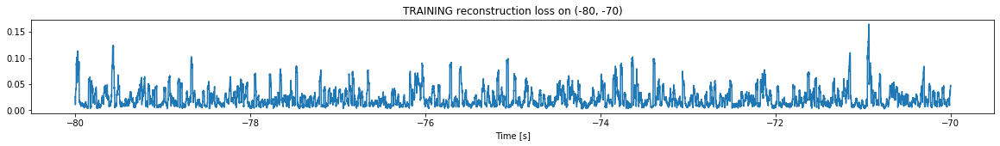

Finished training, median of the log(loss) is:  -1.7485832325079538
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6865405378577778
Triggering threshold is:  4.5


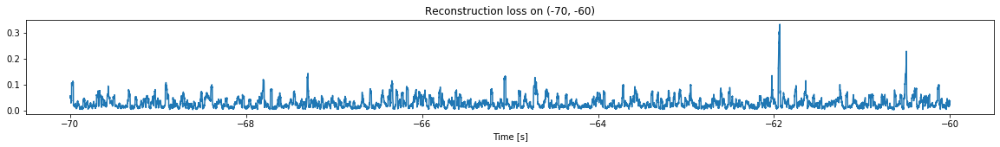

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


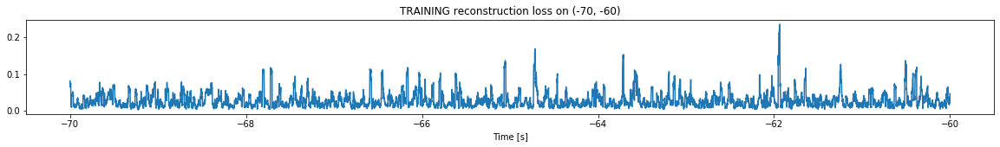

Finished training, median of the log(loss) is:  -1.6474969397188612
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7485832325079538
Triggering threshold is:  4.183333333333334


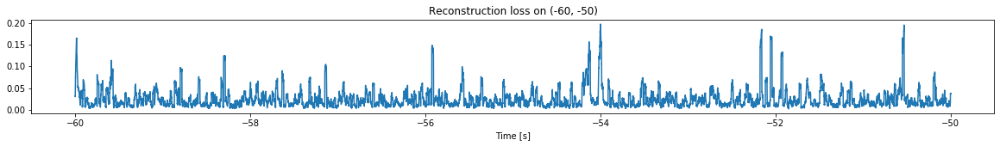

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


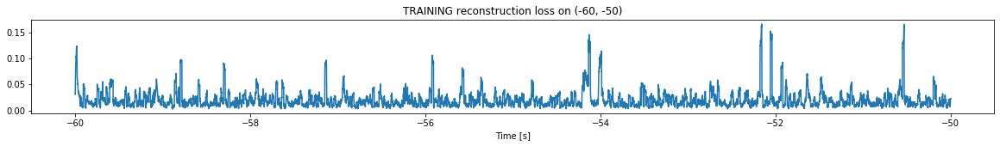

Finished training, median of the log(loss) is:  -1.7953830412429514
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6474969397188612
Triggering threshold is:  3.8666666666666667


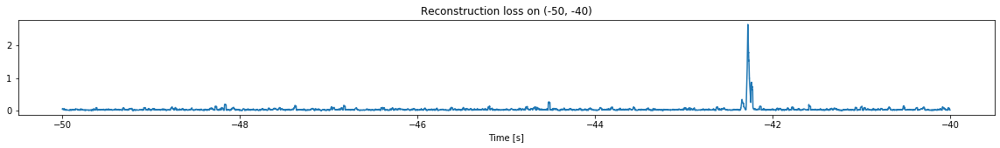

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


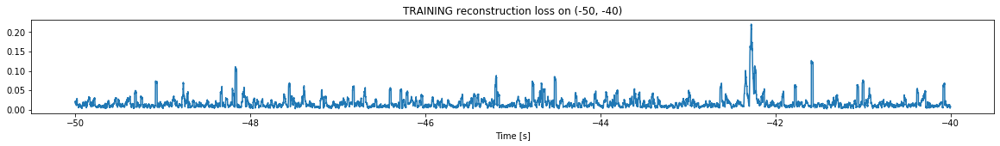

Finished training, median of the log(loss) is:  -1.8968299950113812
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7953830412429514
Triggering threshold is:  3.55


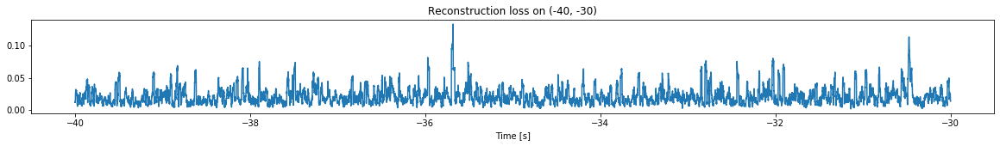

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


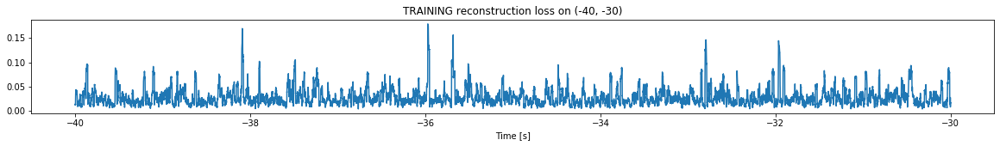

Finished training, median of the log(loss) is:  -1.6254673125629981
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8968299950113812
Triggering threshold is:  3.2333333333333334


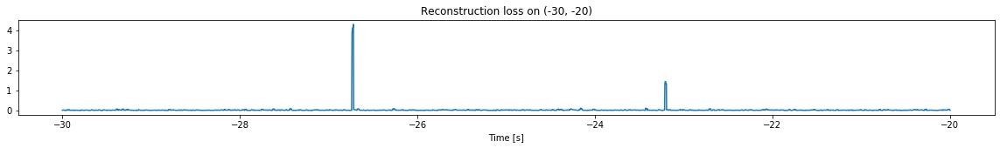

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


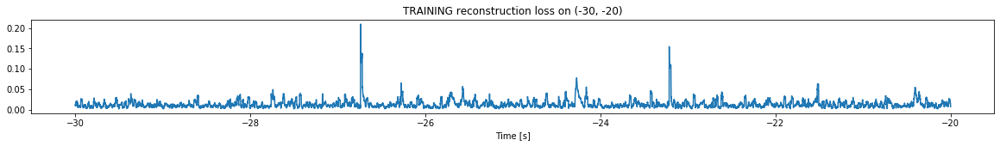

Finished training, median of the log(loss) is:  -1.9568796266172974
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6254673125629981
Triggering threshold is:  2.916666666666667


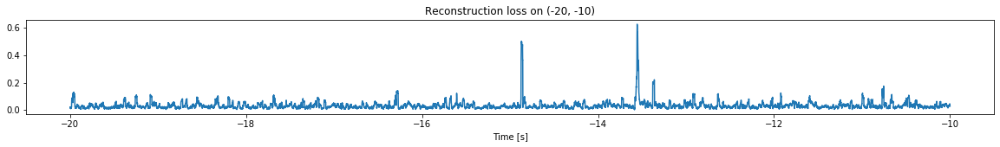

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


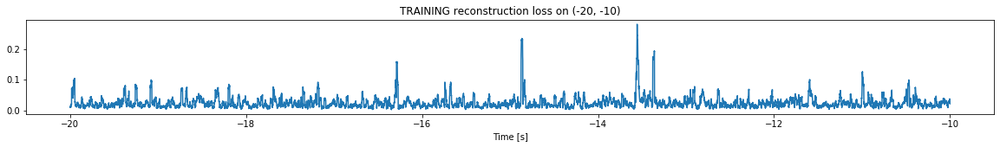

Finished training, median of the log(loss) is:  -1.695551303813336
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9568796266172974
Triggering threshold is:  2.6


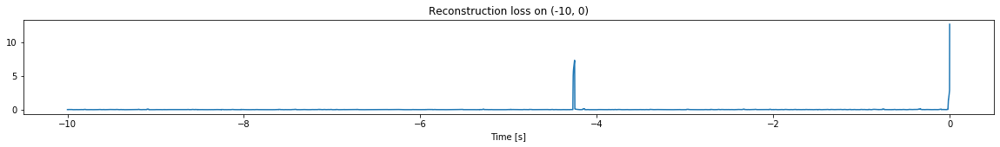

Other trigger time:  [-4.2511]
Their log loss values are:  [2.82358108]


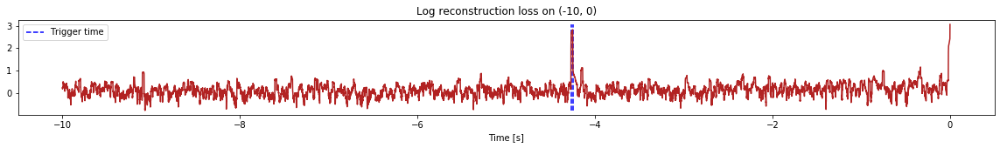

Triggered at:  [-4.2511]
<--------
Finished simulation, all the triggered times are:  [-4.2511]


In [5]:
simulation("./data/Ramp5/", 10, (-90,0), 0)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 4.5, 4.183333333333334, 3.8666666666666667, 3.55, 3.2333333333333334, 2.916666666666667, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


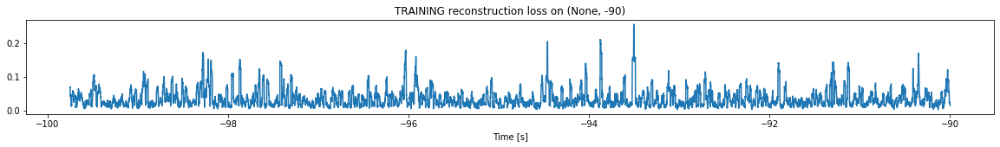

Finished training, median of the log(loss) is:  -1.5387676962672736
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


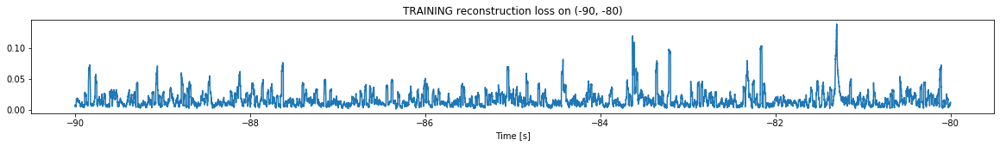

Finished training, median of the log(loss) is:  -1.8758806240971064
Triggering for section:  (-80, -70)
Using this median for triggering: -1.5387676962672736
Triggering threshold is:  4.5


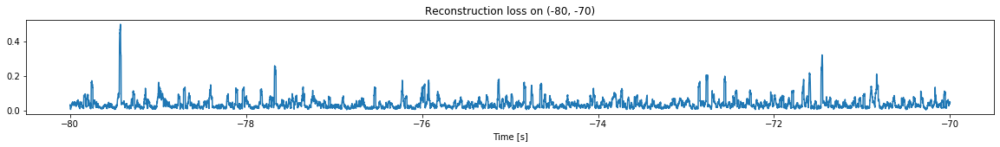

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


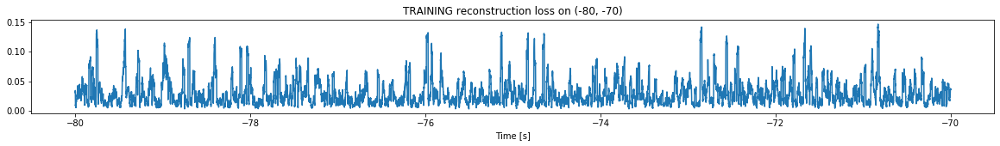

Finished training, median of the log(loss) is:  -1.6314655679216377
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8758806240971064
Triggering threshold is:  4.183333333333334


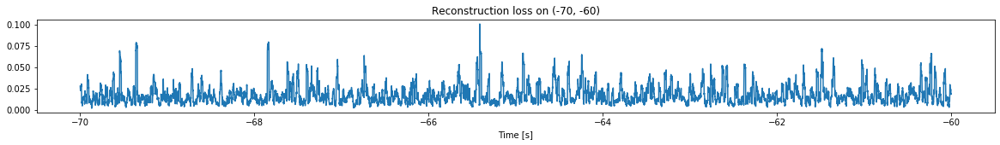

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


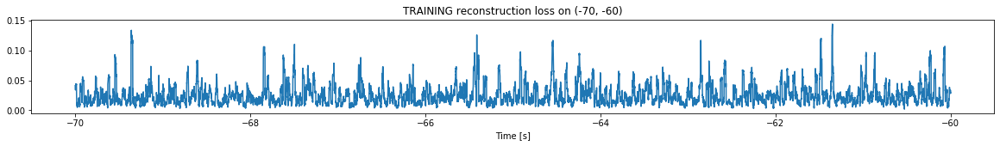

Finished training, median of the log(loss) is:  -1.6729763958698896
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6314655679216377
Triggering threshold is:  3.8666666666666667


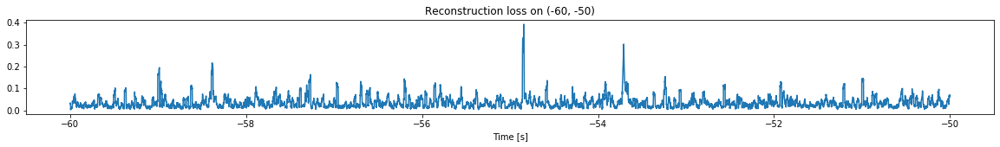

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


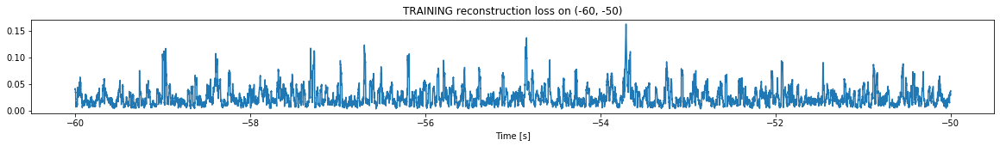

Finished training, median of the log(loss) is:  -1.6869322781138965
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6729763958698896
Triggering threshold is:  3.55


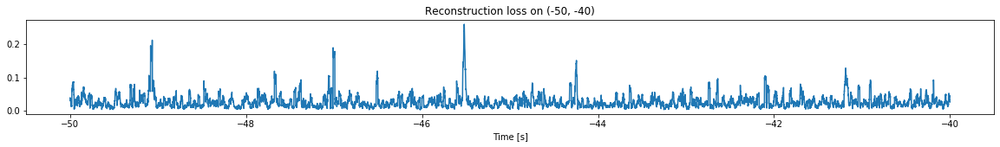

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


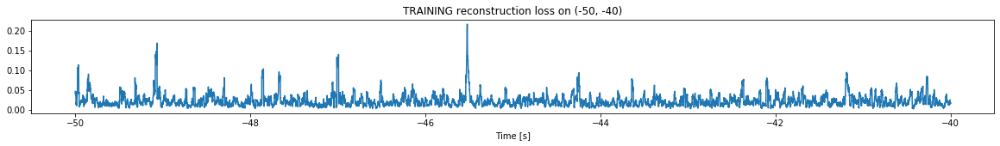

Finished training, median of the log(loss) is:  -1.7042709034677506
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6869322781138965
Triggering threshold is:  3.2333333333333334


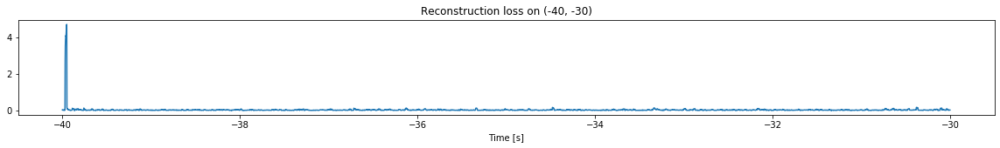

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


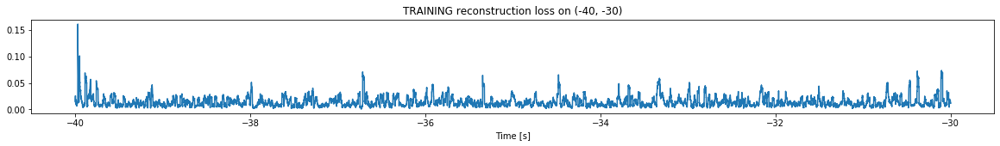

Finished training, median of the log(loss) is:  -1.9365993250909375
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7042709034677506
Triggering threshold is:  2.916666666666667


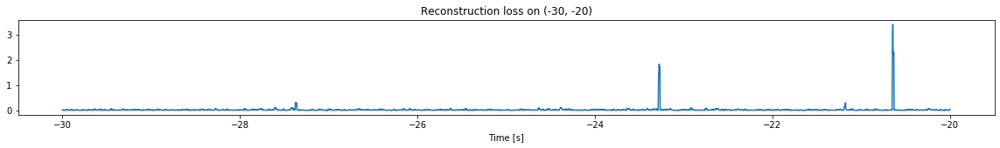

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


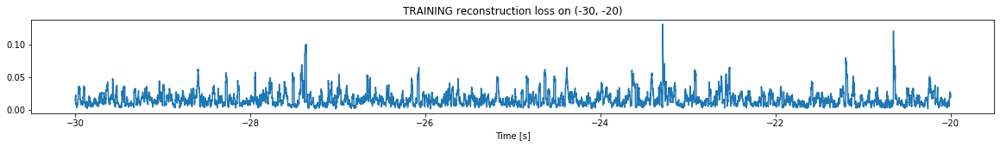

Finished training, median of the log(loss) is:  -1.8551892726244426
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9365993250909375
Triggering threshold is:  2.6


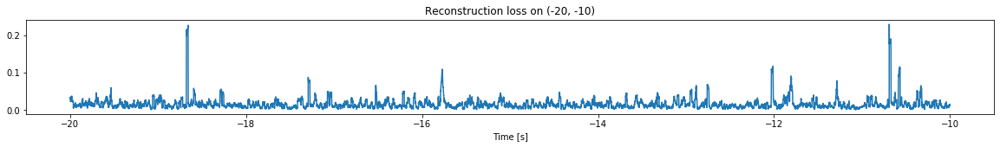

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


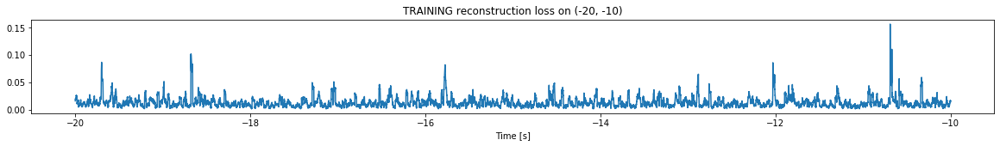

Finished training, median of the log(loss) is:  -1.9555706482383834
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8551892726244426
Triggering threshold is:  2.6


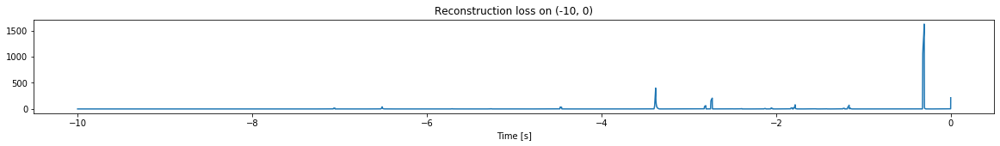

Other trigger time:  [-7.0541997 -6.5119996 -4.4707    -3.3790998 -2.731     -1.7816
 -1.1640999 -0.3037   ]
Their log loss values are:  [3.09288719 3.45368701 3.43954752 4.45570865 4.1709143  3.76302488
 3.71214445 5.06577838]


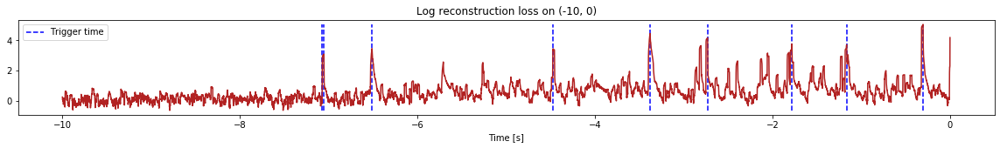

Triggered at:  [-7.0541997, -6.5119996, -4.4707, -3.3790998, -2.731, -1.7816, -1.1640999, -0.3037]
<--------
Finished simulation, all the triggered times are:  [-7.0541997, -6.5119996, -4.4707, -3.3790998, -2.731, -1.7816, -1.1640999, -0.3037]


In [6]:
simulation("./data/Ramp12d/", 10, (-100,0), -7)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2117500, 12)
Flushing input history
Number of sections: 21
Number of triggering sections 7
List of trigger thresholds:  [0, 0, 4.5, 4.025, 3.55, 3.075, 2.6]
Entering sections:  (-210, -200)
-------->
Entering sections:  (-200, -190)
-------->
Training for section:  (None, -200)


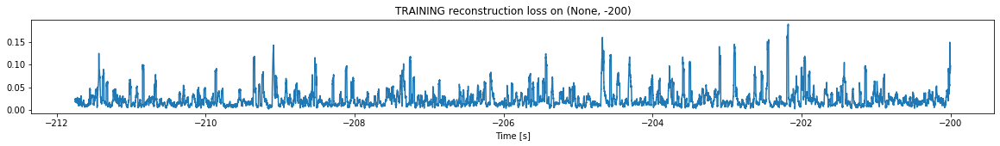

Finished training, median of the log(loss) is:  -1.7334529460545982
<--------
Entering sections:  (-190, -180)
-------->
Training for section:  (-200, -190)


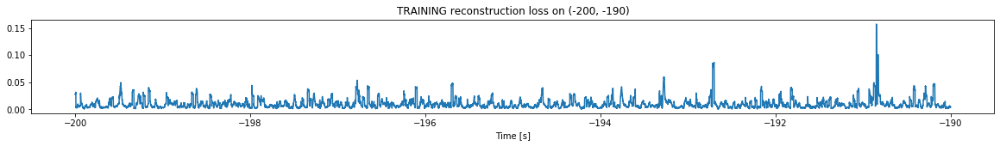

Finished training, median of the log(loss) is:  -2.1074019920861264
Triggering for section:  (-190, -180)
Using this median for triggering: -1.7334529460545982
Triggering threshold is:  4.5


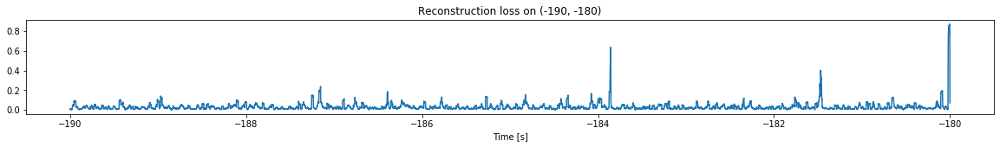

<--------
Entering sections:  (-180, -170)
-------->
Training for section:  (-190, -180)


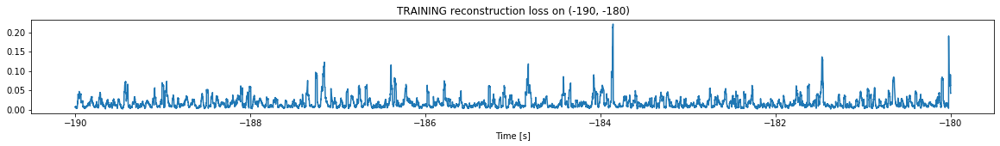

Finished training, median of the log(loss) is:  -1.8602760869883208
Triggering for section:  (-180, -170)
Using this median for triggering: -2.1074019920861264
Triggering threshold is:  4.025


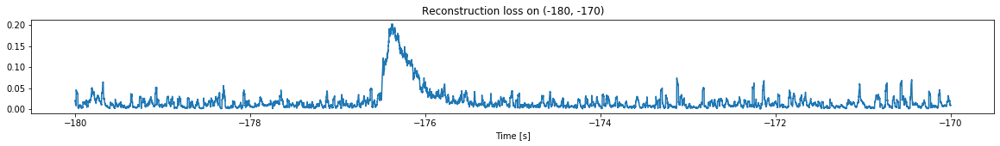

<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


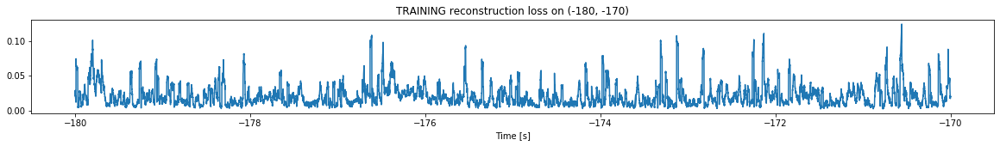

Finished training, median of the log(loss) is:  -1.7617229078940708
Triggering for section:  (-170, -160)
Using this median for triggering: -1.8602760869883208
Triggering threshold is:  3.55


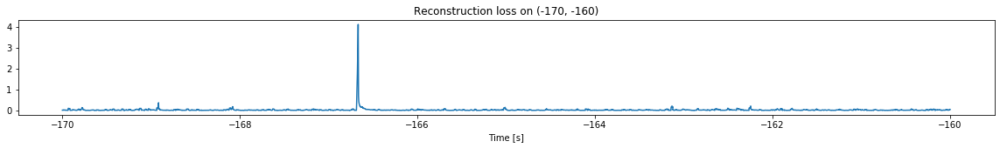

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


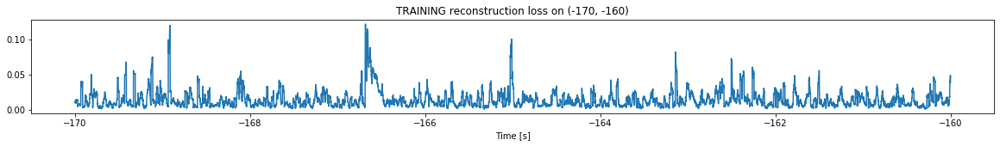

Finished training, median of the log(loss) is:  -1.960018425148745
Triggering for section:  (-160, -150)
Using this median for triggering: -1.7617229078940708
Triggering threshold is:  3.075


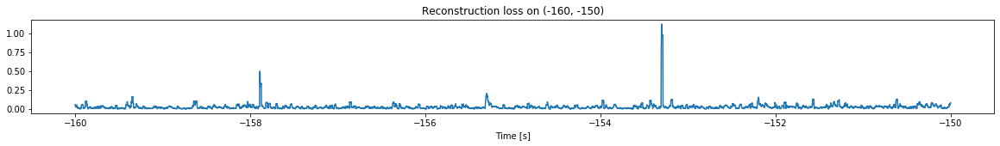

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


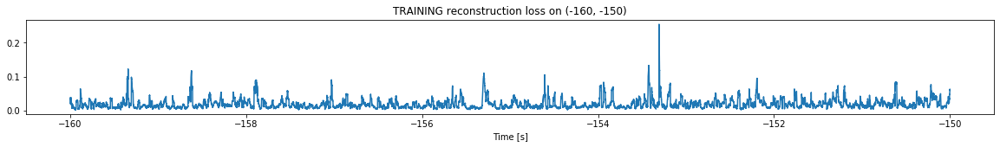

Finished training, median of the log(loss) is:  -1.8183357916522955
Triggering for section:  (-150, -140)
Using this median for triggering: -1.960018425148745
Triggering threshold is:  2.6


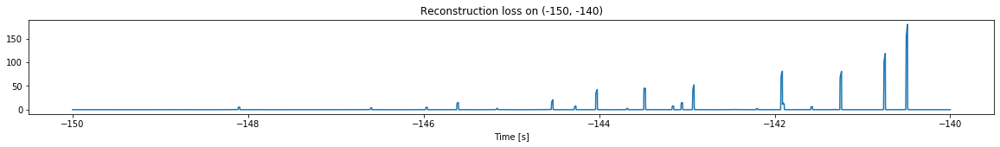

Other trigger time:  [-148.10258 -145.60439 -144.52678 -144.02179 -143.48839 -142.9188
 -141.91309 -141.23909 -140.48679]
Their log loss values are:  [2.71072579 3.13992613 3.28179849 3.58974472 3.61902397 3.67968337
 3.86997665 3.86790235 4.21636739]


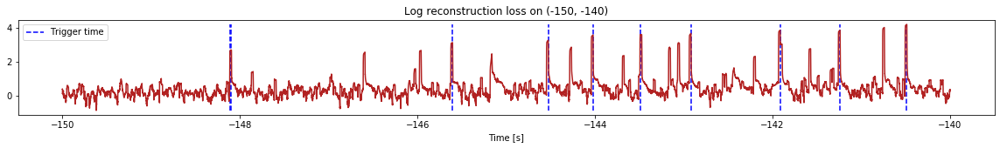

Triggered at:  [-148.10258, -145.60439, -144.52678, -144.02179, -143.48839, -142.9188, -141.91309, -141.23909, -140.48679]
<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


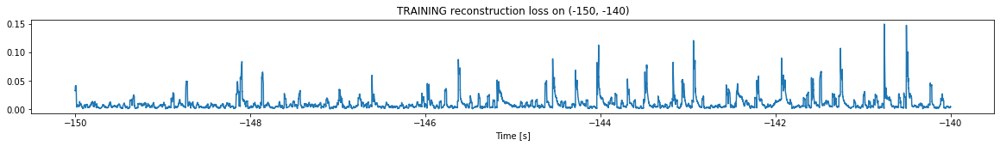

Finished training, median of the log(loss) is:  -2.160494901438078
Triggering for section:  (-140, -130)
Using this median for triggering: -1.8183357916522955
Triggering threshold is:  2.6


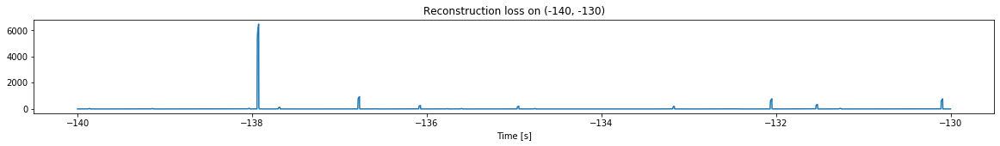

Other trigger time:  [-139.85579 -139.14058 -137.92479 -136.77028 -136.0718  -134.94579
 -133.17009 -132.0474  -131.52489 -130.09099]
Their log loss values are:  [3.32222096 3.27858871 5.63016414 4.79343244 4.23854249 4.15469025
 4.12077103 4.71170055 4.35985738 4.7043297 ]


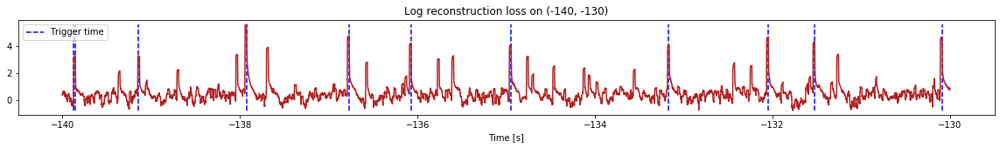

Triggered at:  [-139.85579, -139.14058, -137.92479, -136.77028, -136.0718, -134.94579, -133.17009, -132.0474, -131.52489, -130.09099]
<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


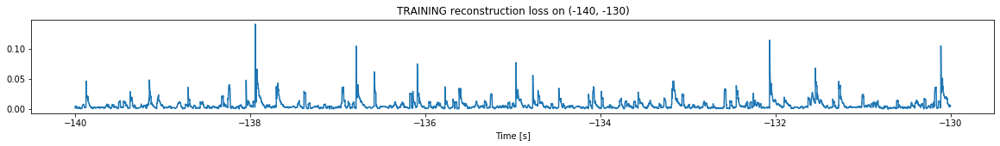

Finished training, median of the log(loss) is:  -2.3497752335129594
Triggering for section:  (-130, -120)
Using this median for triggering: -2.160494901438078
Triggering threshold is:  2.6


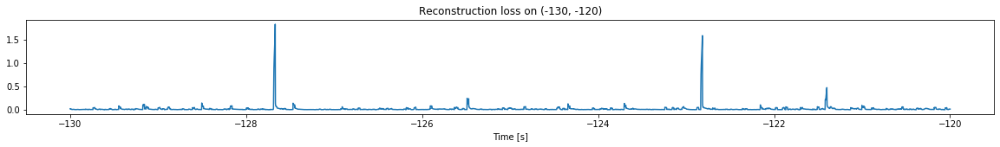

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


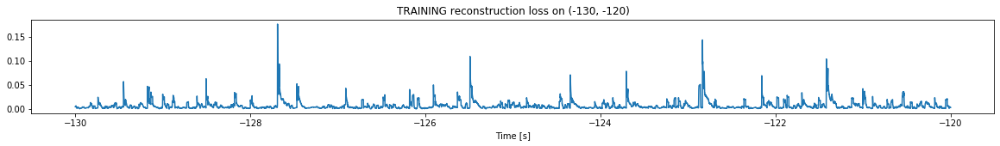

Finished training, median of the log(loss) is:  -2.3245878707011123
Triggering for section:  (-120, -110)
Using this median for triggering: -2.3497752335129594
Triggering threshold is:  2.6


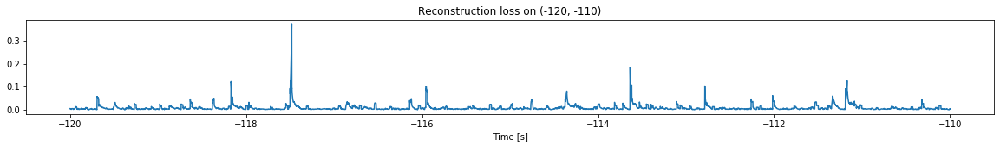

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


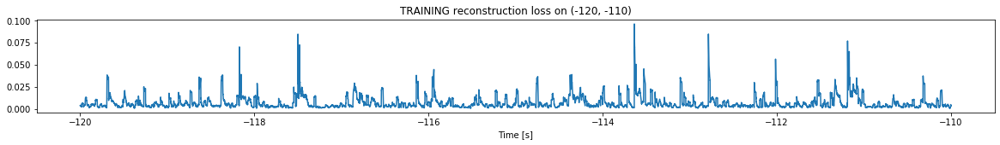

Finished training, median of the log(loss) is:  -2.3614642027776336
Triggering for section:  (-110, -100)
Using this median for triggering: -2.3245878707011123
Triggering threshold is:  2.6


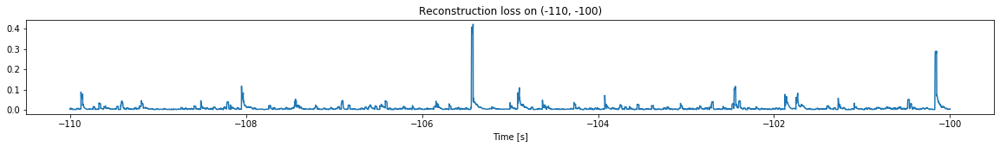

<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


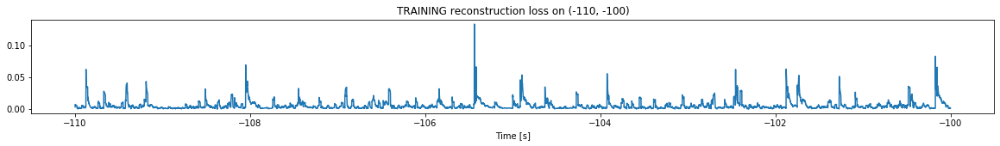

Finished training, median of the log(loss) is:  -2.415104121006692
Triggering for section:  (-100, -90)
Using this median for triggering: -2.3614642027776336
Triggering threshold is:  2.6


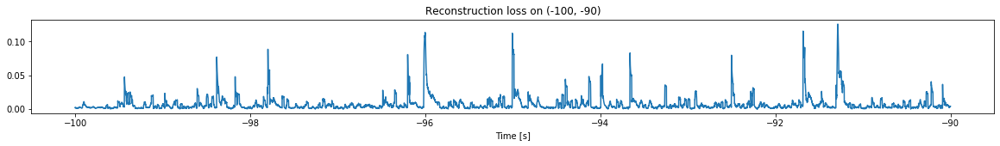

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


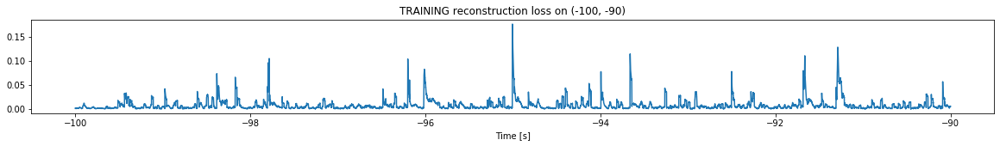

Finished training, median of the log(loss) is:  -2.293471837118788
Triggering for section:  (-90, -80)
Using this median for triggering: -2.415104121006692
Triggering threshold is:  2.6


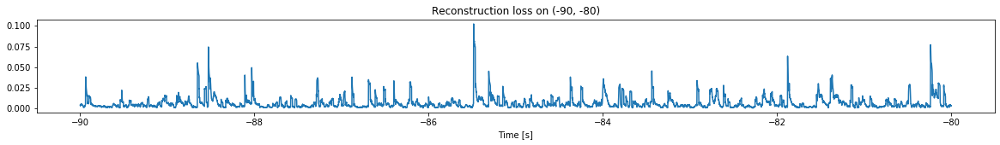

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


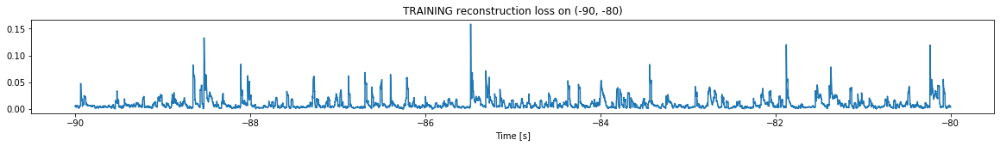

Finished training, median of the log(loss) is:  -2.1584261548888284
Triggering for section:  (-80, -70)
Using this median for triggering: -2.293471837118788
Triggering threshold is:  2.6


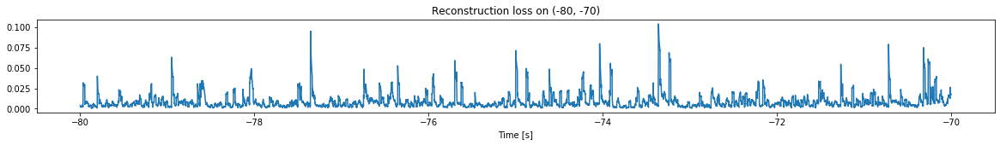

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


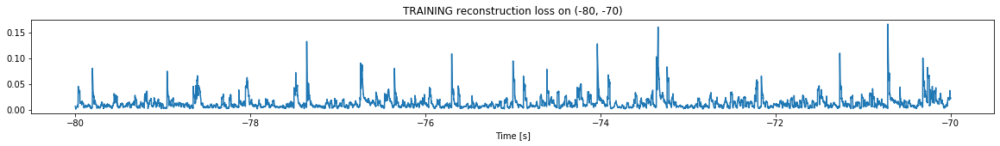

Finished training, median of the log(loss) is:  -2.018591541690882
Triggering for section:  (-70, -60)
Using this median for triggering: -2.1584261548888284
Triggering threshold is:  2.6


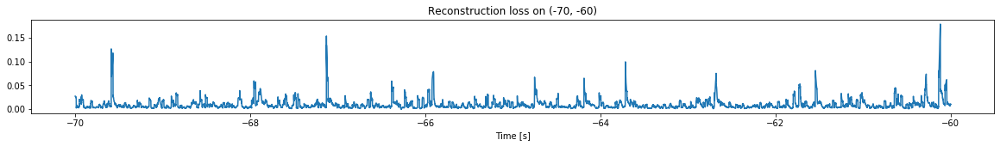

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


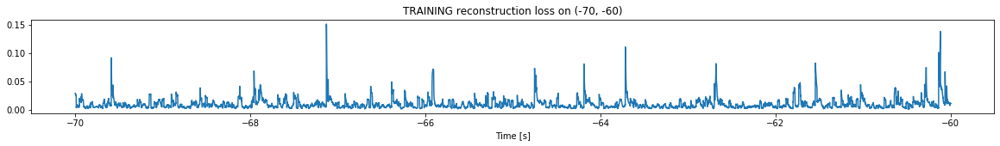

Finished training, median of the log(loss) is:  -2.138160271364785
Triggering for section:  (-60, -50)
Using this median for triggering: -2.018591541690882
Triggering threshold is:  2.6


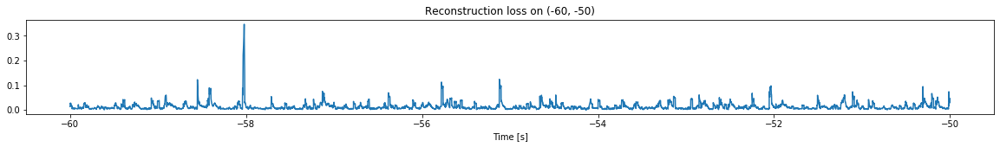

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


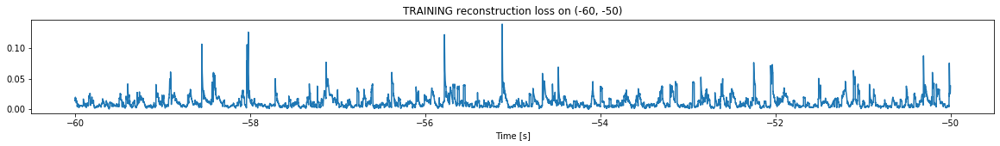

Finished training, median of the log(loss) is:  -2.0600157089920224
Triggering for section:  (-50, -40)
Using this median for triggering: -2.138160271364785
Triggering threshold is:  2.6


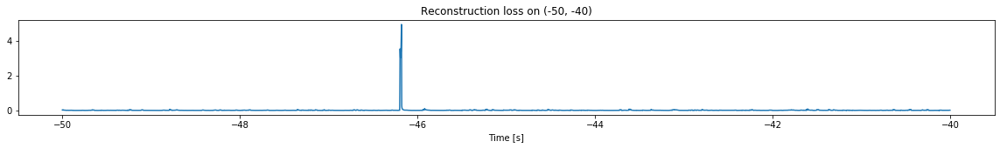

Other trigger time:  [-46.17999]
Their log loss values are:  [2.83454981]


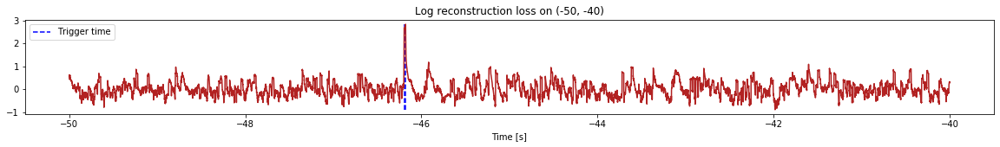

Triggered at:  [-46.17999]
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


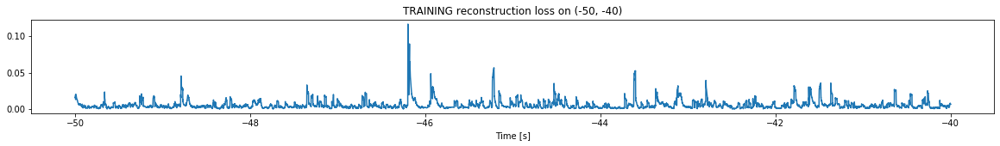

Finished training, median of the log(loss) is:  -2.3632408422638997
Triggering for section:  (-40, -30)
Using this median for triggering: -2.0600157089920224
Triggering threshold is:  2.6


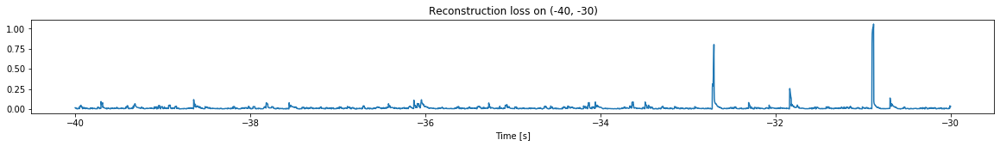

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


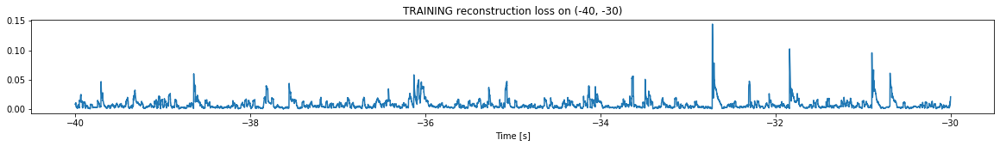

Finished training, median of the log(loss) is:  -2.2549123445476025
Triggering for section:  (-30, -20)
Using this median for triggering: -2.3632408422638997
Triggering threshold is:  2.6


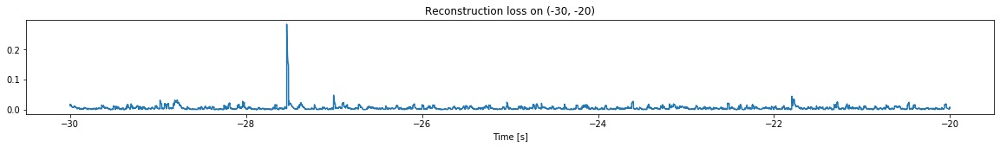

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


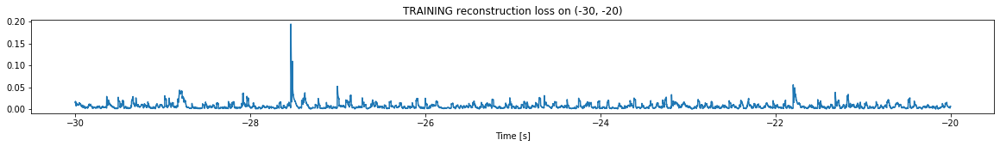

Finished training, median of the log(loss) is:  -2.2598191178370763
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2549123445476025
Triggering threshold is:  2.6


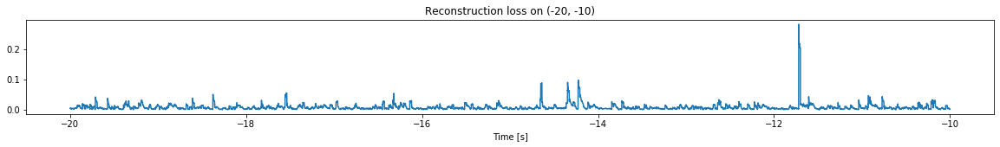

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


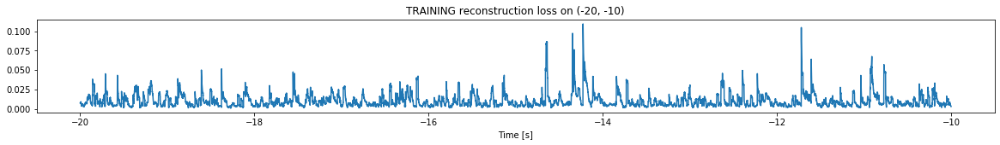

Finished training, median of the log(loss) is:  -2.1188188335826394
Triggering for section:  (-10, 0)
Using this median for triggering: -2.2598191178370763
Triggering threshold is:  2.6


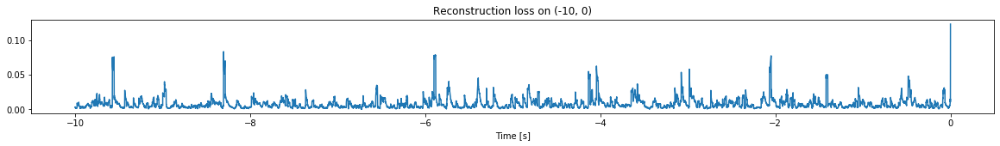

<--------
Finished simulation, all the triggered times are:  [-148.10258, -145.60439, -144.52678, -144.02179, -143.48839, -142.9188, -141.91309, -141.23909, -140.48679, -139.85579, -139.14058, -137.92479, -136.77028, -136.0718, -134.94579, -133.17009, -132.0474, -131.52489, -130.09099, -46.17999]


In [7]:
simulation("./data/Ramp20/", 10, (-212,0), -142)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1197500, 12)
Flushing input history
Number of sections: 12
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


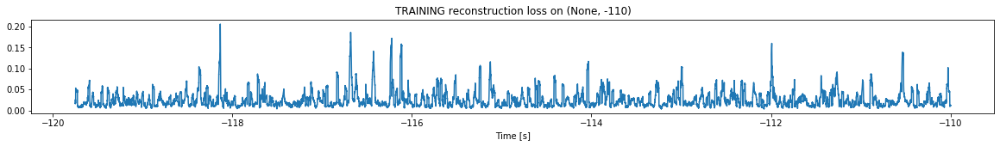

Finished training, median of the log(loss) is:  -1.7026994294138067
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


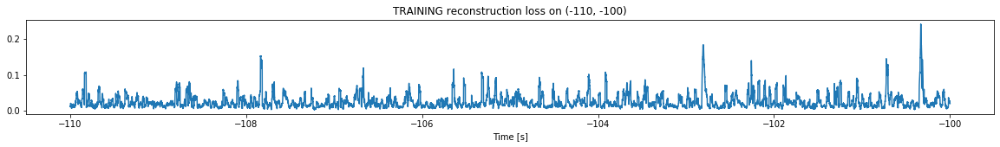

Finished training, median of the log(loss) is:  -1.687022713977838
Triggering for section:  (-100, -90)
Using this median for triggering: -1.7026994294138067
Triggering threshold is:  4.5


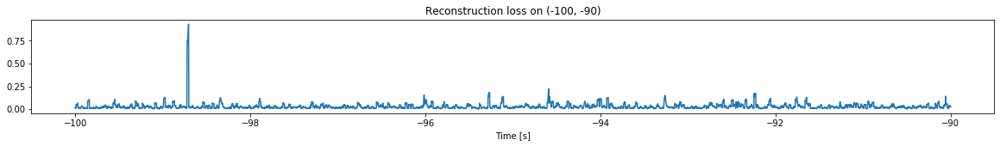

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


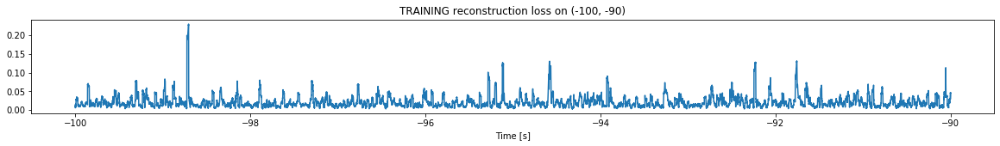

Finished training, median of the log(loss) is:  -1.7654820678832244
Triggering for section:  (-90, -80)
Using this median for triggering: -1.687022713977838
Triggering threshold is:  4.12


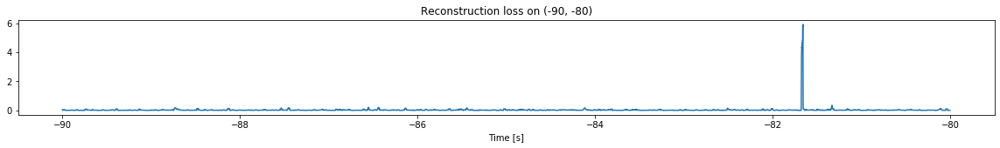

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


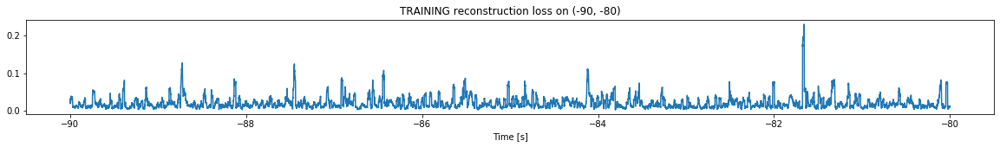

Finished training, median of the log(loss) is:  -1.8052083467069275
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7654820678832244
Triggering threshold is:  3.74


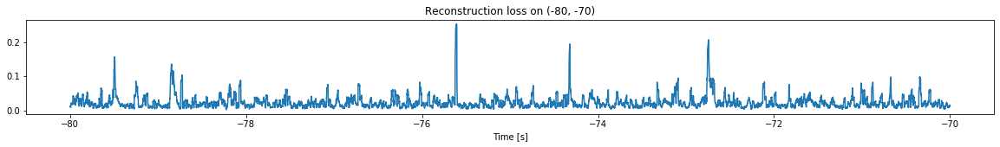

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


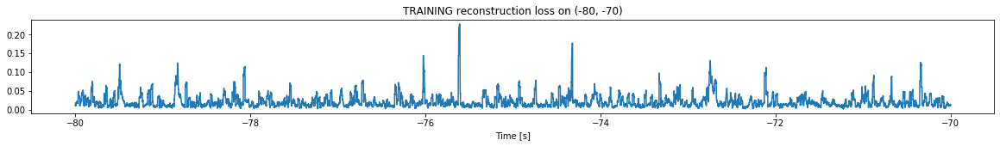

Finished training, median of the log(loss) is:  -1.749035457975341
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8052083467069275
Triggering threshold is:  3.36


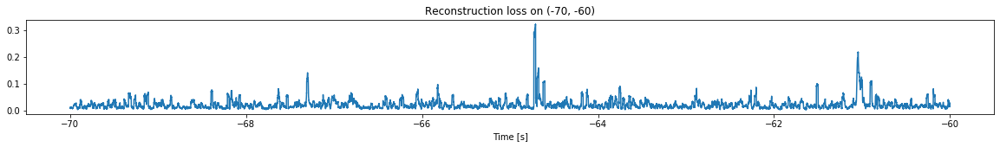

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


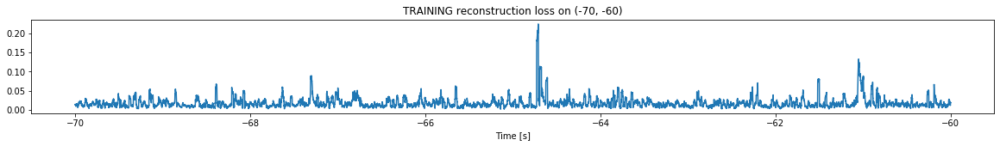

Finished training, median of the log(loss) is:  -1.8382679071251502
Triggering for section:  (-60, -50)
Using this median for triggering: -1.749035457975341
Triggering threshold is:  2.98


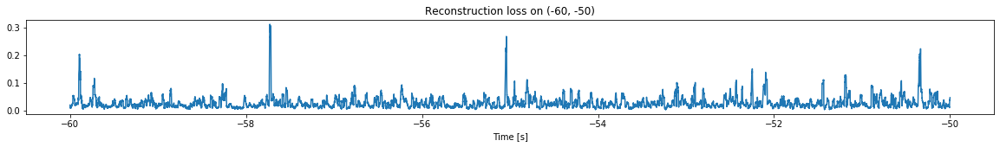

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


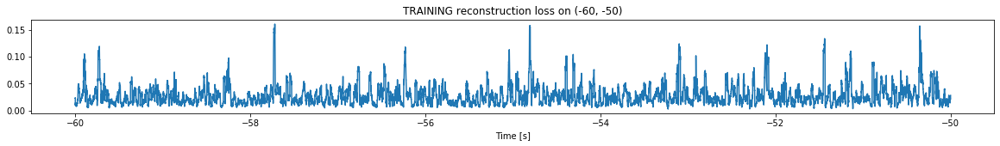

Finished training, median of the log(loss) is:  -1.6243014649822967
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8382679071251502
Triggering threshold is:  2.6


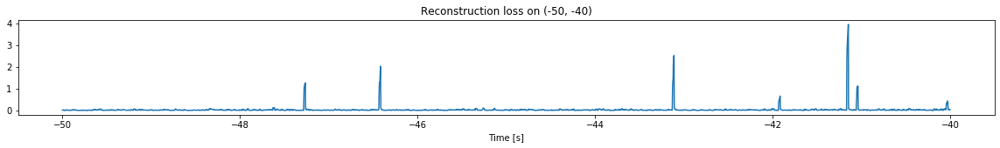

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


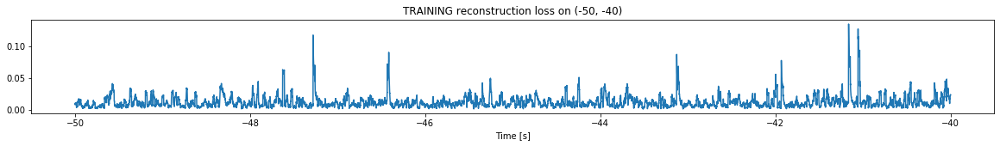

Finished training, median of the log(loss) is:  -1.9856618797417669
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6243014649822967
Triggering threshold is:  2.6


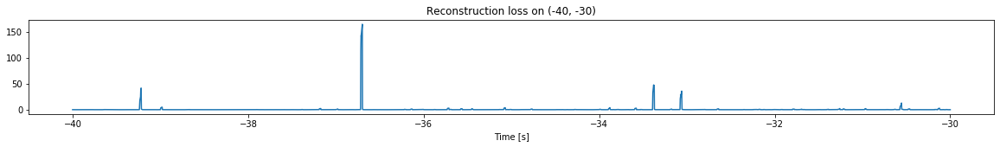

Other trigger time:  [-39.2193   -36.6991   -33.379498 -30.5548  ]
Their log loss values are:  [3.24461994 3.84117894 3.30347301 2.73540276]


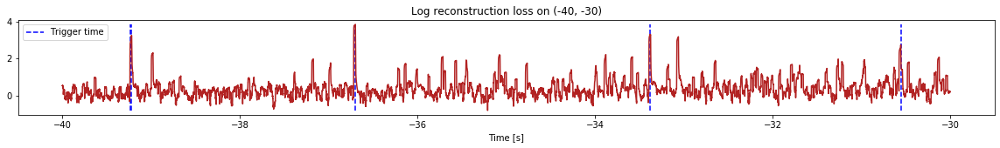

Triggered at:  [-39.2193, -36.6991, -33.379498, -30.5548]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


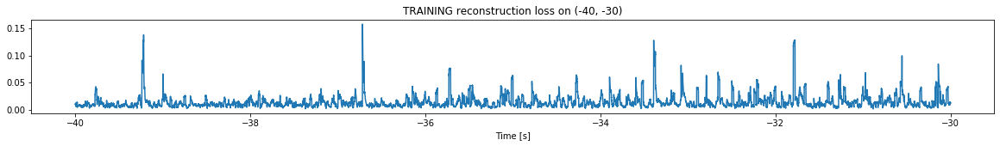

Finished training, median of the log(loss) is:  -1.978848468910704
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9856618797417669
Triggering threshold is:  2.6


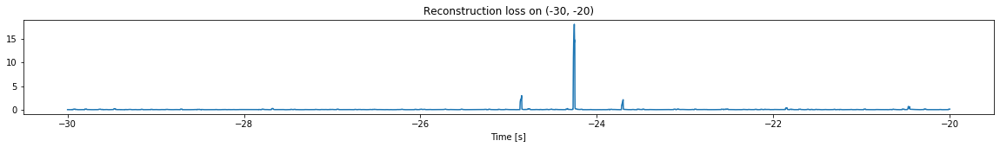

Other trigger time:  [-24.255999]
Their log loss values are:  [3.24350456]


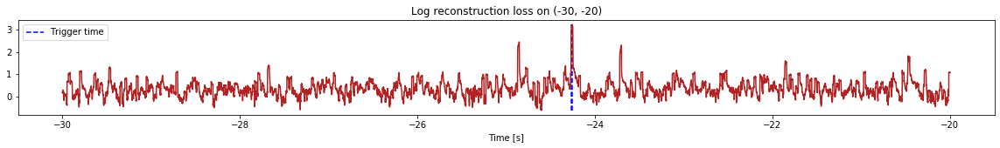

Triggered at:  [-24.255999]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


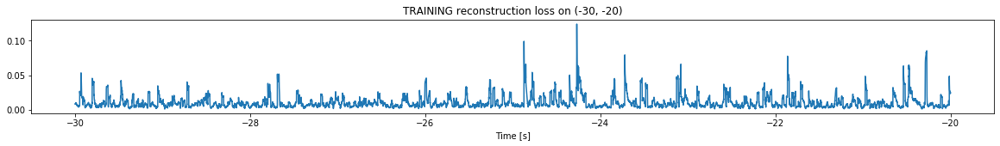

Finished training, median of the log(loss) is:  -2.1082717185249207
Triggering for section:  (-20, -10)
Using this median for triggering: -1.978848468910704
Triggering threshold is:  2.6


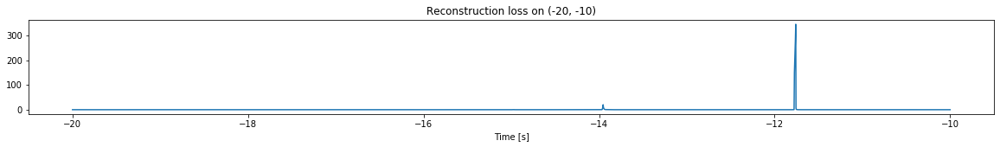

Other trigger time:  [-13.9534 -11.759 ]
Their log loss values are:  [3.28535083 4.51873327]


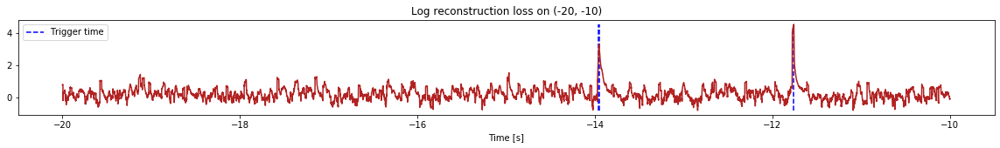

Triggered at:  [-13.9534, -11.759]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


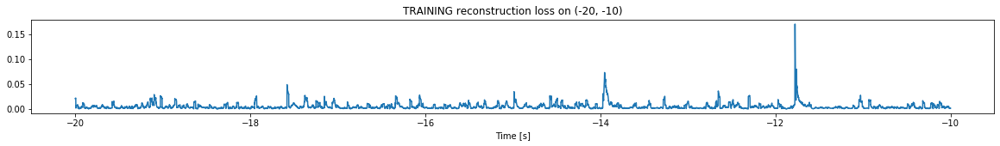

Finished training, median of the log(loss) is:  -2.428671228375655
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1082717185249207
Triggering threshold is:  2.6


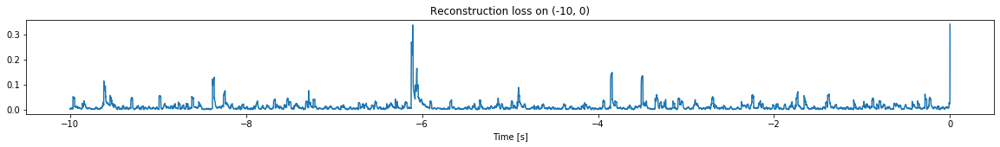

<--------
Finished simulation, all the triggered times are:  [-39.2193, -36.6991, -33.379498, -30.5548, -24.255999, -13.9534, -11.759]


In [8]:
simulation("./data/Ramp21/", 10, (-120,0), -31.1)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (797500, 12)
Flushing input history
Number of sections: 8
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-80, -70)
-------->
Entering sections:  (-70, -60)
-------->
Training for section:  (None, -70)


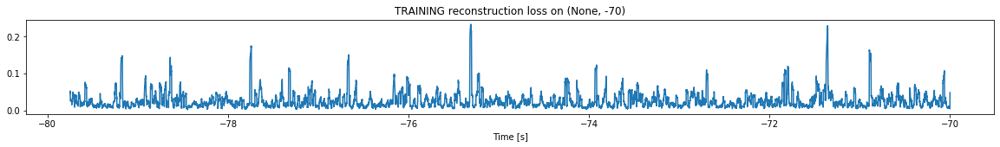

Finished training, median of the log(loss) is:  -1.6703794307030861
<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


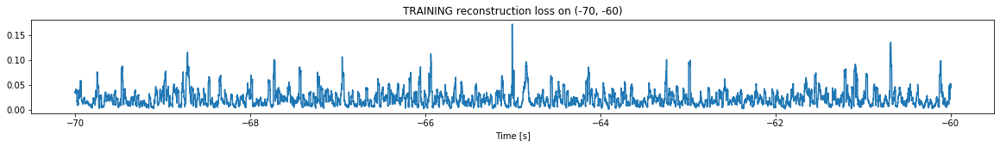

Finished training, median of the log(loss) is:  -1.7066084451694148
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6703794307030861
Triggering threshold is:  4.5


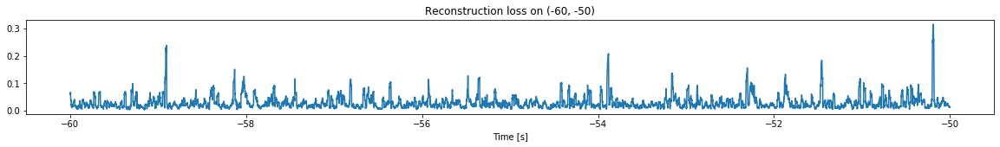

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


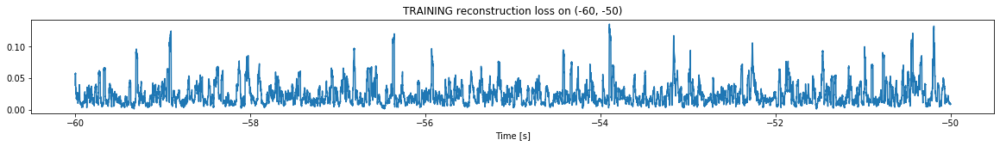

Finished training, median of the log(loss) is:  -1.6972544477718767
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7066084451694148
Triggering threshold is:  4.12


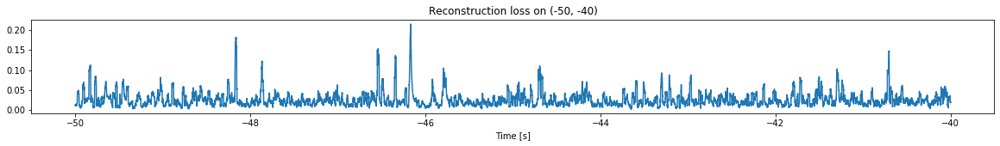

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


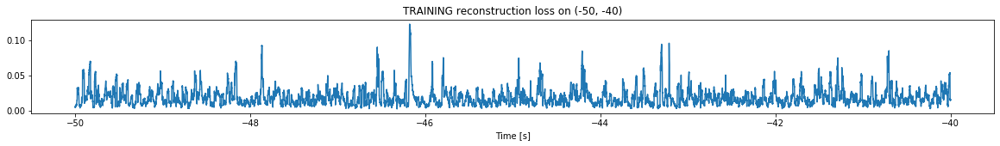

Finished training, median of the log(loss) is:  -1.794061903150439
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6972544477718767
Triggering threshold is:  3.74


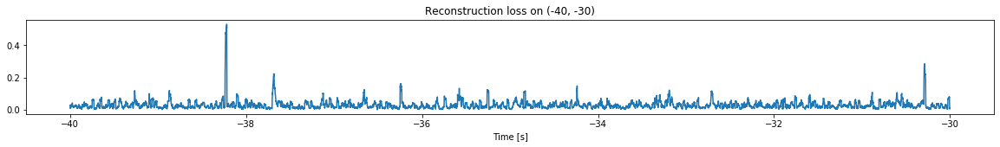

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


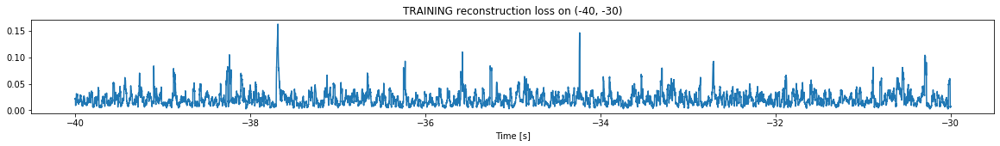

Finished training, median of the log(loss) is:  -1.7261847112722202
Triggering for section:  (-30, -20)
Using this median for triggering: -1.794061903150439
Triggering threshold is:  3.36


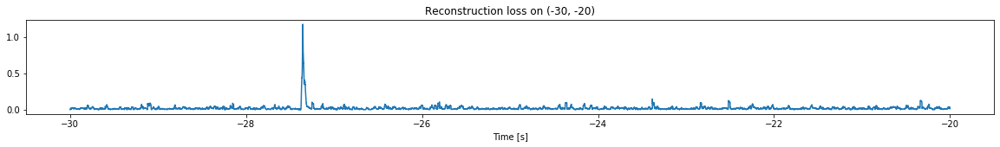

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


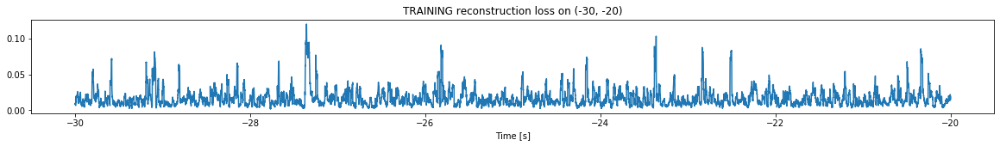

Finished training, median of the log(loss) is:  -1.860486031724884
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7261847112722202
Triggering threshold is:  2.98


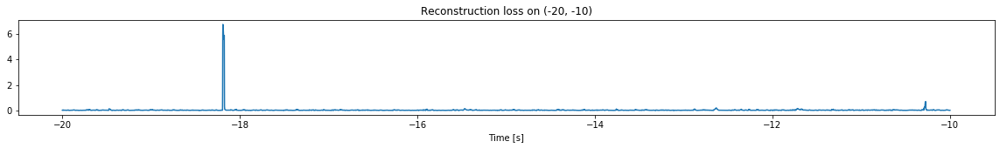

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


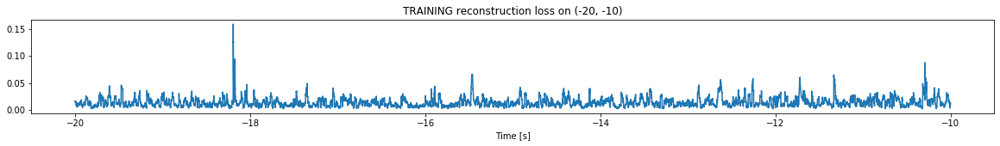

Finished training, median of the log(loss) is:  -1.9307718012470252
Triggering for section:  (-10, 0)
Using this median for triggering: -1.860486031724884
Triggering threshold is:  2.6


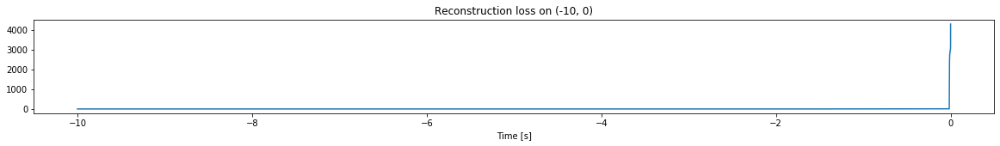

Other trigger time:  []
Their log loss values are:  []


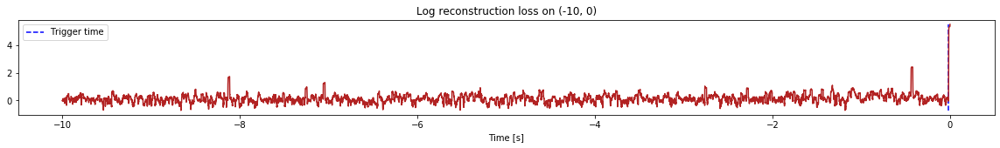

Triggered at:  []
<--------
Finished simulation, all the triggered times are:  []


In [9]:
simulation("./data/Ramp22/", 10, (-80,0), 3)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (497500, 12)
Flushing input history
Number of sections: 5
Number of triggering sections 4
List of trigger thresholds:  [0, 0, 4.5, 2.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


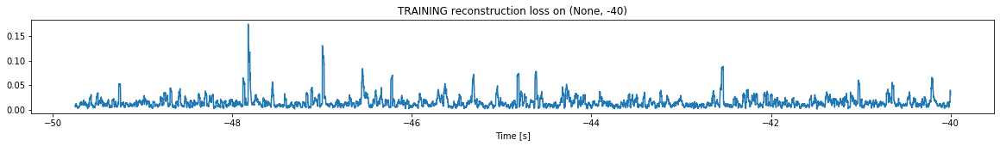

Finished training, median of the log(loss) is:  -1.9049888660833991
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


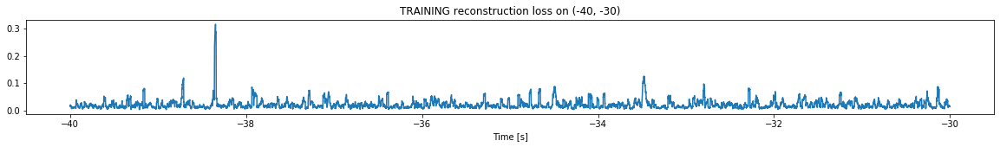

Finished training, median of the log(loss) is:  -1.7624878540230826
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9049888660833991
Triggering threshold is:  4.5


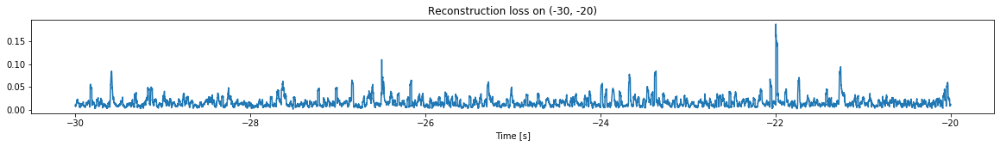

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


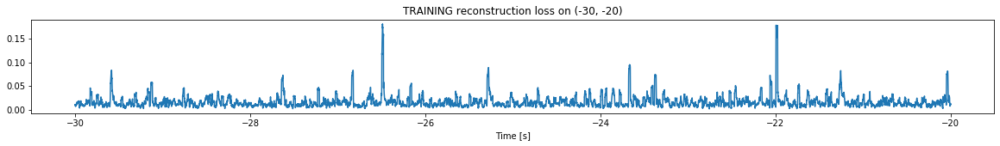

Finished training, median of the log(loss) is:  -1.8747574093790722
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7624878540230826
Triggering threshold is:  2.6


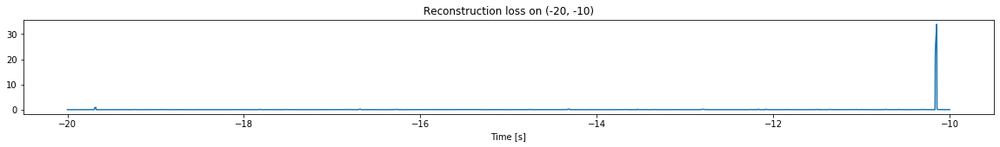

Other trigger time:  [-10.1461]
Their log loss values are:  [3.29317737]


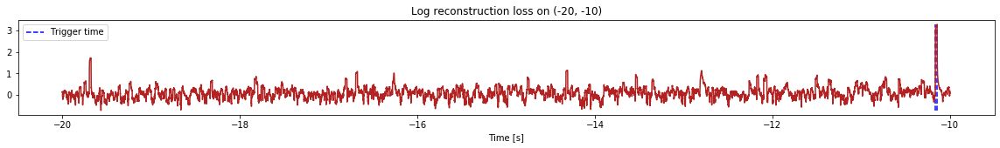

Triggered at:  [-10.1461]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


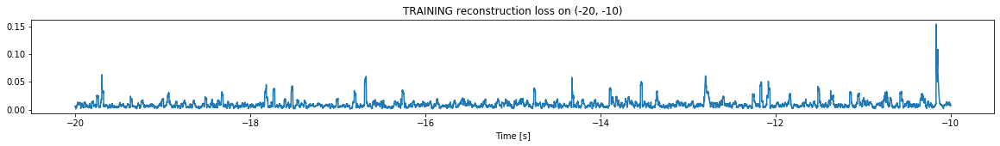

Finished training, median of the log(loss) is:  -2.0989367473965403
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8747574093790722
Triggering threshold is:  2.6


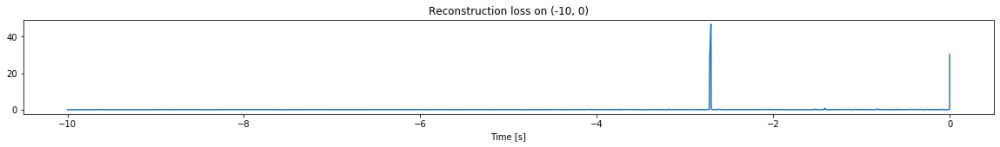

Other trigger time:  [-2.7054]
Their log loss values are:  [3.54545477]


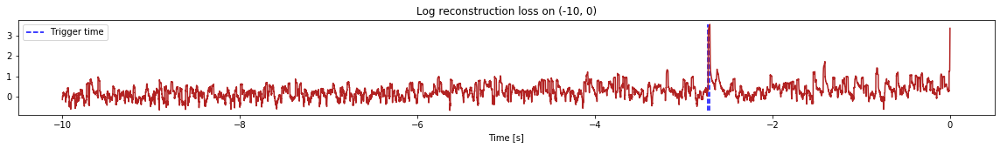

Triggered at:  [-2.7054]
<--------
Finished simulation, all the triggered times are:  [-10.1461, -2.7054]


In [18]:
simulation("./data/Ramp23/", 10, (-50,0), -6)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


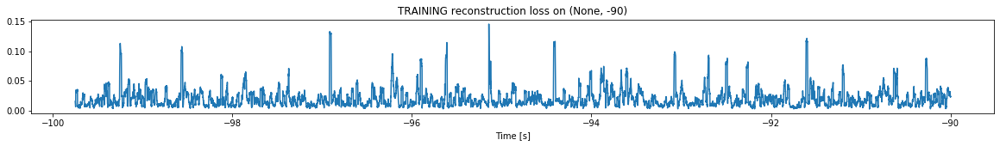

Finished training, median of the log(loss) is:  -1.790680995224673
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


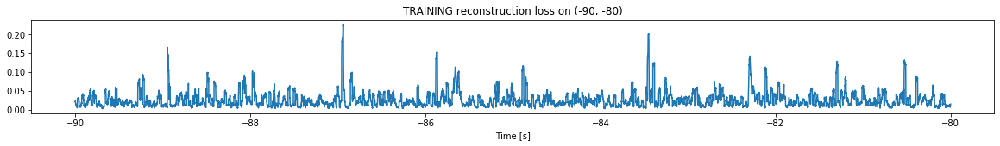

Finished training, median of the log(loss) is:  -1.672516613249765
Triggering for section:  (-80, -70)
Using this median for triggering: -1.790680995224673
Triggering threshold is:  4.5


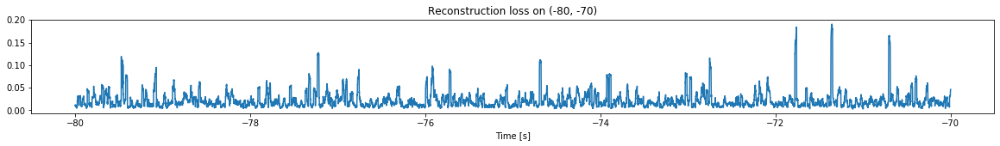

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


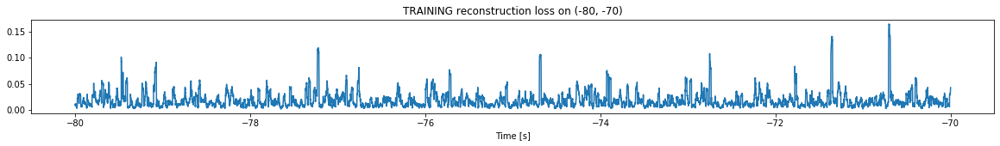

Finished training, median of the log(loss) is:  -1.833507738120891
Triggering for section:  (-70, -60)
Using this median for triggering: -1.672516613249765
Triggering threshold is:  4.12


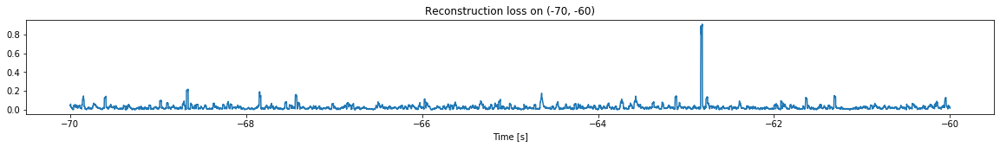

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


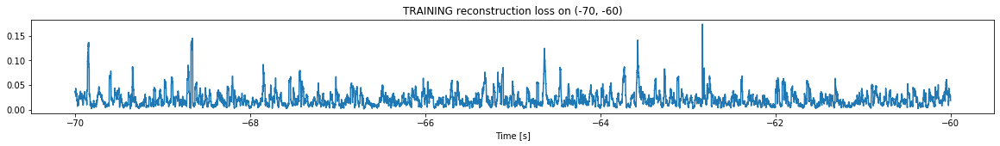

Finished training, median of the log(loss) is:  -1.7421478167607707
Triggering for section:  (-60, -50)
Using this median for triggering: -1.833507738120891
Triggering threshold is:  3.74


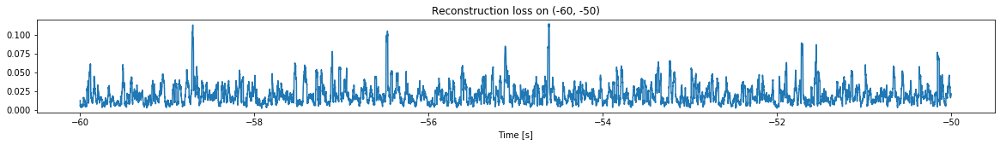

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


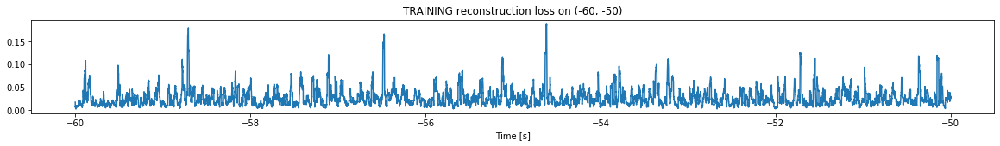

Finished training, median of the log(loss) is:  -1.6431714513807496
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7421478167607707
Triggering threshold is:  3.36


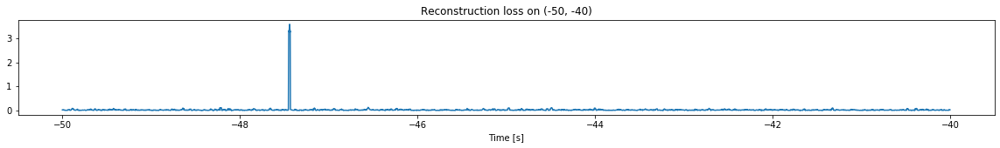

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


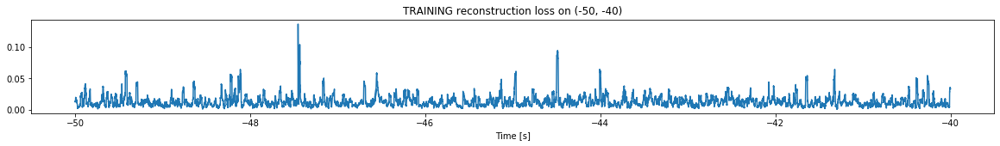

Finished training, median of the log(loss) is:  -1.9387071182847335
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6431714513807496
Triggering threshold is:  2.98


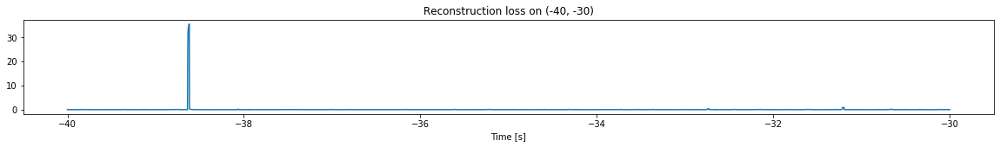

Other trigger time:  [-38.621597]
Their log loss values are:  [3.19372056]


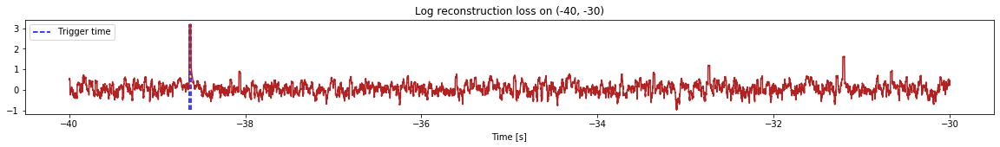

Triggered at:  [-38.621597]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


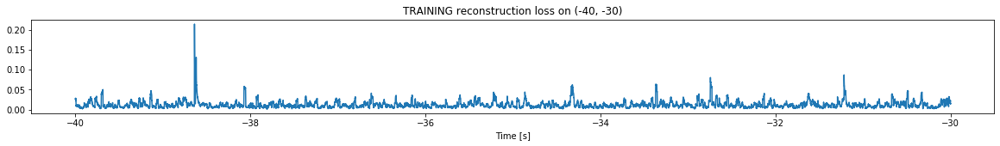

Finished training, median of the log(loss) is:  -1.9873280172447652
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9387071182847335
Triggering threshold is:  2.6


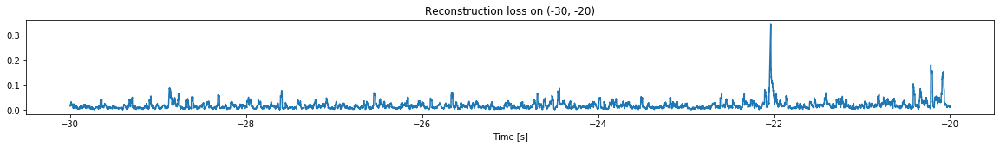

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


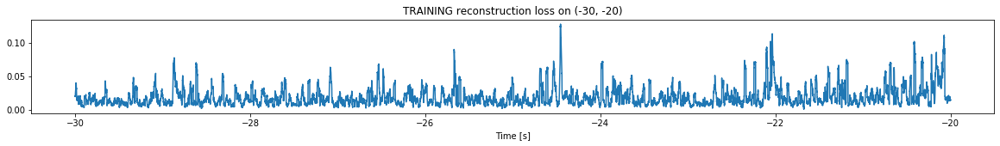

Finished training, median of the log(loss) is:  -1.8166916053604247
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9873280172447652
Triggering threshold is:  2.6


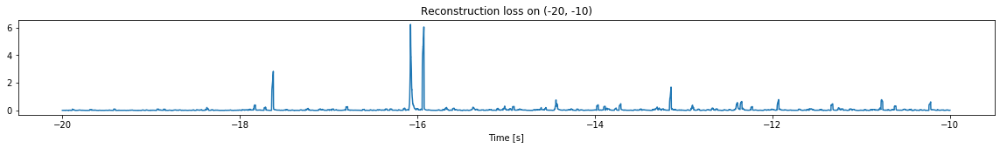

Other trigger time:  [-16.0774]
Their log loss values are:  [2.78199126]


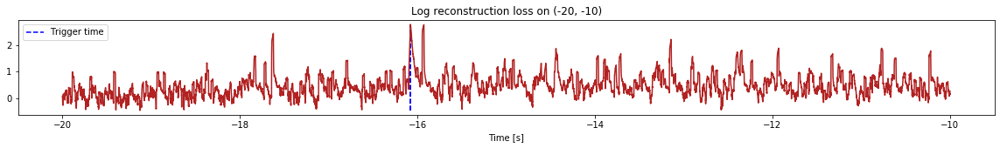

Triggered at:  [-16.0774]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


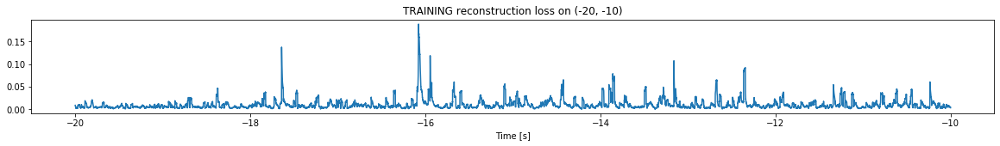

Finished training, median of the log(loss) is:  -2.1025053735869728
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8166916053604247
Triggering threshold is:  2.6


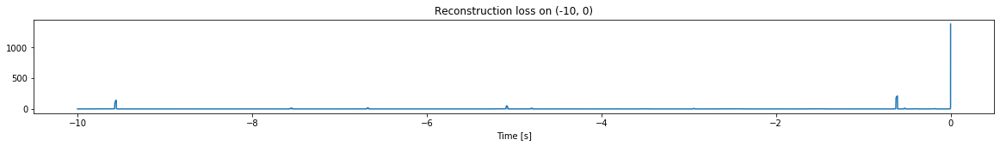

Other trigger time:  [-9.5575    -7.5442996 -6.6685    -5.0804    -2.9331    -0.6089   ]
Their log loss values are:  [3.9740805  2.94696717 3.1053105  3.53049541 2.73298724 4.14301861]


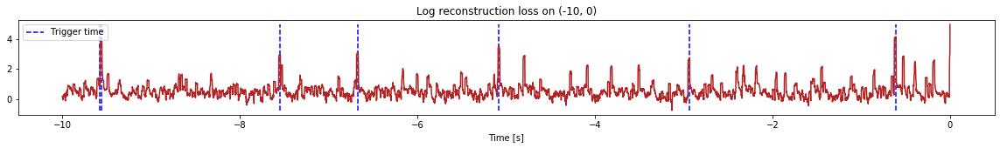

Triggered at:  [-9.5575, -7.5442996, -6.6685, -5.0804, -2.9331, -0.6089]
<--------
Finished simulation, all the triggered times are:  [-38.621597, -16.0774, -9.5575, -7.5442996, -6.6685, -5.0804, -2.9331, -0.6089]


In [11]:
simulation("./data/Ramp24/", 10, (-100,0), -19.3)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 4.5, 4.183333333333334, 3.8666666666666667, 3.55, 3.2333333333333334, 2.916666666666667, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


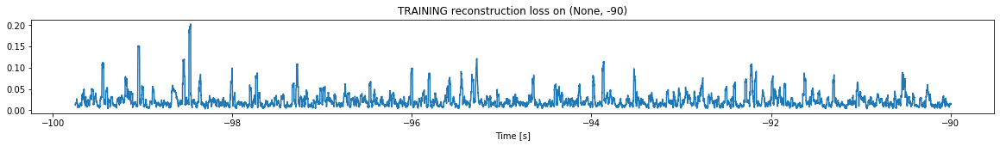

Finished training, median of the log(loss) is:  -1.7411672501560926
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


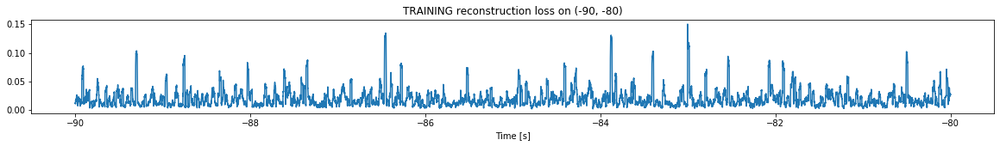

Finished training, median of the log(loss) is:  -1.7944183700512397
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7411672501560926
Triggering threshold is:  4.5


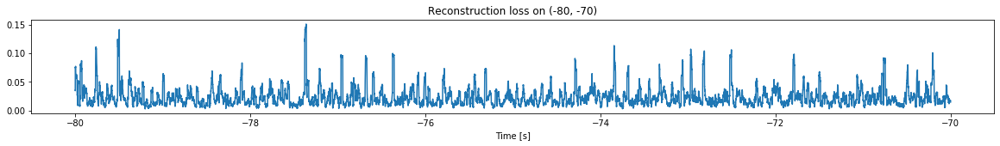

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


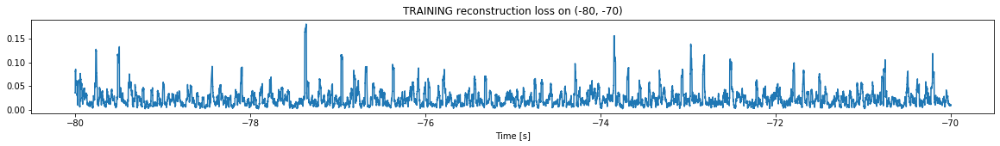

Finished training, median of the log(loss) is:  -1.7094782141017113
Triggering for section:  (-70, -60)
Using this median for triggering: -1.7944183700512397
Triggering threshold is:  4.183333333333334


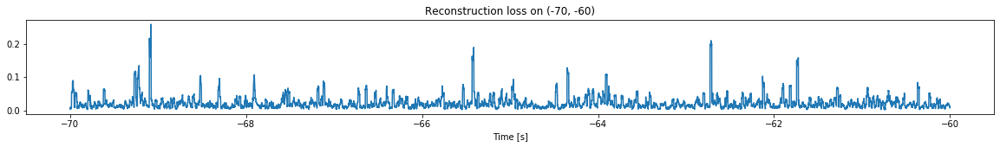

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


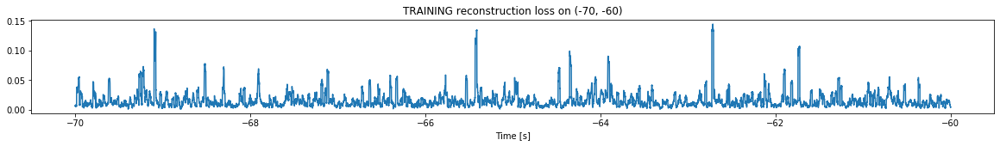

Finished training, median of the log(loss) is:  -1.9062518080741215
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7094782141017113
Triggering threshold is:  3.8666666666666667


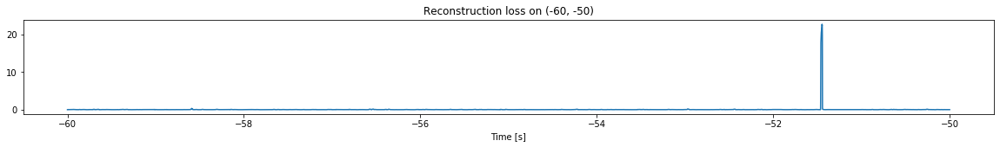

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


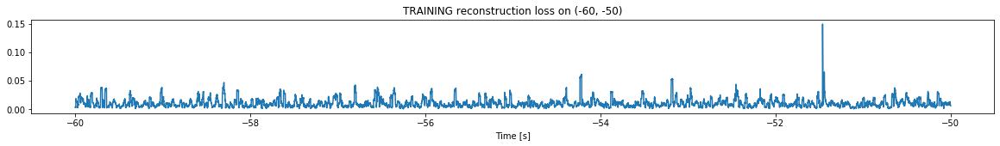

Finished training, median of the log(loss) is:  -2.0424062021172897
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9062518080741215
Triggering threshold is:  3.55


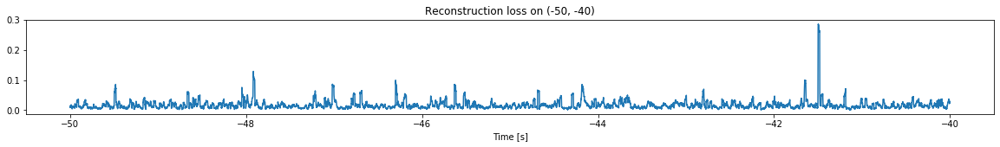

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


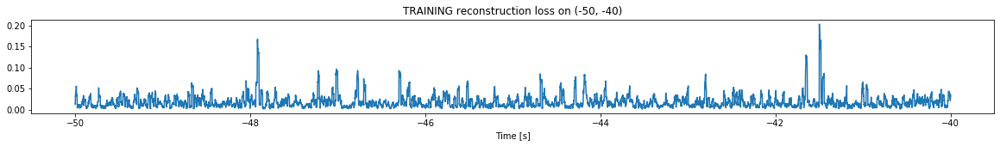

Finished training, median of the log(loss) is:  -1.8305922087663546
Triggering for section:  (-40, -30)
Using this median for triggering: -2.0424062021172897
Triggering threshold is:  3.2333333333333334


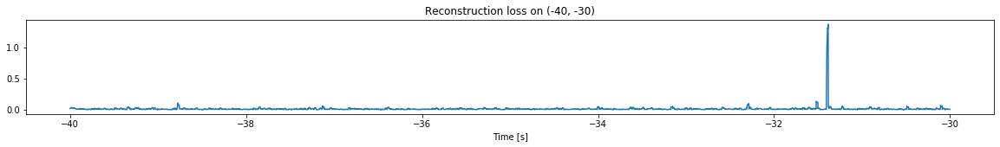

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


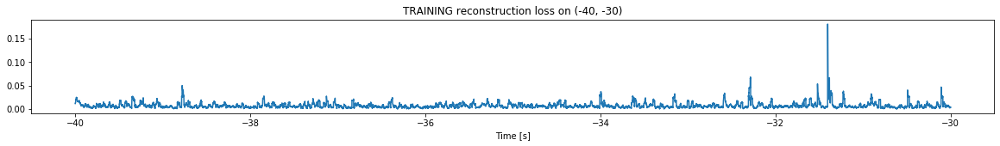

Finished training, median of the log(loss) is:  -2.186670140276917
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8305922087663546
Triggering threshold is:  2.916666666666667


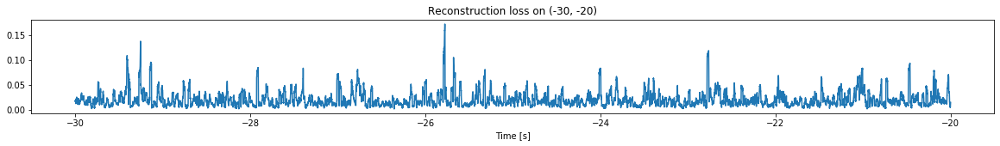

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


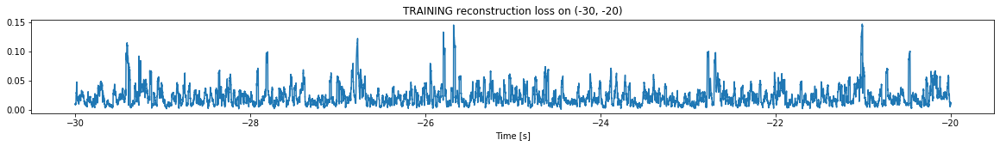

Finished training, median of the log(loss) is:  -1.711690980731949
Triggering for section:  (-20, -10)
Using this median for triggering: -2.186670140276917
Triggering threshold is:  2.6


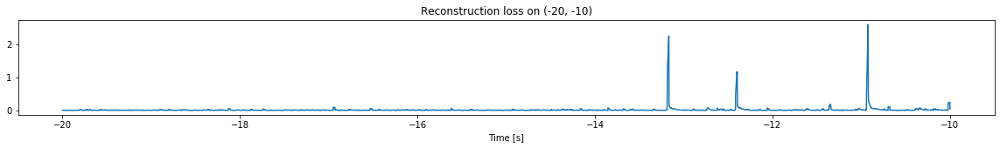

Other trigger time:  [-10.922299]
Their log loss values are:  [2.60445411]


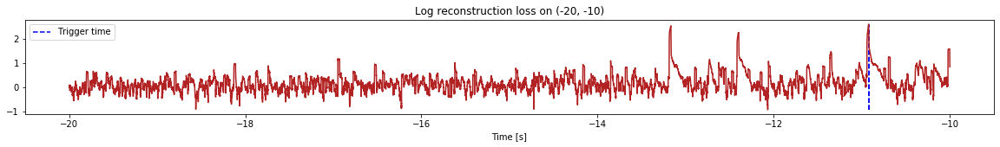

Triggered at:  [-10.922299]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


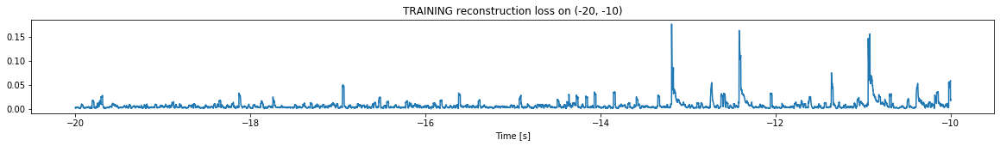

Finished training, median of the log(loss) is:  -2.293444095016607
Triggering for section:  (-10, 0)
Using this median for triggering: -1.711690980731949
Triggering threshold is:  2.6


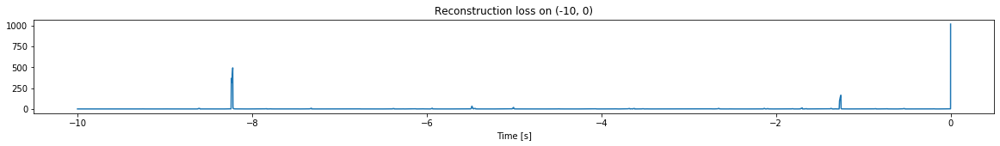

Other trigger time:  [-8.2217    -7.3210998 -5.4825    -2.6526    -2.1334    -1.2574999]
Their log loss values are:  [4.40641228 2.68691668 3.23442235 2.61292649 2.60158108 3.93272644]


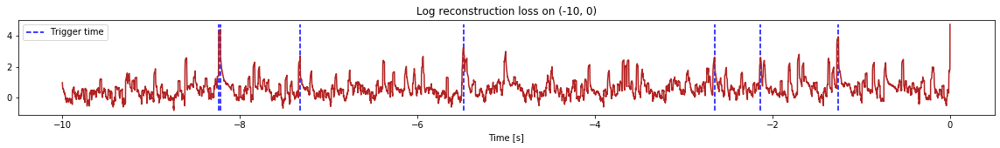

Triggered at:  [-8.2217, -7.3210998, -5.4825, -2.6526, -2.1334, -1.2574999]
<--------
Finished simulation, all the triggered times are:  [-10.922299, -8.2217, -7.3210998, -5.4825, -2.6526, -2.1334, -1.2574999]


In [12]:
simulation("./data/Ramp25/", 10, (-100,0), -10)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1097500, 12)
Flushing input history
Number of sections: 11
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


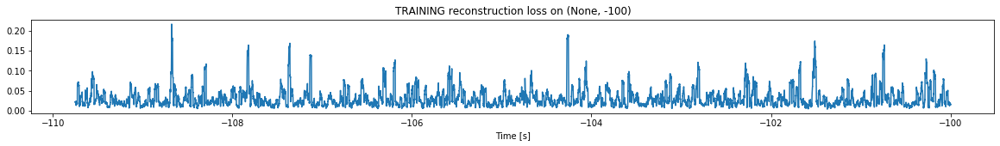

Finished training, median of the log(loss) is:  -1.6043559282311526
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


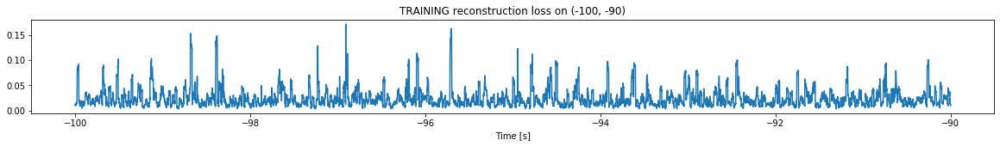

Finished training, median of the log(loss) is:  -1.708215518968802
Triggering for section:  (-90, -80)
Using this median for triggering: -1.6043559282311526
Triggering threshold is:  4.5


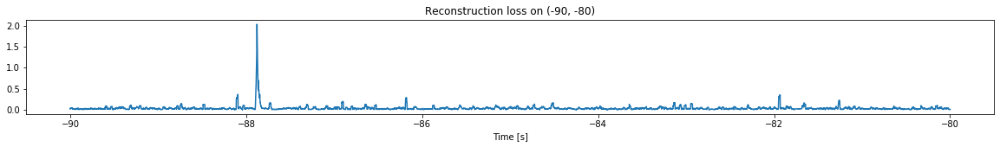

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


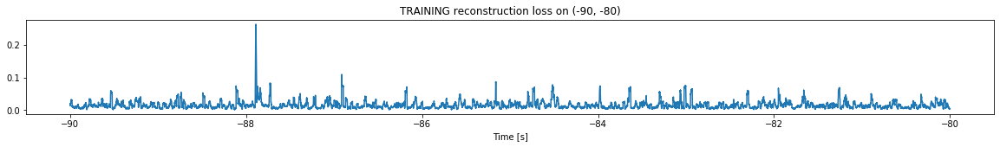

Finished training, median of the log(loss) is:  -1.8816170378985098
Triggering for section:  (-80, -70)
Using this median for triggering: -1.708215518968802
Triggering threshold is:  4.12


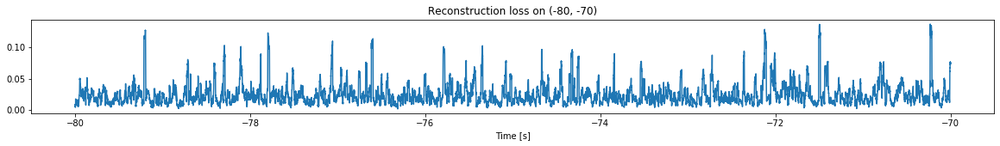

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


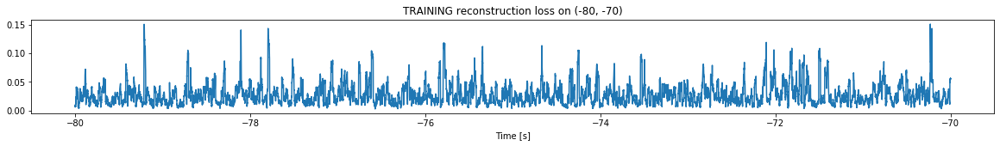

Finished training, median of the log(loss) is:  -1.6149746859217822
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8816170378985098
Triggering threshold is:  3.74


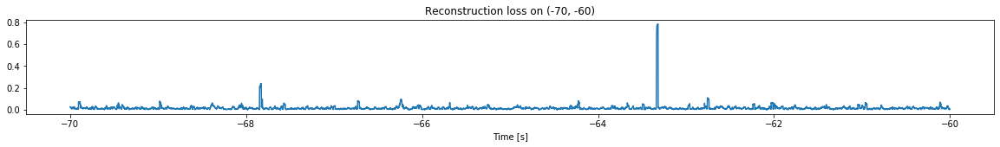

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


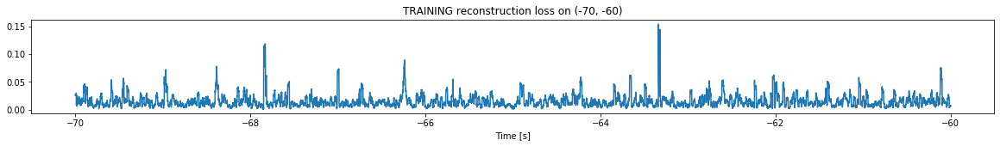

Finished training, median of the log(loss) is:  -1.8922719282597331
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6149746859217822
Triggering threshold is:  3.36


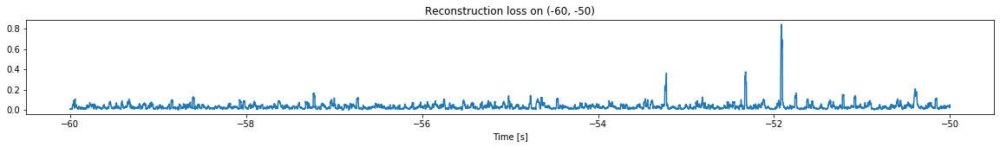

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


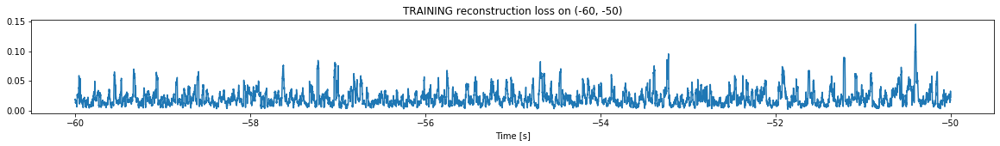

Finished training, median of the log(loss) is:  -1.751135641417794
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8922719282597331
Triggering threshold is:  2.98


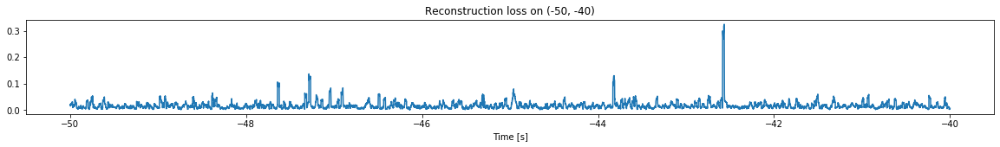

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


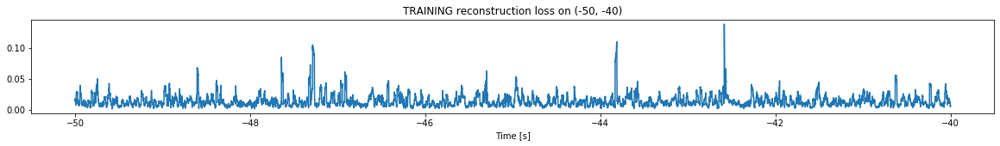

Finished training, median of the log(loss) is:  -1.9288933068857719
Triggering for section:  (-40, -30)
Using this median for triggering: -1.751135641417794
Triggering threshold is:  2.6


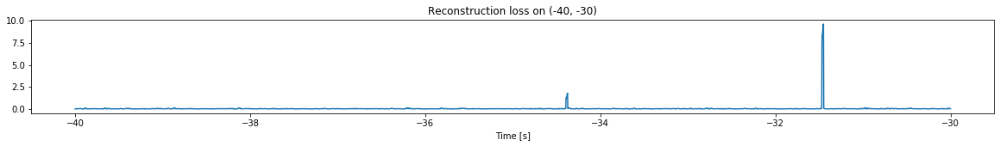

Other trigger time:  [-31.451199]
Their log loss values are:  [2.73473088]


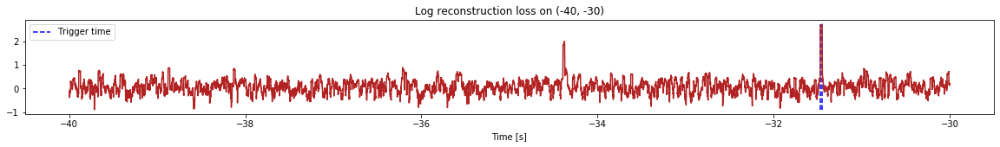

Triggered at:  [-31.451199]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


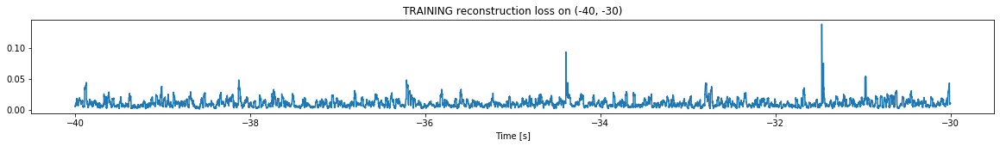

Finished training, median of the log(loss) is:  -2.051801310158031
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9288933068857719
Triggering threshold is:  2.6


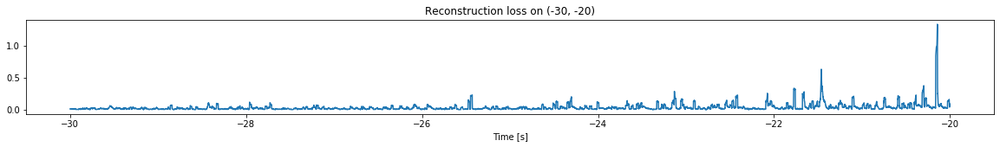

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


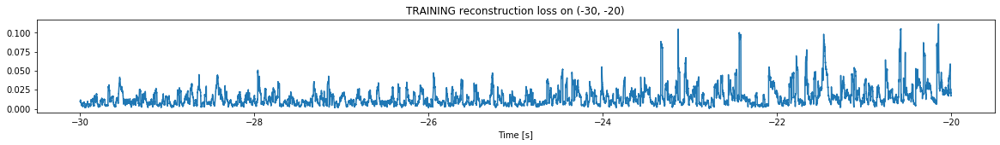

Finished training, median of the log(loss) is:  -1.9389626898198147
Triggering for section:  (-20, -10)
Using this median for triggering: -2.051801310158031
Triggering threshold is:  2.6


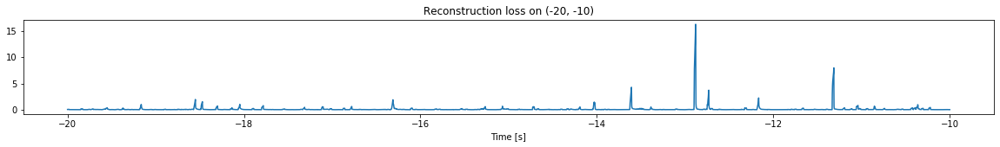

Other trigger time:  [-13.608  -12.8804 -11.3139]
Their log loss values are:  [2.6831232  3.26369764 2.95317119]


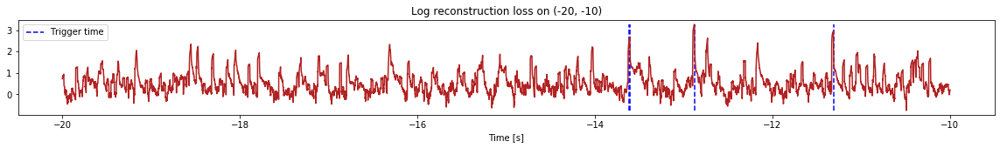

Triggered at:  [-13.608, -12.8804, -11.3139]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


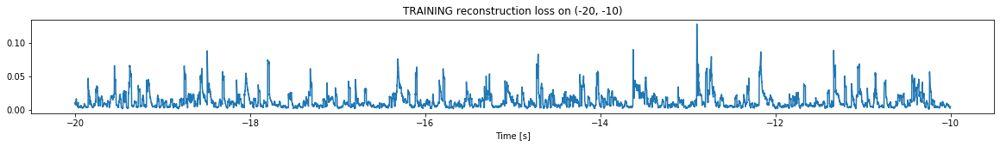

Finished training, median of the log(loss) is:  -2.056481830929375
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9389626898198147
Triggering threshold is:  2.6


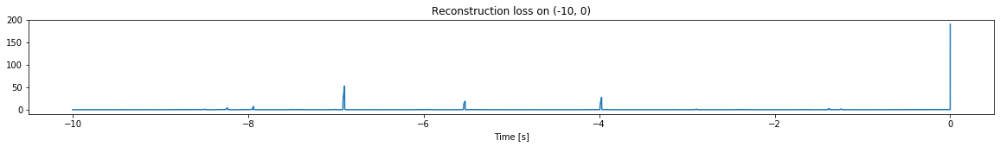

Other trigger time:  [-7.9374 -6.9013 -5.5269 -3.9722]
Their log loss values are:  [2.78882242 3.6596053  3.21528139 3.37995523]


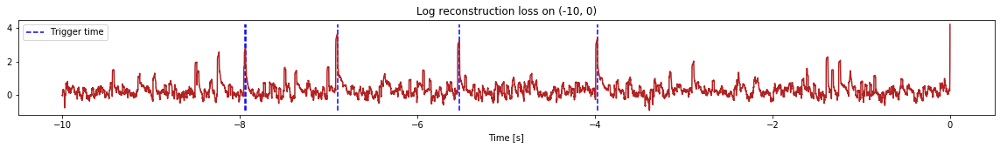

Triggered at:  [-7.9374, -6.9013, -5.5269, -3.9722]
<--------
Finished simulation, all the triggered times are:  [-31.451199, -13.608, -12.8804, -11.3139, -7.9374, -6.9013, -5.5269, -3.9722]


In [13]:
simulation("./data/Ramp26/", 10, (-110,0), -23)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (697500, 12)
Flushing input history
Number of sections: 7
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 4.5, 4.183333333333334, 3.8666666666666667, 3.55, 3.2333333333333334, 2.916666666666667, 2.6]
Entering sections:  (-70, -60)
-------->
Entering sections:  (-60, -50)
-------->
Training for section:  (None, -60)


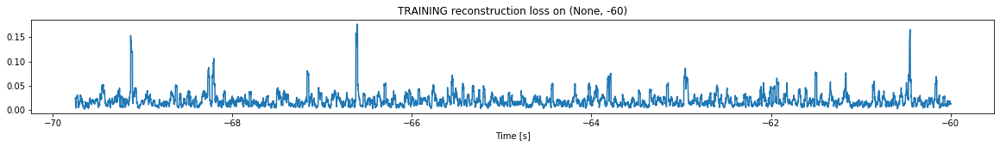

Finished training, median of the log(loss) is:  -1.7729851561859056
<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


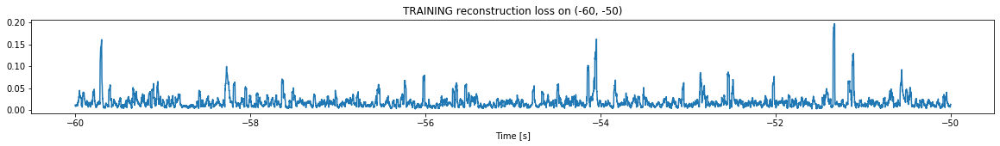

Finished training, median of the log(loss) is:  -1.8320143290249842
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7729851561859056
Triggering threshold is:  4.5


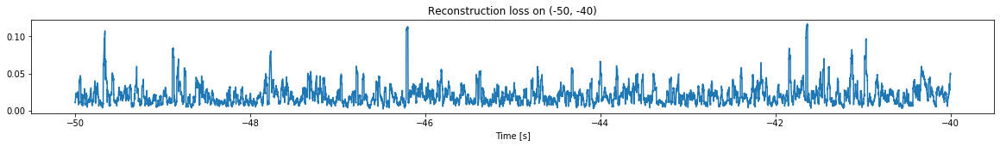

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


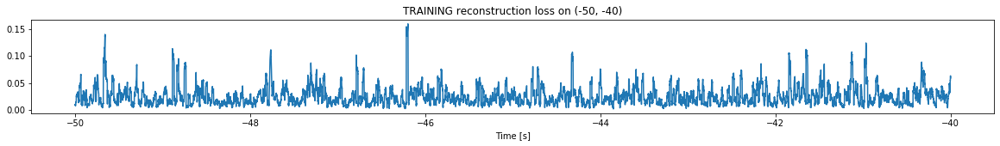

Finished training, median of the log(loss) is:  -1.6589429433297689
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8320143290249842
Triggering threshold is:  4.183333333333334


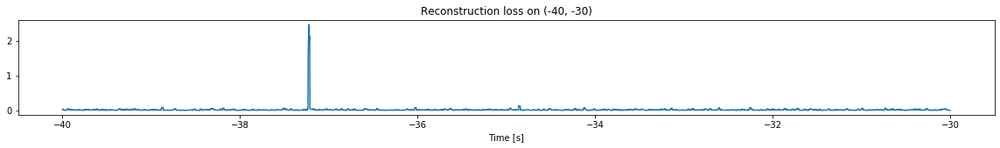

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


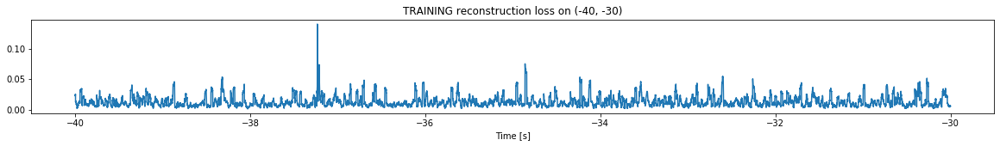

Finished training, median of the log(loss) is:  -1.9733357250467671
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6589429433297689
Triggering threshold is:  3.8666666666666667


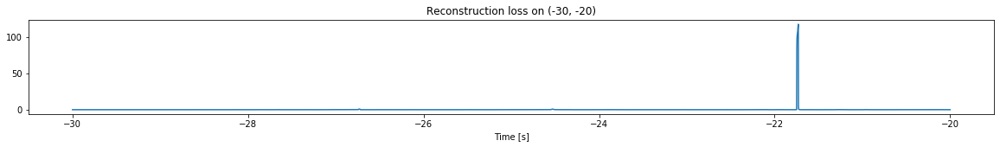

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


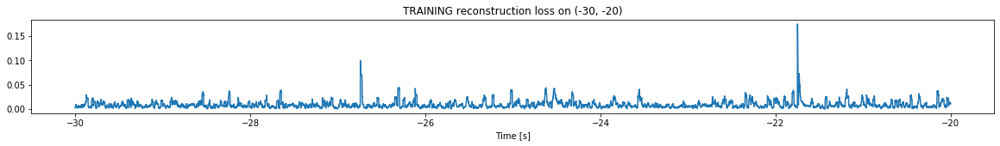

Finished training, median of the log(loss) is:  -2.0996738454194492
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9733357250467671
Triggering threshold is:  3.55


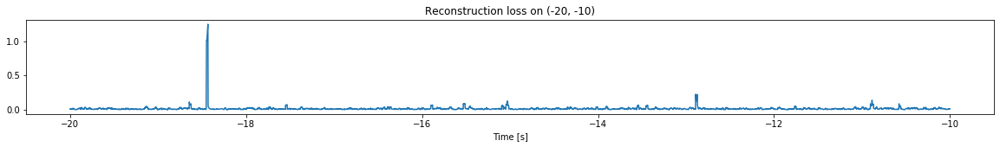

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


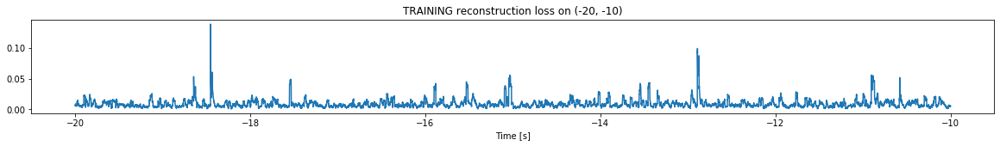

Finished training, median of the log(loss) is:  -2.119476387207805
Triggering for section:  (-10, 0)
Using this median for triggering: -2.0996738454194492
Triggering threshold is:  3.2333333333333334


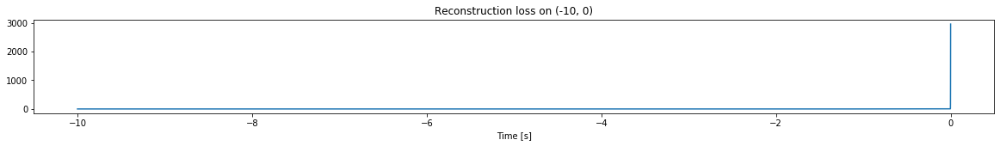

Other trigger time:  []
Their log loss values are:  []


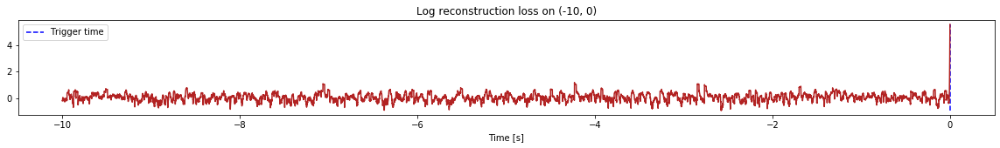

Triggered at:  []
<--------
Finished simulation, all the triggered times are:  []


In [14]:
#simulation("./data/Ramp27/", 10, (-70,0), 21.5)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (597500, 12)
Flushing input history
Number of sections: 6
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


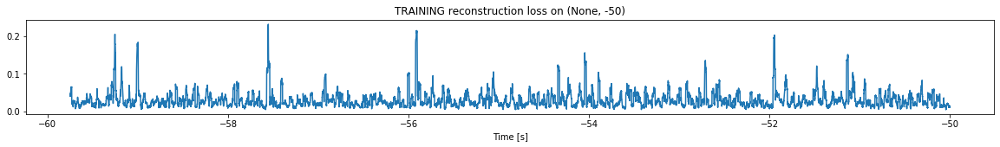

Finished training, median of the log(loss) is:  -1.602090319391285
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


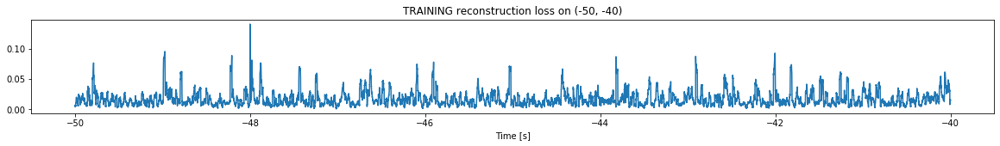

Finished training, median of the log(loss) is:  -1.8446188645284705
Triggering for section:  (-40, -30)
Using this median for triggering: -1.602090319391285
Triggering threshold is:  4.5


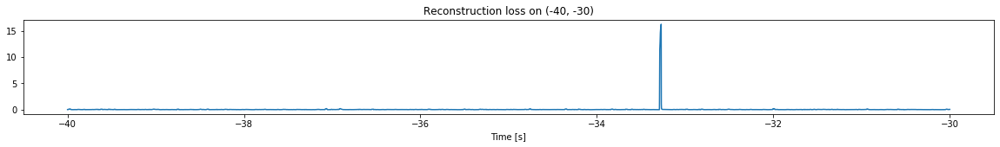

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


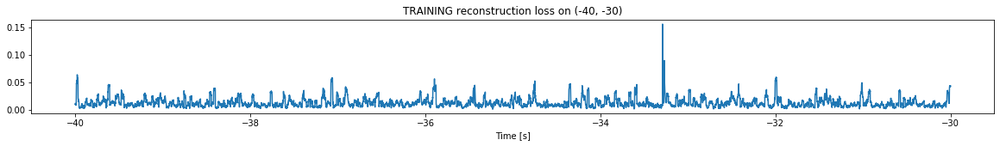

Finished training, median of the log(loss) is:  -1.9814504262102635
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8446188645284705
Triggering threshold is:  4.12


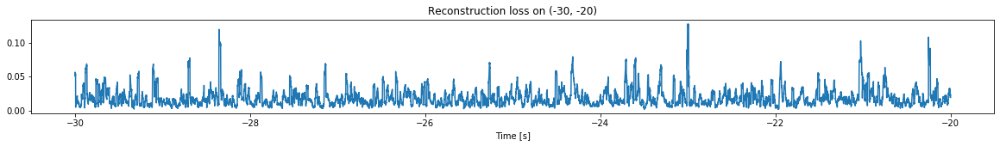

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


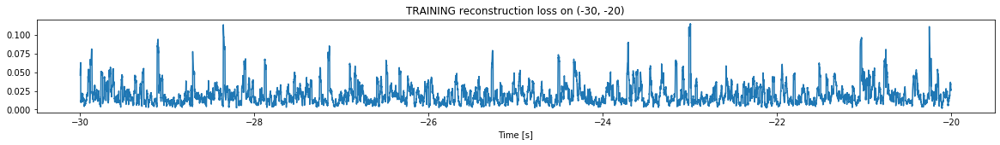

Finished training, median of the log(loss) is:  -1.7778128953932215
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9814504262102635
Triggering threshold is:  3.74


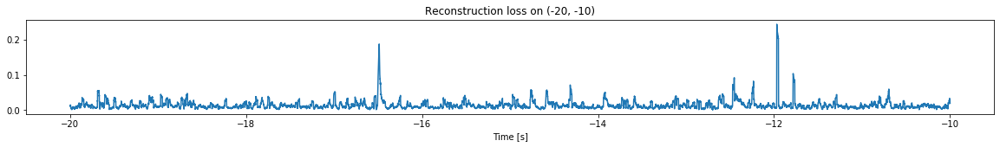

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


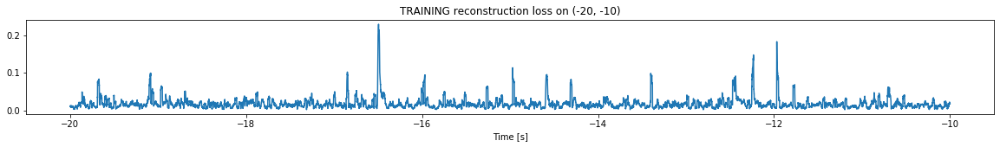

Finished training, median of the log(loss) is:  -1.8243013372640922
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7778128953932215
Triggering threshold is:  3.36


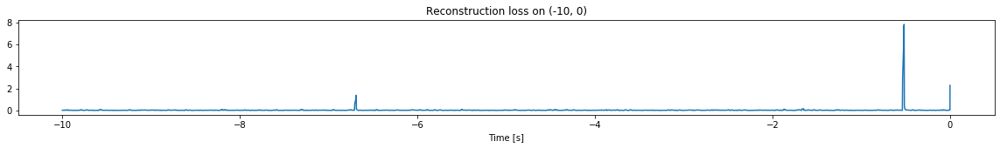

<--------
Finished simulation, all the triggered times are:  []


In [15]:
simulation("./data/Ramp28/", 10, (-60,0), 27.7)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


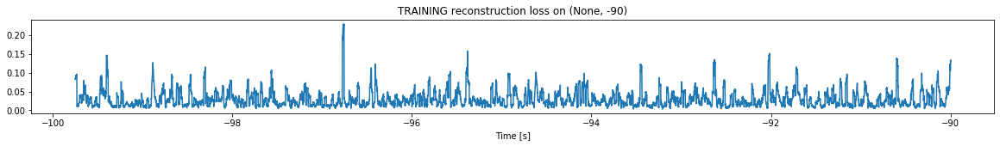

Finished training, median of the log(loss) is:  -1.6207007490915468
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


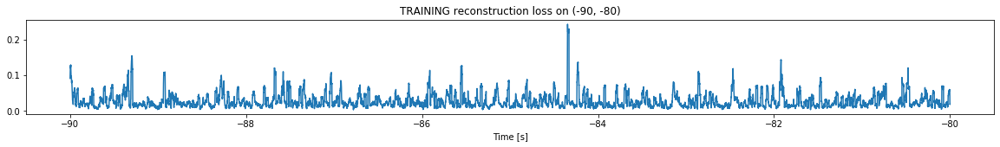

Finished training, median of the log(loss) is:  -1.6519876907823534
Triggering for section:  (-80, -70)
Using this median for triggering: -1.6207007490915468
Triggering threshold is:  4.5


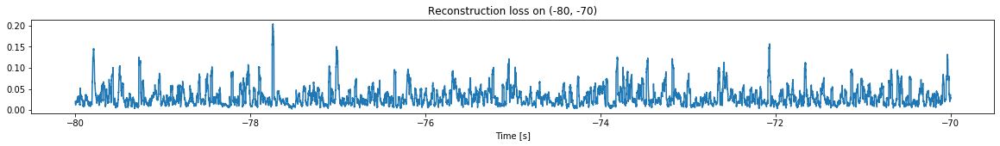

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


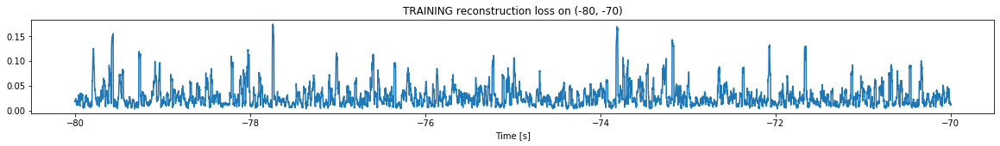

Finished training, median of the log(loss) is:  -1.6381566986368863
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6519876907823534
Triggering threshold is:  4.12


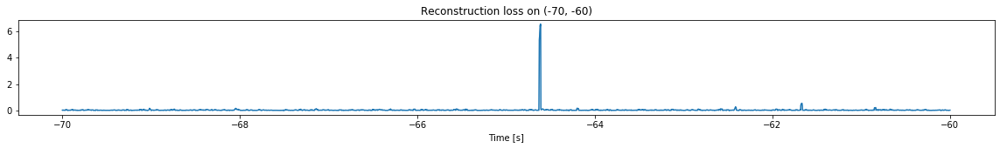

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


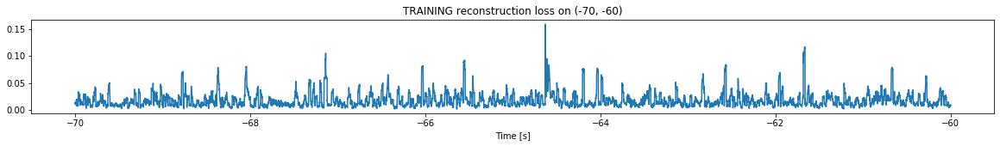

Finished training, median of the log(loss) is:  -1.8499863316969927
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6381566986368863
Triggering threshold is:  3.74


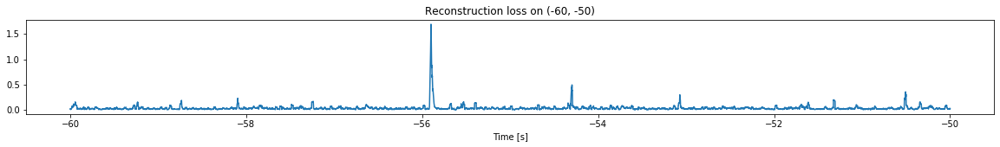

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


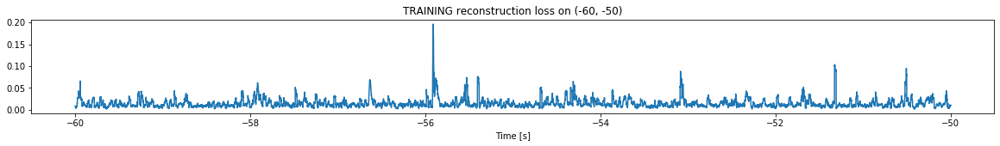

Finished training, median of the log(loss) is:  -1.9039635869829161
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8499863316969927
Triggering threshold is:  3.36


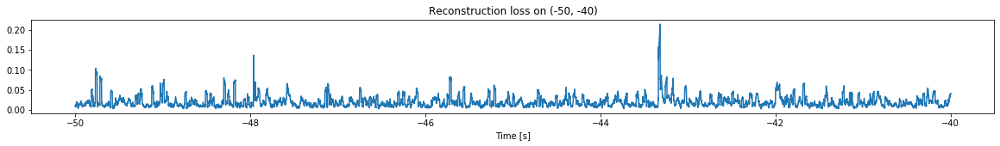

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


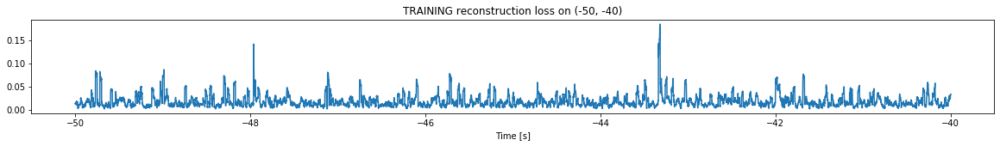

Finished training, median of the log(loss) is:  -1.823556445259531
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9039635869829161
Triggering threshold is:  2.98


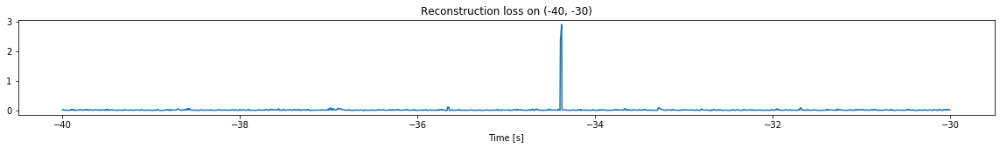

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


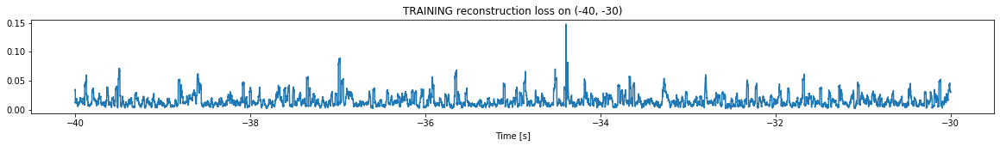

Finished training, median of the log(loss) is:  -1.8944657367165068
Triggering for section:  (-30, -20)
Using this median for triggering: -1.823556445259531
Triggering threshold is:  2.6


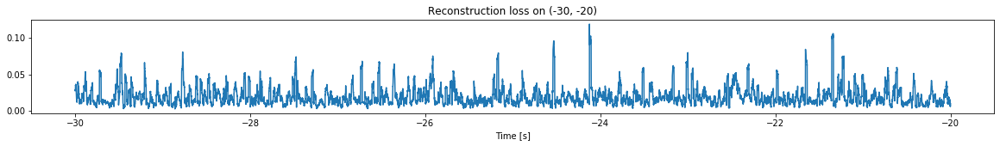

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


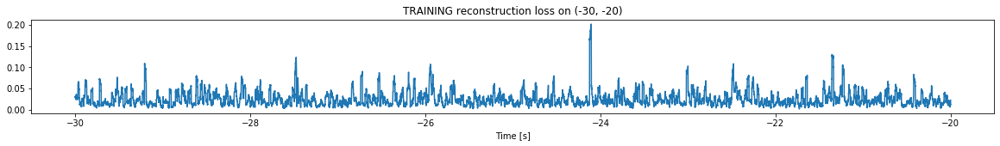

Finished training, median of the log(loss) is:  -1.6725999701320369
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8944657367165068
Triggering threshold is:  2.6


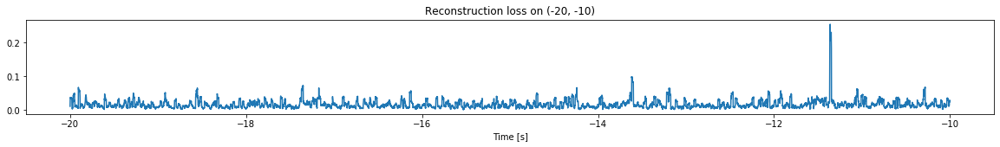

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


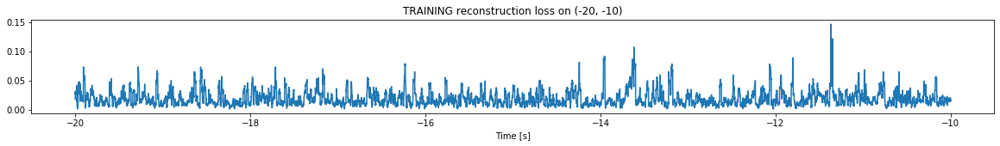

Finished training, median of the log(loss) is:  -1.7882427323613754
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6725999701320369
Triggering threshold is:  2.6


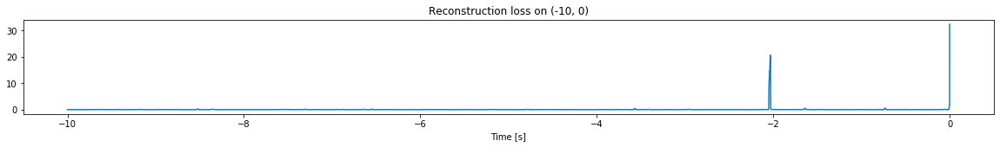

Other trigger time:  [-2.0335]
Their log loss values are:  [2.98894574]


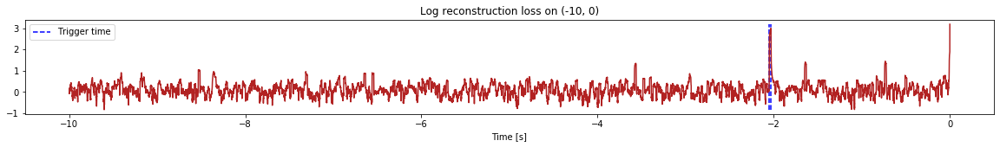

Triggered at:  [-2.0335]
<--------
Finished simulation, all the triggered times are:  [-2.0335]


In [16]:
simulation("./data/Ramp29/", 10, (-100,0), -14)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1197500, 12)
Flushing input history
Number of sections: 12
Number of triggering sections 8
List of trigger thresholds:  [0, 0, 4.5, 4.12, 3.74, 3.36, 2.98, 2.6]
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


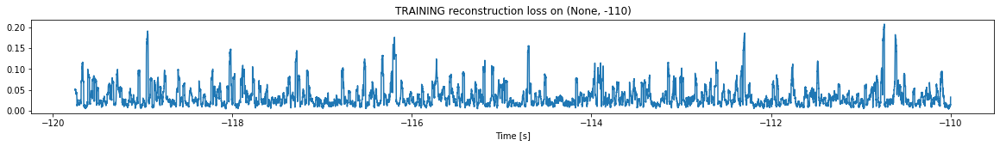

Finished training, median of the log(loss) is:  -1.580719314850661
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


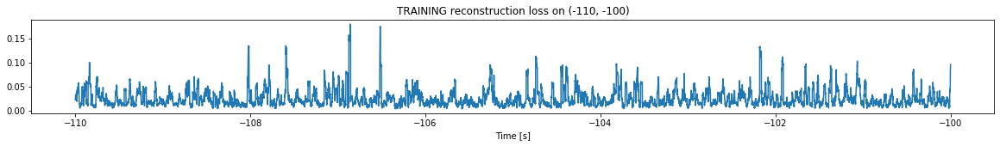

Finished training, median of the log(loss) is:  -1.6846789367168422
Triggering for section:  (-100, -90)
Using this median for triggering: -1.580719314850661
Triggering threshold is:  4.5


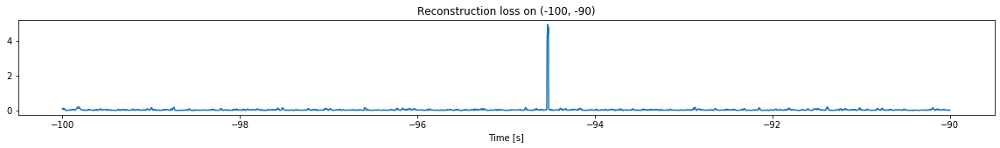

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


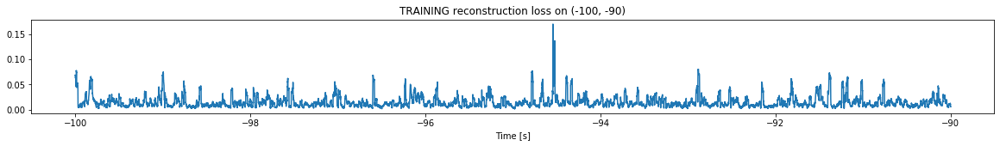

Finished training, median of the log(loss) is:  -1.9184400886447937
Triggering for section:  (-90, -80)
Using this median for triggering: -1.6846789367168422
Triggering threshold is:  4.12


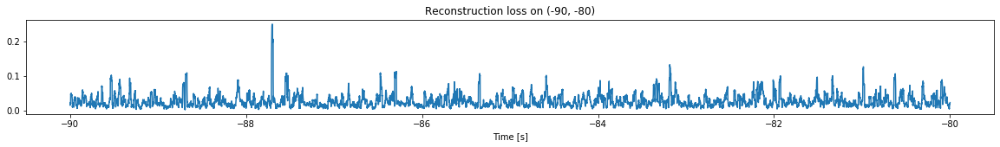

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


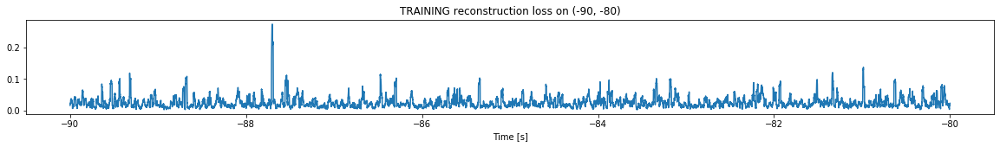

Finished training, median of the log(loss) is:  -1.6620886412853795
Triggering for section:  (-80, -70)
Using this median for triggering: -1.9184400886447937
Triggering threshold is:  3.74


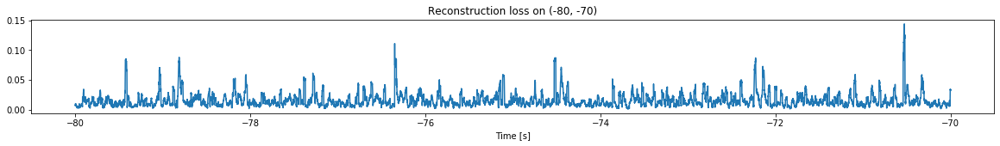

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


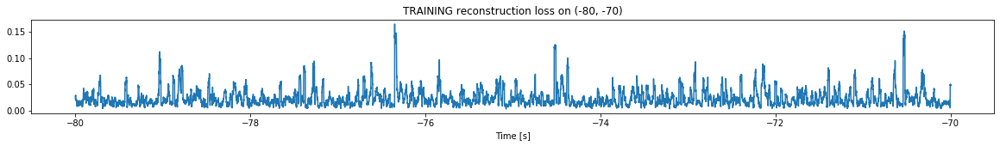

Finished training, median of the log(loss) is:  -1.7233652922007165
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6620886412853795
Triggering threshold is:  3.36


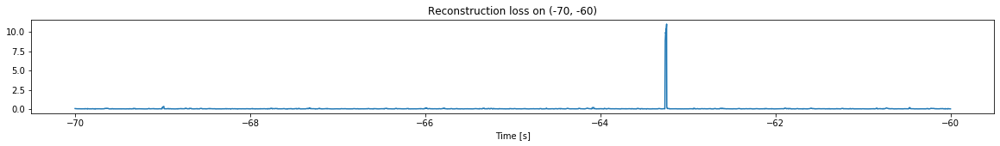

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


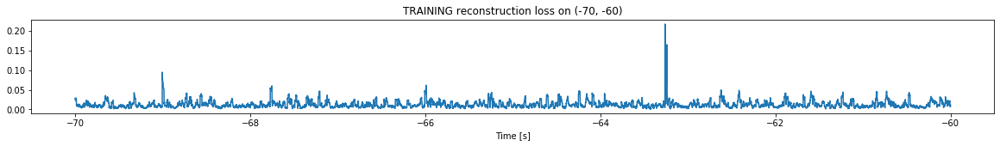

Finished training, median of the log(loss) is:  -1.9804447219366739
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7233652922007165
Triggering threshold is:  2.98


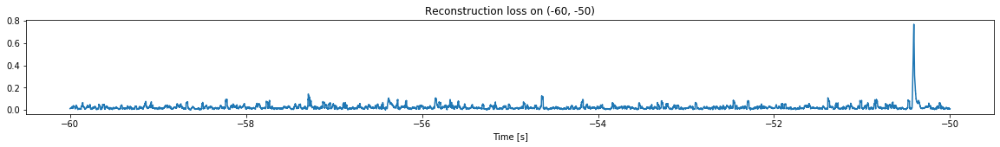

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


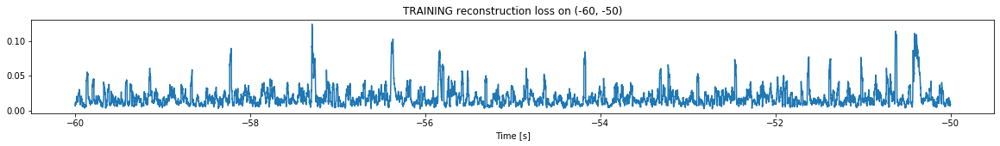

Finished training, median of the log(loss) is:  -1.8117384154693597
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9804447219366739
Triggering threshold is:  2.6


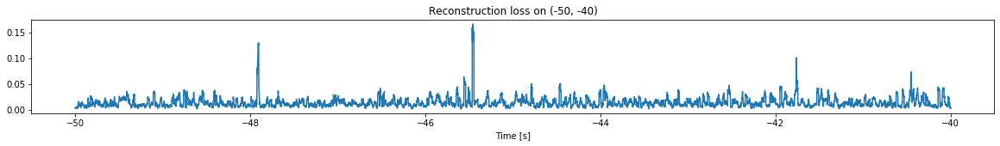

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


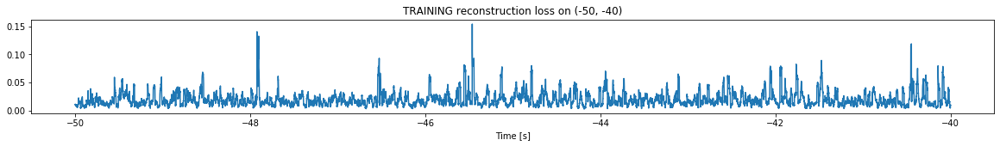

Finished training, median of the log(loss) is:  -1.7669653225720452
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8117384154693597
Triggering threshold is:  2.6


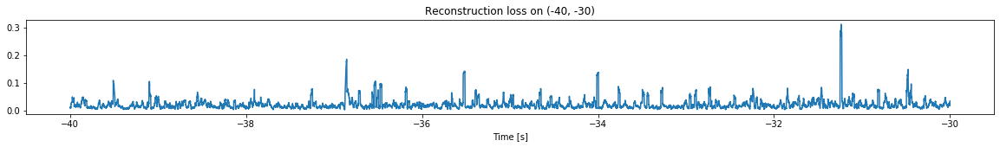

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


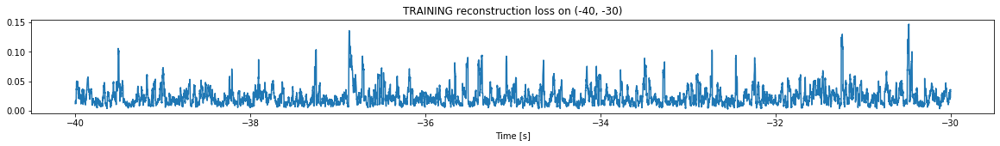

Finished training, median of the log(loss) is:  -1.6966090082350176
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7669653225720452
Triggering threshold is:  2.6


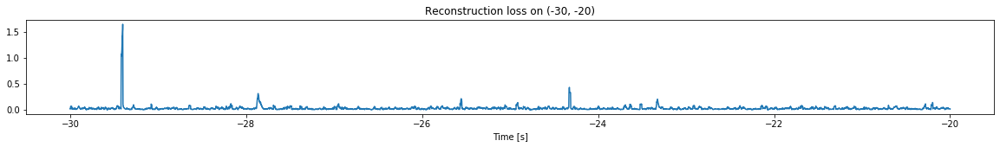

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


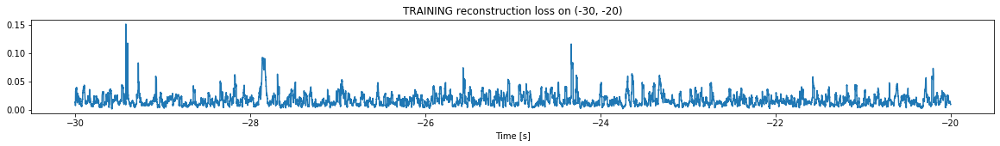

Finished training, median of the log(loss) is:  -1.8357048886917702
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6966090082350176
Triggering threshold is:  2.6


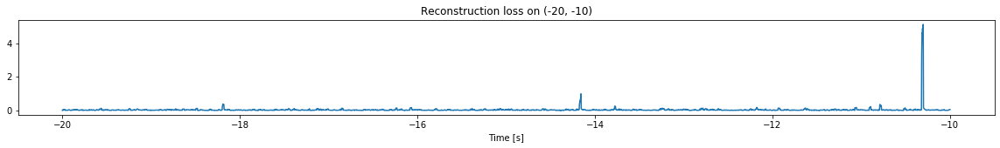

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


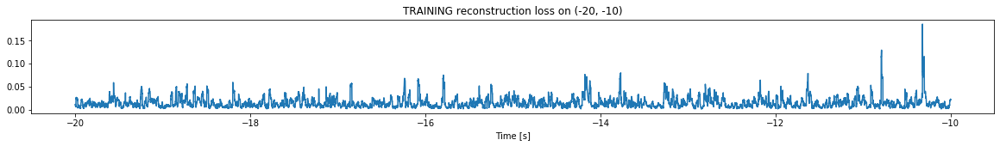

Finished training, median of the log(loss) is:  -1.8805724402500532
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8357048886917702
Triggering threshold is:  2.6


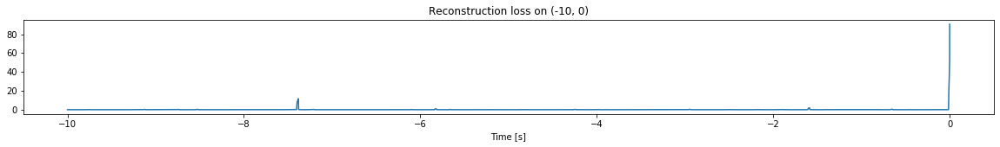

Other trigger time:  [-7.3820996]
Their log loss values are:  [2.90295049]


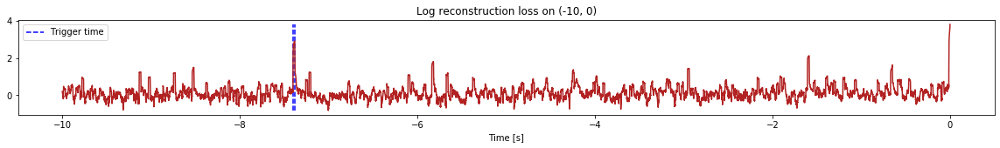

Triggered at:  [-7.3820996]
<--------
Finished simulation, all the triggered times are:  [-7.3820996]


In [17]:
simulation("./data/Ramp30/", 10, (-120,0), -33.2)

-----------

In [2]:
def load_sensor(dir_path, sensor, time_range = None):
    
    data = pd.DataFrame(data = {sensor: np.load(dir_path + sensor + ".npy"),
                                "time": np.load(dir_path + "time.npy")})
    
    start = min(data["time"])
    end = max(data["time"])
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    data = data[(data["time"] > start) & (data["time"] < end)]
   
    %reset -f in
    
    return data[sensor]

def load_time_label(dir_path, time_range, window = 2000, step = 10):
    
    time_label =  np.load(dir_path + "time.npy")
    
    start = min(time_label)
    end = max(time_label)
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    time_label = time_label[(time_label > start) & (time_label < end)][window-1::step]
    
    %reset -f in
    
    return time_label

#### Mean of abs(signal)
def generate_mean_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_sd

#### Thresholded zero crossings
def zero_crossings(array):
    
    #Set values outside of range (0.001, 0.1) = 0
    array[abs(array) > 0.1] = 0
    array[abs(array) < 0.005] = 0
    
    #Calculate number of zero-crossing points, normalized by the window size
    zero_crossings = ((array[:-1] * array[1:]) < 0).sum()/array.size
    
    return zero_crossings


def generate_crossings_data(dir_path, time_range = None, window = 5000, step = 10):
    
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_crossings = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_crossings


def generate_data(dir_path, time_range, window = 2000, thres_win = 25000, step = 10):
    
    #Selection index due to using different window
    selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(dir_path, time_range, window = window, step = step)[selection_index:]
    moving_sd = generate_sd_data(dir_path, time_range, window = window, step = step)[selection_index:]
    #moving_thres_crossings = generate_crossings_data(dir_path, time_range, window = thres_win, step = step)
    time_label = load_time_label(dir_path, time_range, window = window, step = step)[selection_index:]
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label

#####-------INCREMENTAL LEARNING IMPLEMENTATION-------######

def create_threshold_list(trigger_sections, start_thres = 4.0, end_thres = 2.6):
    
    increment = (start_thres - end_thres)/(trigger_sections-3)
    
    trigger_thres = [0,0] #No trigger in the first two sections
    
    trigger_thres.extend([start_thres - i*increment for i in range(trigger_sections - 2)])
    
    return trigger_thres

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(6, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=12))

    model.add(Dense(3,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(12,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(trigger_threshold, current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    print("Triggering threshold is: ", trigger_threshold)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is far away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > trigger_threshold)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=trigger_threshold, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        return list(time_test[peaks])
    
    else:
        return None
    

def simulation(dir_path, section_size, time_range, reached_max):
    
    #Load data and create the model
    X, time_axis = generate_data(dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Setting dynamic trigger threshold
    start_time = time_range[0]
    
    changing_range = abs(start_time - reached_max)
    
    trigger_sections = int(math.ceil(changing_range/section_size))
    
    print("Number of triggering sections", trigger_sections)
    
    trigger_thres = create_threshold_list(trigger_sections, start_thres = 5, end_thres = 2.6)
    
    print("List of trigger thresholds: ", trigger_thres)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
            
            
            #Select the trigger threshold
            
            if i >= len(trigger_thres):
                trigger_threshold = trigger_thres[-1]
            else:
                trigger_threshold = trigger_thres[i]
                
            
            trigger_time = trigger(trigger_threshold, current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
        
        print("<--------")
        
    print("Finished simulation, all the triggered times are: ", trigger_log)

In [3]:
# Start 5; End 2.6; trigger_sections + 1

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (897500, 12)
Flushing input history
Number of sections: 9
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


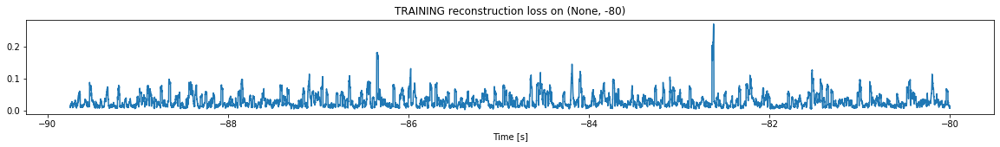

Finished training, median of the log(loss) is:  -1.6488398633920056
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


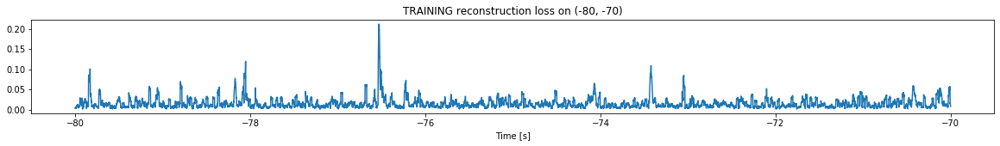

Finished training, median of the log(loss) is:  -1.9026172294674883
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6488398633920056
Triggering threshold is:  5.0


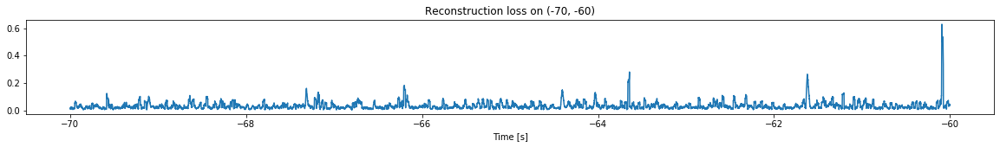

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


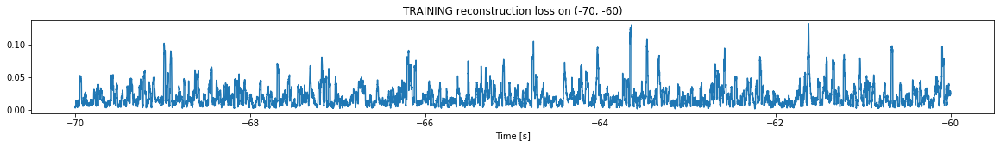

Finished training, median of the log(loss) is:  -1.7726456742837575
Triggering for section:  (-60, -50)
Using this median for triggering: -1.9026172294674883
Triggering threshold is:  4.6


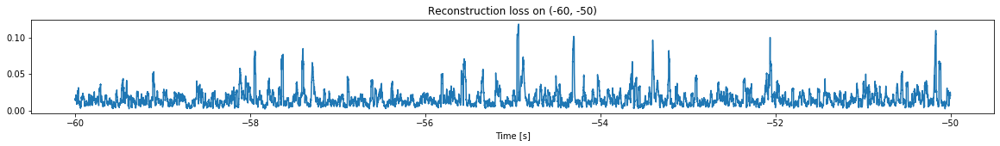

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


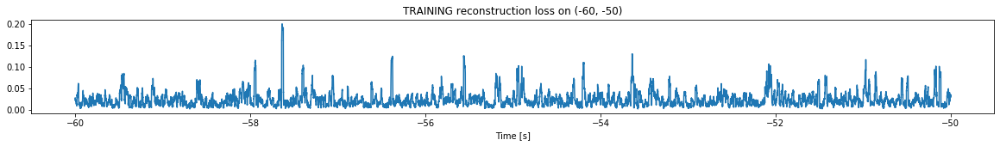

Finished training, median of the log(loss) is:  -1.7134861831372525
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7726456742837575
Triggering threshold is:  4.2


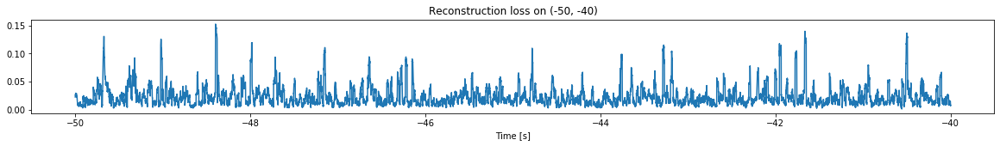

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


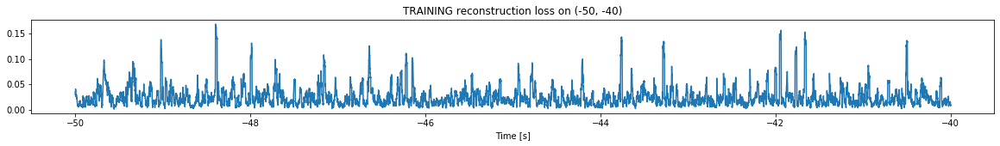

Finished training, median of the log(loss) is:  -1.6992389895050004
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7134861831372525
Triggering threshold is:  3.8


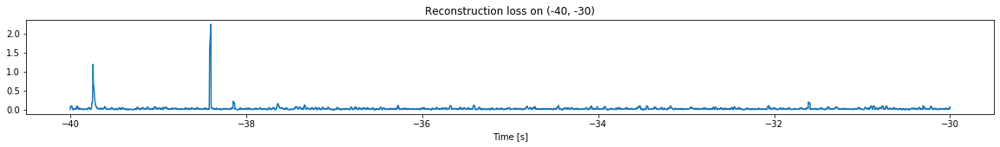

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


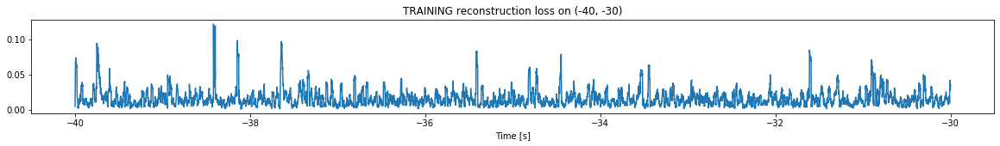

Finished training, median of the log(loss) is:  -1.8778070657582875
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6992389895050004
Triggering threshold is:  3.4000000000000004


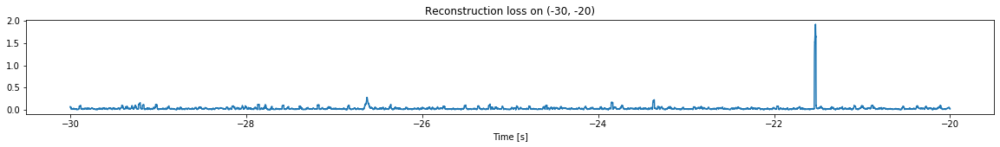

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


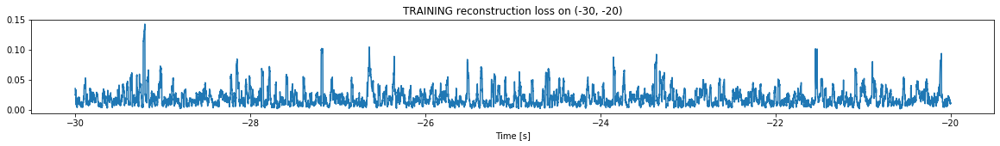

Finished training, median of the log(loss) is:  -1.7865897126086971
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8778070657582875
Triggering threshold is:  3.0


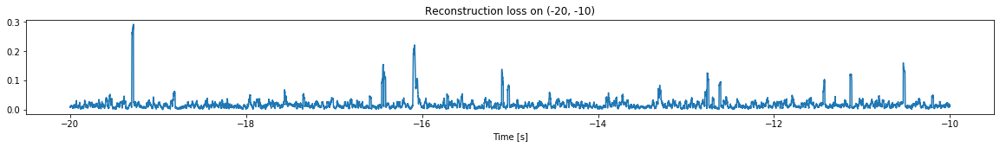

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


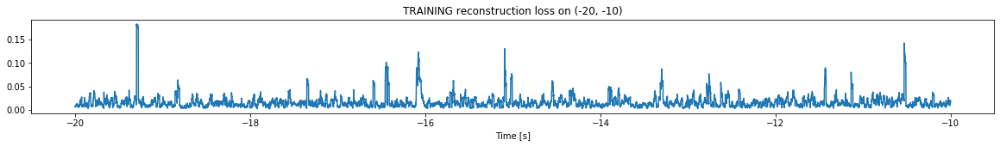

Finished training, median of the log(loss) is:  -1.880383252975247
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7865897126086971
Triggering threshold is:  2.6


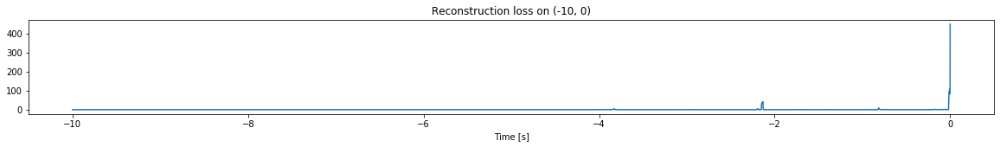

Other trigger time:  [-2.1325998 -0.8125    -0.006    ]
Their log loss values are:  [3.40775782 2.75365719 3.82469804]


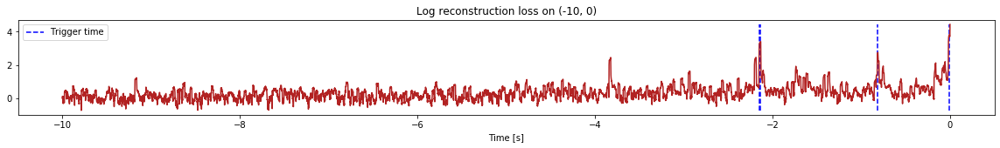

Triggered at:  [-2.1325998, -0.8125, -0.006]
<--------
Finished simulation, all the triggered times are:  [-2.1325998, -0.8125, -0.006]


In [4]:
simulation("./data/Ramp4/", 10, (-90,0), -3.9)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (897500, 12)
Flushing input history
Number of sections: 9
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


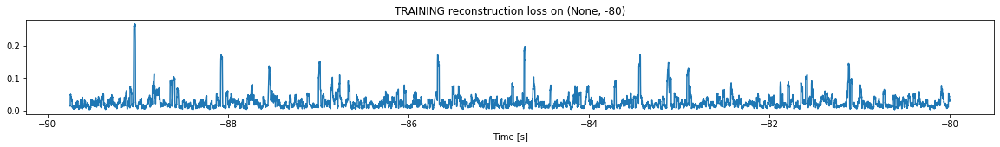

Finished training, median of the log(loss) is:  -1.6864650055419796
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


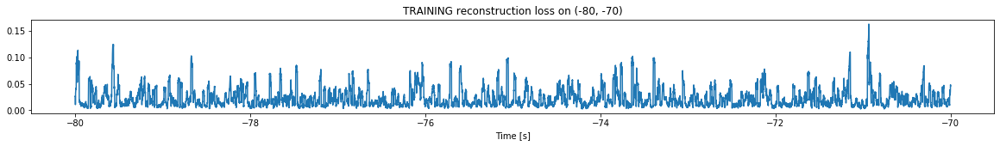

Finished training, median of the log(loss) is:  -1.7492134459107092
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6864650055419796
Triggering threshold is:  5.0


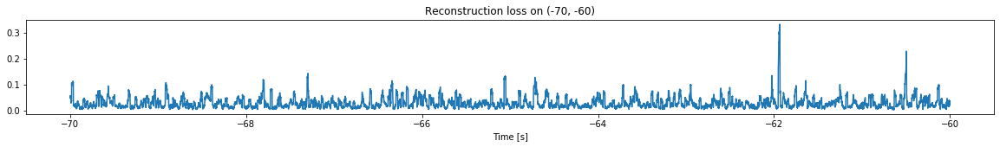

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


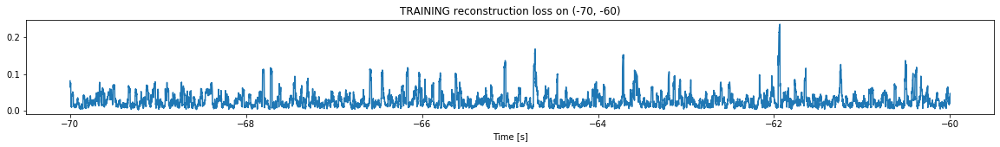

Finished training, median of the log(loss) is:  -1.6474736194382362
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7492134459107092
Triggering threshold is:  4.6


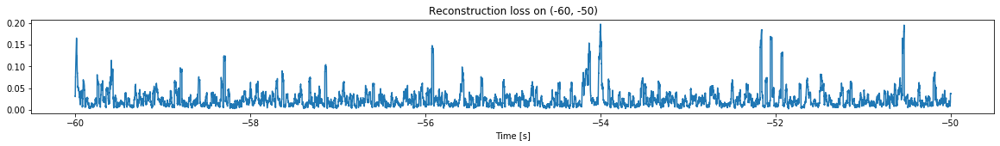

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


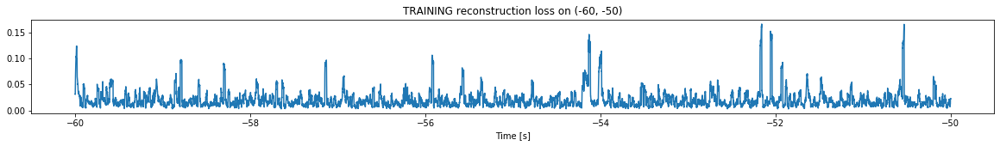

Finished training, median of the log(loss) is:  -1.7953685342679198
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6474736194382362
Triggering threshold is:  4.2


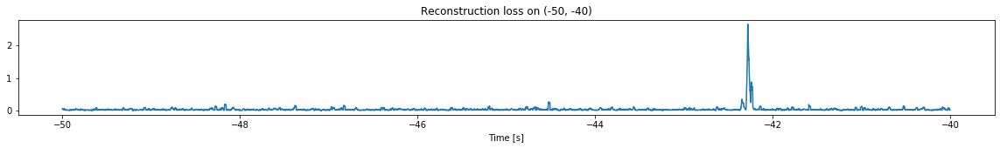

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


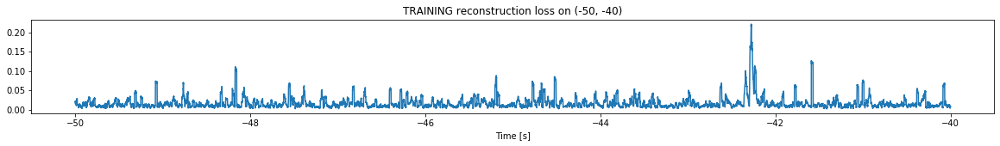

Finished training, median of the log(loss) is:  -1.8965713330960803
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7953685342679198
Triggering threshold is:  3.8


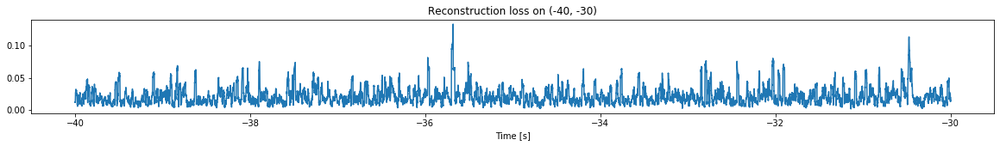

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


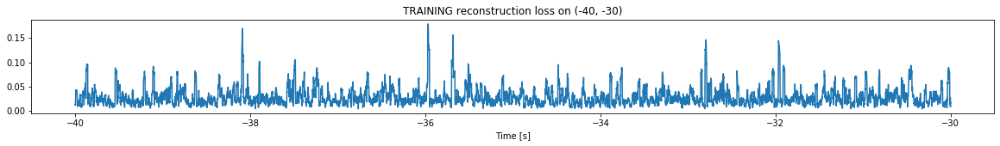

Finished training, median of the log(loss) is:  -1.6254677738377175
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8965713330960803
Triggering threshold is:  3.4000000000000004


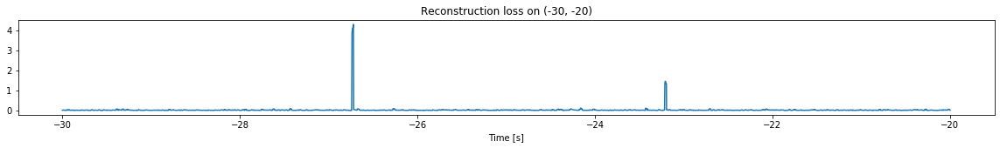

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


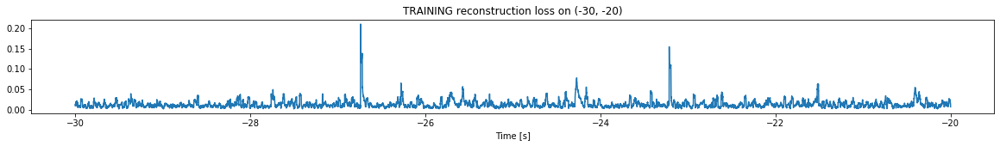

Finished training, median of the log(loss) is:  -1.9569382070558243
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6254677738377175
Triggering threshold is:  3.0


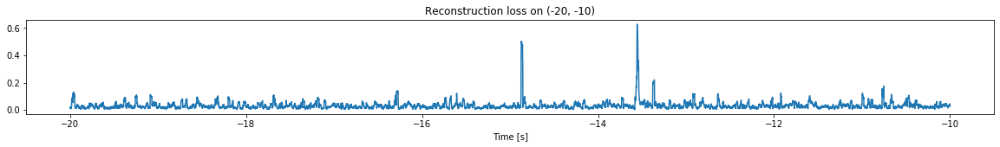

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


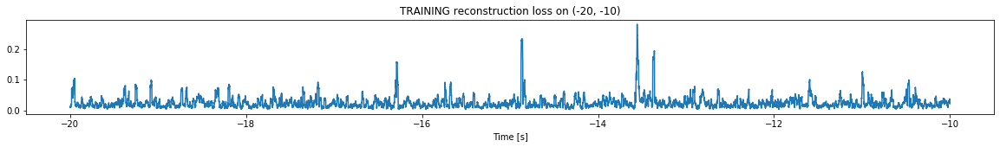

Finished training, median of the log(loss) is:  -1.6954405092877942
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9569382070558243
Triggering threshold is:  2.6


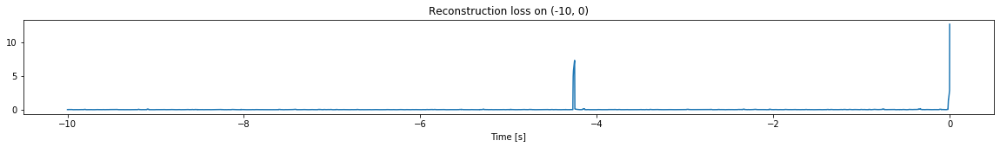

Other trigger time:  [-4.2511]
Their log loss values are:  [2.82319814]


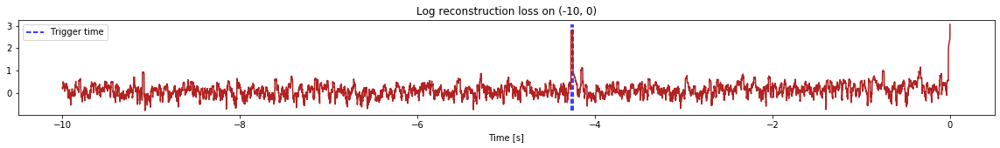

Triggered at:  [-4.2511]
<--------
Finished simulation, all the triggered times are:  [-4.2511]


In [5]:
simulation("./data/Ramp5/", 10, (-90,0), 0)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 10
List of trigger thresholds:  [0, 0, 5.0, 4.6571428571428575, 4.314285714285714, 3.9714285714285715, 3.6285714285714286, 3.2857142857142856, 2.942857142857143, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


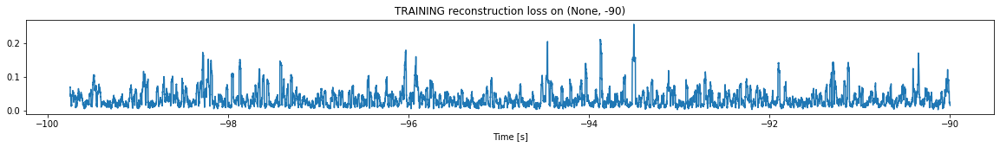

Finished training, median of the log(loss) is:  -1.538787841873691
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


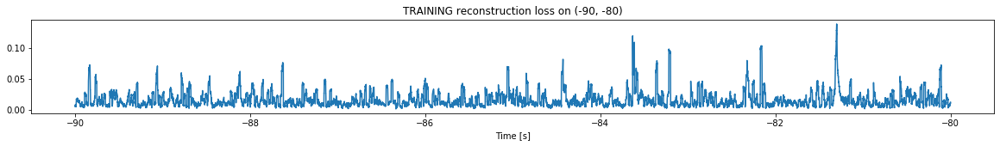

Finished training, median of the log(loss) is:  -1.8759614110295306
Triggering for section:  (-80, -70)
Using this median for triggering: -1.538787841873691
Triggering threshold is:  5.0


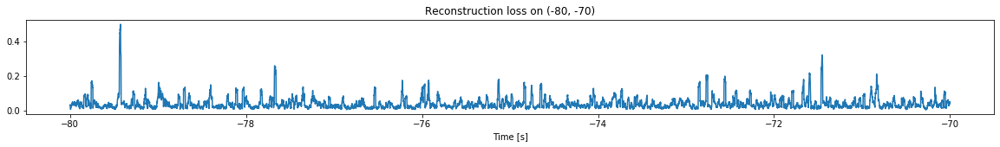

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


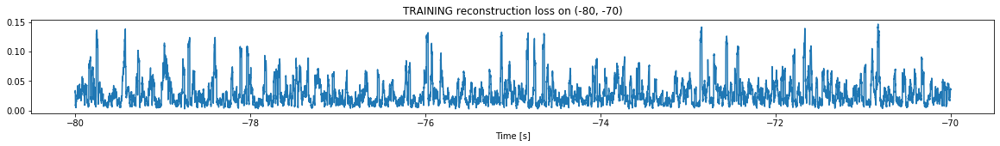

Finished training, median of the log(loss) is:  -1.6313814387370402
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8759614110295306
Triggering threshold is:  4.6571428571428575


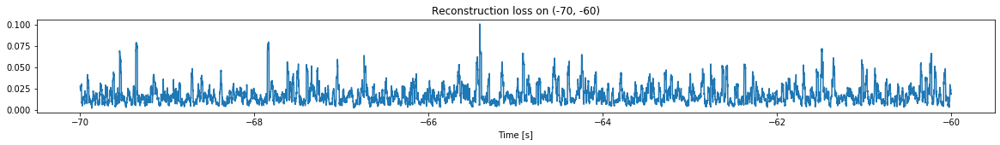

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


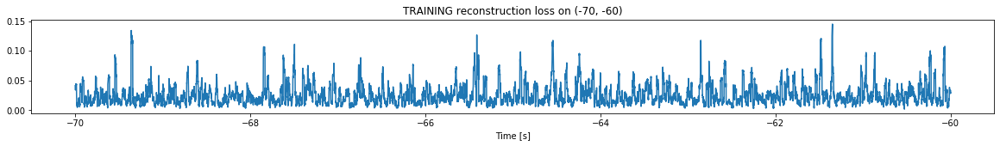

Finished training, median of the log(loss) is:  -1.6733210378154868
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6313814387370402
Triggering threshold is:  4.314285714285714


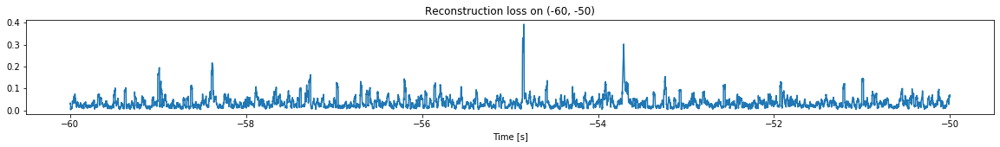

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


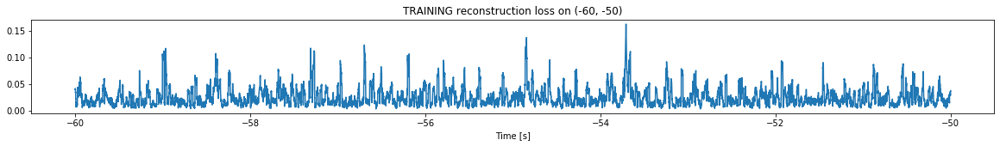

Finished training, median of the log(loss) is:  -1.68696759040425
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6733210378154868
Triggering threshold is:  3.9714285714285715


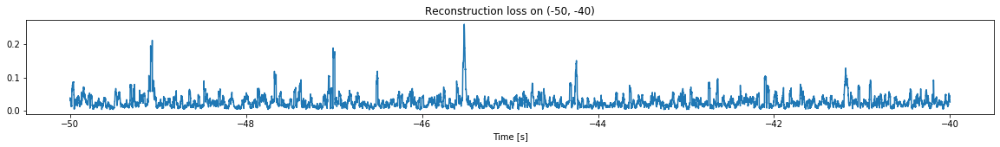

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


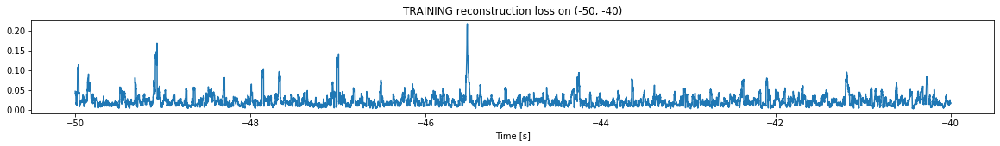

Finished training, median of the log(loss) is:  -1.7041971664094016
Triggering for section:  (-40, -30)
Using this median for triggering: -1.68696759040425
Triggering threshold is:  3.6285714285714286


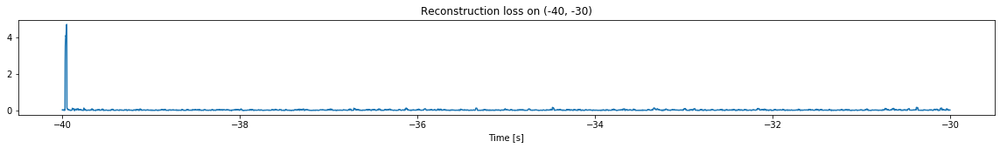

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


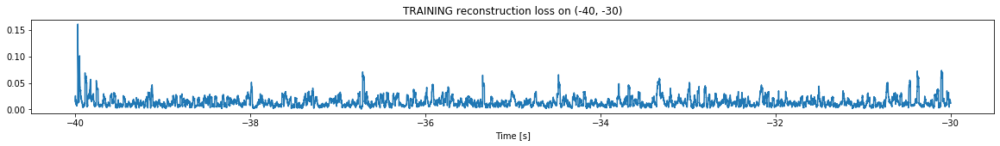

Finished training, median of the log(loss) is:  -1.9365693697942499
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7041971664094016
Triggering threshold is:  3.2857142857142856


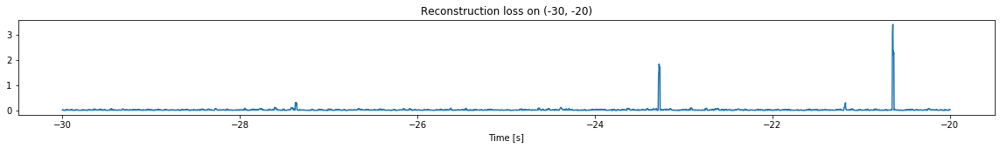

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


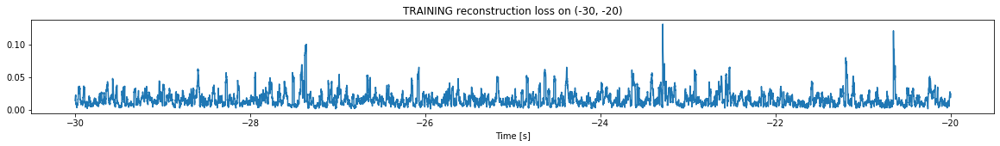

Finished training, median of the log(loss) is:  -1.8550117380128468
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9365693697942499
Triggering threshold is:  2.942857142857143


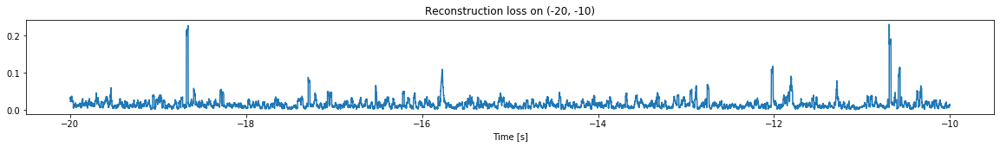

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


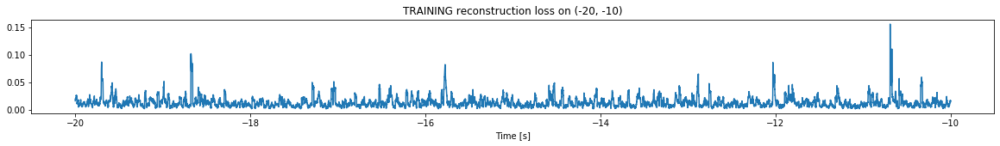

Finished training, median of the log(loss) is:  -1.9554777544201336
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8550117380128468
Triggering threshold is:  2.6


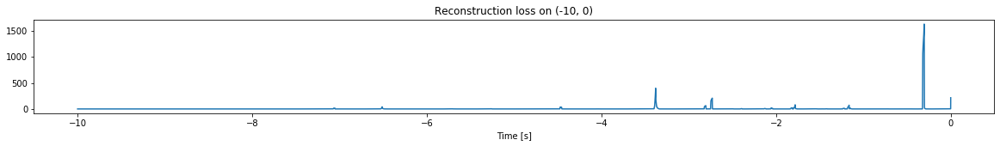

Other trigger time:  [-7.0541997 -6.5119996 -4.4707    -3.3790998 -2.731     -1.7816
 -1.1640999 -0.3037   ]
Their log loss values are:  [3.09464279 3.45359064 3.44135117 4.45563231 4.17327024 3.76282785
 3.71393878 5.06817168]


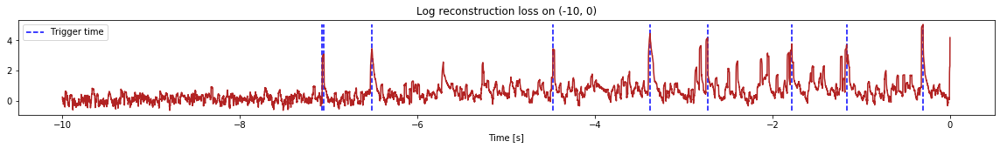

Triggered at:  [-7.0541997, -6.5119996, -4.4707, -3.3790998, -2.731, -1.7816, -1.1640999, -0.3037]
<--------
Finished simulation, all the triggered times are:  [-7.0541997, -6.5119996, -4.4707, -3.3790998, -2.731, -1.7816, -1.1640999, -0.3037]


In [6]:
simulation("./data/Ramp12d/", 10, (-100,0), -7)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2117500, 12)
Flushing input history
Number of sections: 21
Number of triggering sections 7
List of trigger thresholds:  [0, 0, 5.0, 4.4, 3.8, 3.2, 2.6]
Entering sections:  (-210, -200)
-------->
Entering sections:  (-200, -190)
-------->
Training for section:  (None, -200)


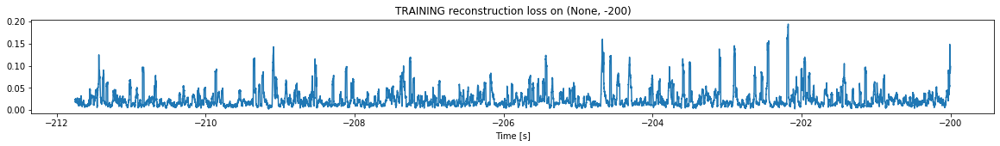

Finished training, median of the log(loss) is:  -1.731656463434839
<--------
Entering sections:  (-190, -180)
-------->
Training for section:  (-200, -190)


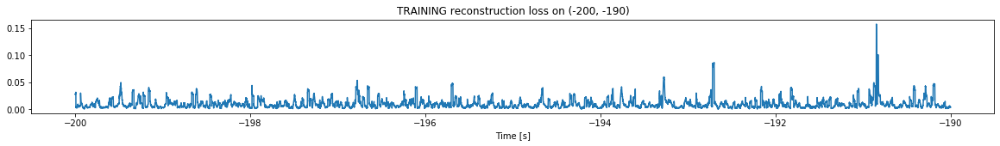

Finished training, median of the log(loss) is:  -2.107184789048296
Triggering for section:  (-190, -180)
Using this median for triggering: -1.731656463434839
Triggering threshold is:  5.0


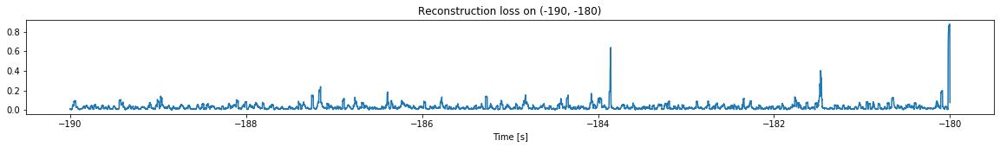

<--------
Entering sections:  (-180, -170)
-------->
Training for section:  (-190, -180)


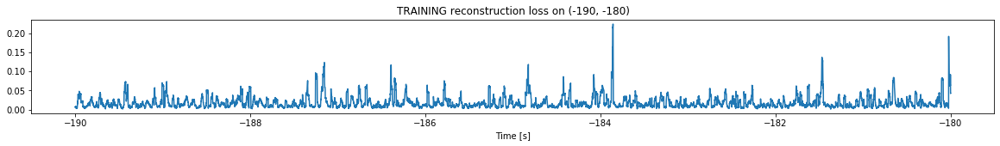

Finished training, median of the log(loss) is:  -1.8609357191103368
Triggering for section:  (-180, -170)
Using this median for triggering: -2.107184789048296
Triggering threshold is:  4.4


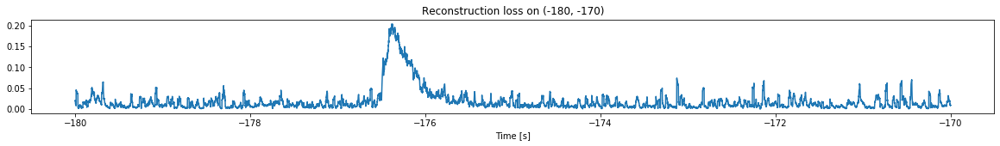

<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


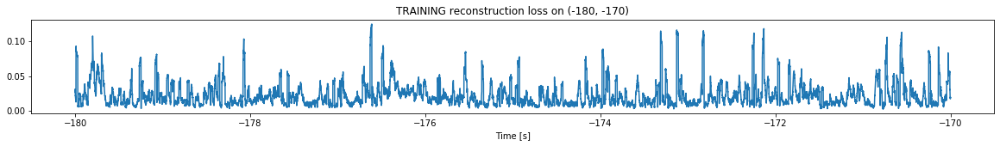

Finished training, median of the log(loss) is:  -1.745738971219779
Triggering for section:  (-170, -160)
Using this median for triggering: -1.8609357191103368
Triggering threshold is:  3.8


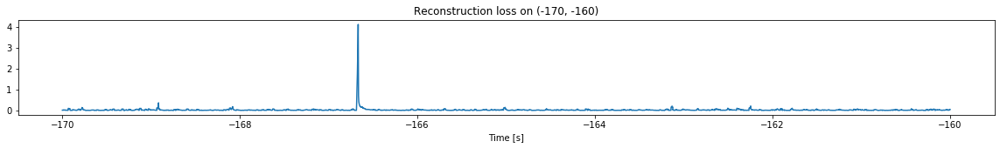

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


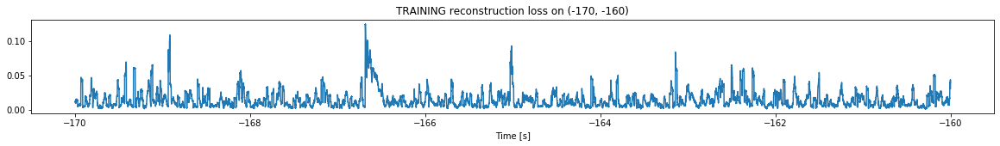

Finished training, median of the log(loss) is:  -1.951693730799336
Triggering for section:  (-160, -150)
Using this median for triggering: -1.745738971219779
Triggering threshold is:  3.2


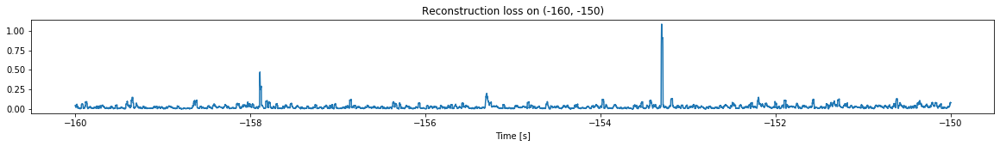

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


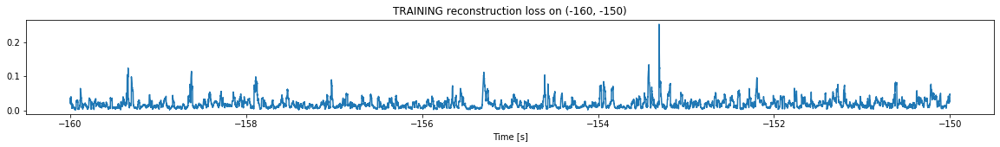

Finished training, median of the log(loss) is:  -1.8081175202993323
Triggering for section:  (-150, -140)
Using this median for triggering: -1.951693730799336
Triggering threshold is:  2.6


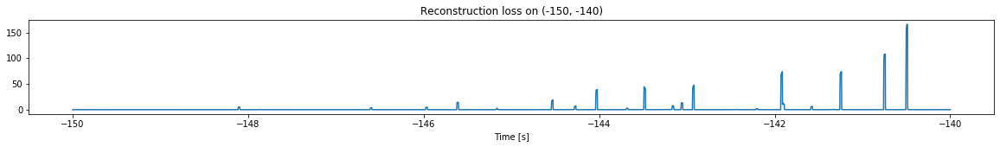

Other trigger time:  [-148.10269 -145.61339 -144.52678 -144.02359 -143.48839 -142.9188
 -141.91309 -141.23909 -140.49098]
Their log loss values are:  [2.67848794 3.11288488 3.23632928 3.54346375 3.60174123 3.63119966
 3.81997534 3.81799608 4.1720306 ]


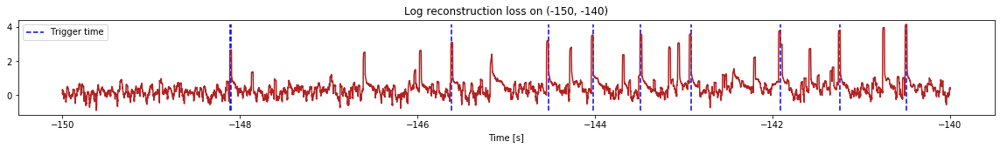

Triggered at:  [-148.10269, -145.61339, -144.52678, -144.02359, -143.48839, -142.9188, -141.91309, -141.23909, -140.49098]
<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


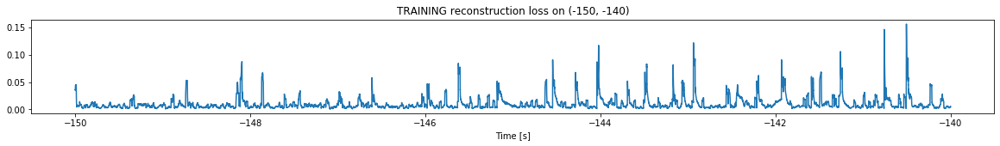

Finished training, median of the log(loss) is:  -2.1618309704325895
Triggering for section:  (-140, -130)
Using this median for triggering: -1.8081175202993323
Triggering threshold is:  2.6


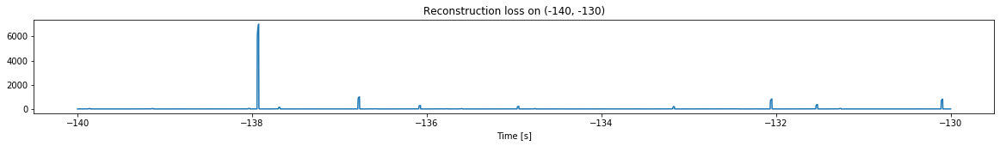

Other trigger time:  [-139.85579 -139.14519 -137.92479 -136.77028 -136.0718  -134.94579
 -133.17009 -132.0474  -131.52489 -130.09099]
Their log loss values are:  [3.33101553 3.31082606 5.65437693 4.80937194 4.26783138 4.15709733
 4.11835002 4.72622953 4.36978696 4.72006792]


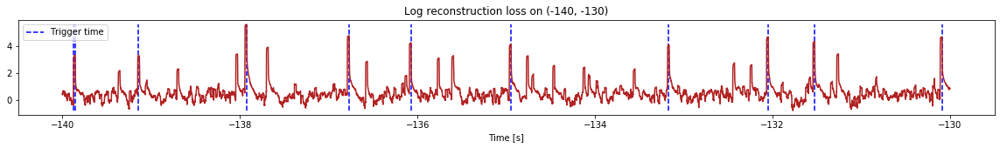

Triggered at:  [-139.85579, -139.14519, -137.92479, -136.77028, -136.0718, -134.94579, -133.17009, -132.0474, -131.52489, -130.09099]
<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


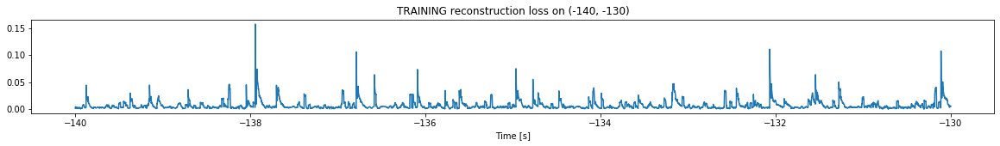

Finished training, median of the log(loss) is:  -2.3495058459058322
Triggering for section:  (-130, -120)
Using this median for triggering: -2.1618309704325895
Triggering threshold is:  2.6


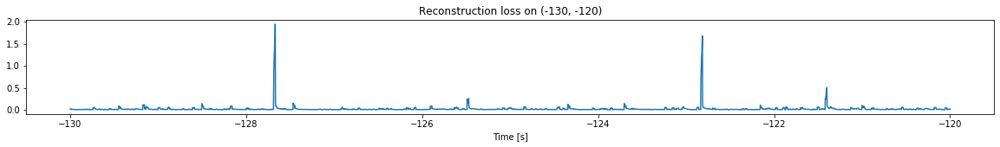

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


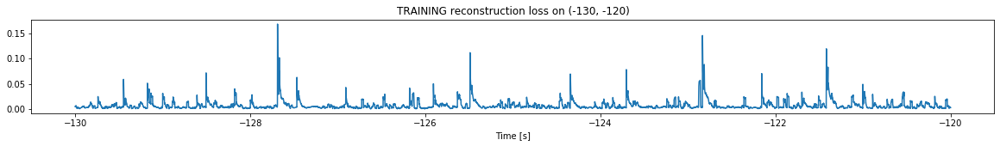

Finished training, median of the log(loss) is:  -2.301839708359118
Triggering for section:  (-120, -110)
Using this median for triggering: -2.3495058459058322
Triggering threshold is:  2.6


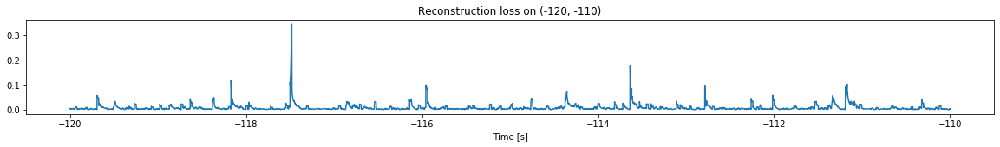

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


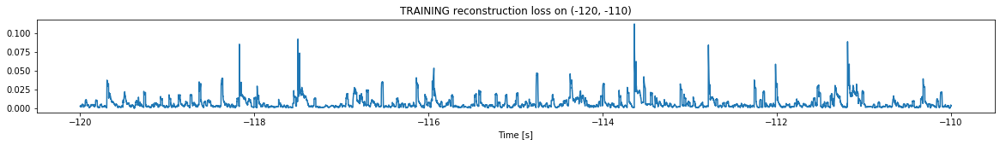

Finished training, median of the log(loss) is:  -2.3626739409951774
Triggering for section:  (-110, -100)
Using this median for triggering: -2.301839708359118
Triggering threshold is:  2.6


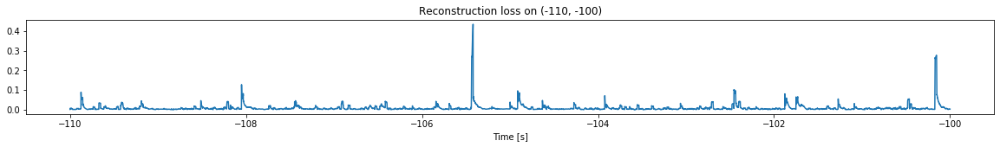

<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


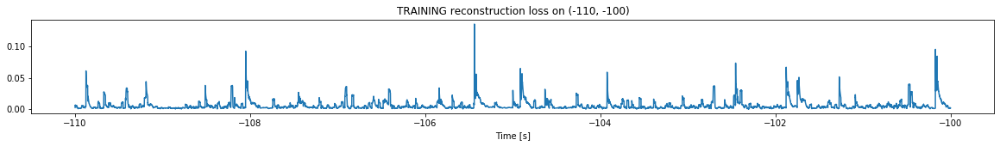

Finished training, median of the log(loss) is:  -2.4096737810512985
Triggering for section:  (-100, -90)
Using this median for triggering: -2.3626739409951774
Triggering threshold is:  2.6


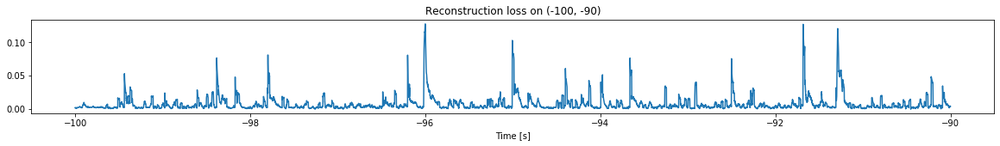

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


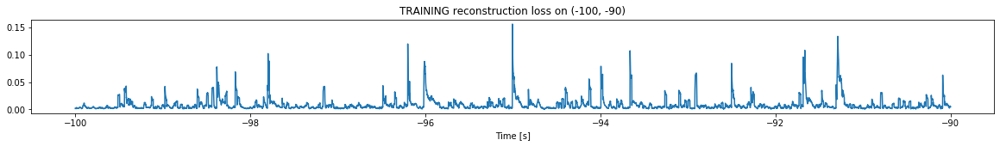

Finished training, median of the log(loss) is:  -2.2834638440559587
Triggering for section:  (-90, -80)
Using this median for triggering: -2.4096737810512985
Triggering threshold is:  2.6


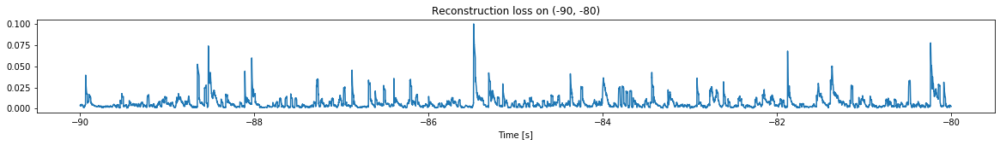

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


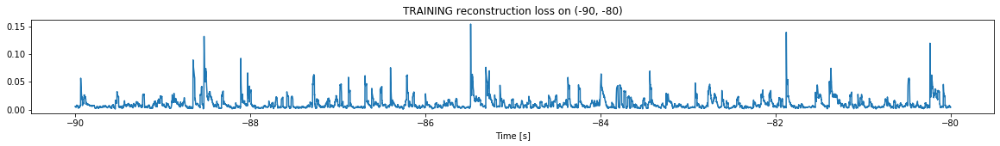

Finished training, median of the log(loss) is:  -2.1535369604591894
Triggering for section:  (-80, -70)
Using this median for triggering: -2.2834638440559587
Triggering threshold is:  2.6


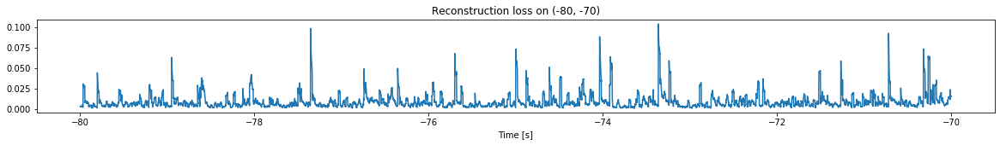

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


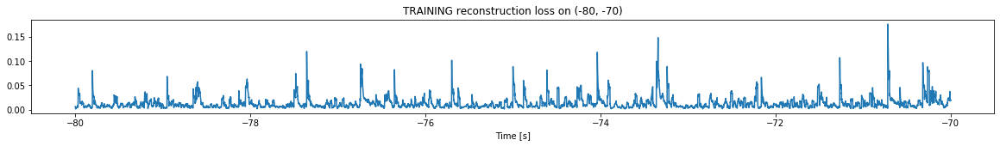

Finished training, median of the log(loss) is:  -2.0172151076405944
Triggering for section:  (-70, -60)
Using this median for triggering: -2.1535369604591894
Triggering threshold is:  2.6


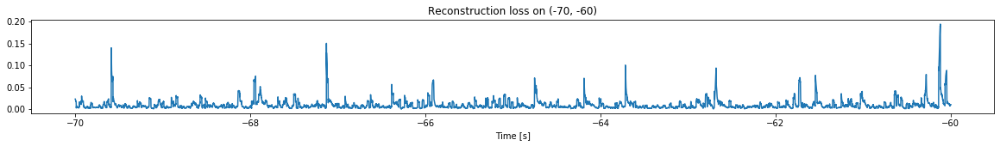

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


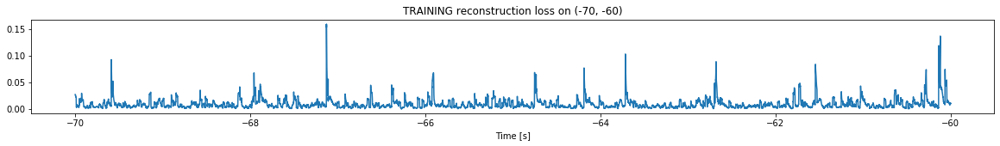

Finished training, median of the log(loss) is:  -2.1282806424669967
Triggering for section:  (-60, -50)
Using this median for triggering: -2.0172151076405944
Triggering threshold is:  2.6


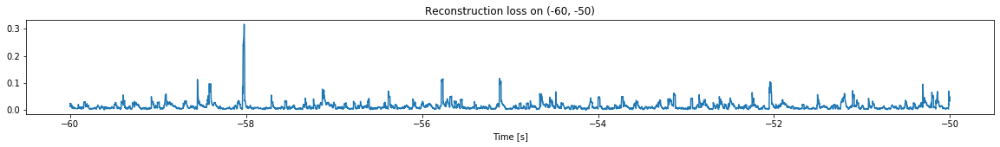

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


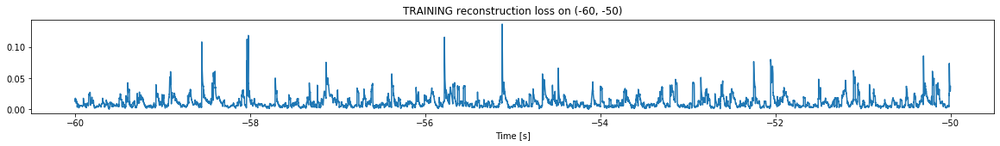

Finished training, median of the log(loss) is:  -2.055609936063257
Triggering for section:  (-50, -40)
Using this median for triggering: -2.1282806424669967
Triggering threshold is:  2.6


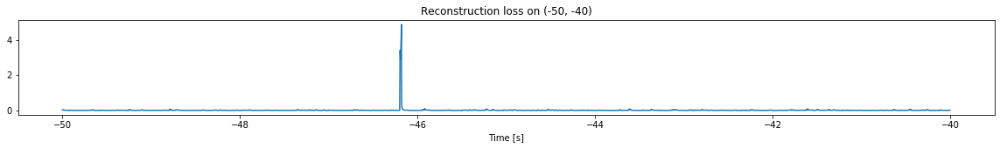

Other trigger time:  [-46.17999]
Their log loss values are:  [2.81602781]


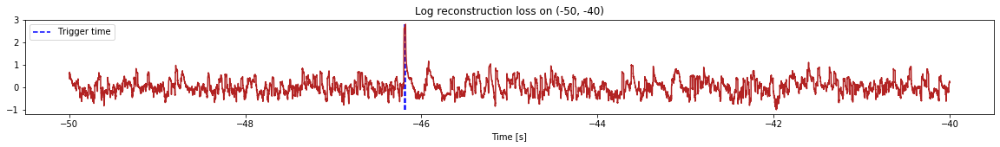

Triggered at:  [-46.17999]
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


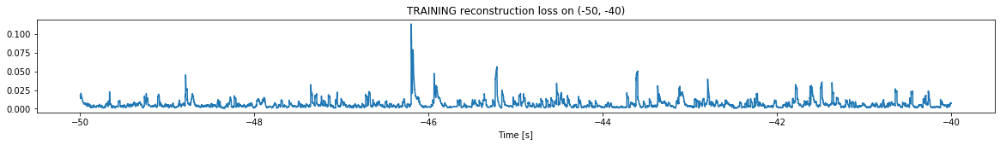

Finished training, median of the log(loss) is:  -2.356837685973052
Triggering for section:  (-40, -30)
Using this median for triggering: -2.055609936063257
Triggering threshold is:  2.6


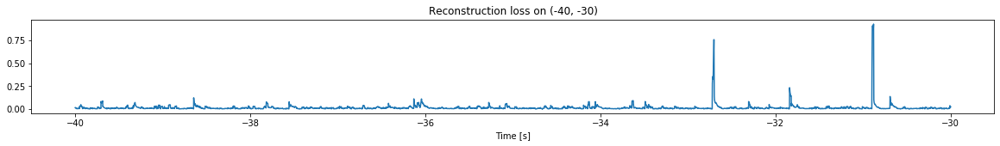

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


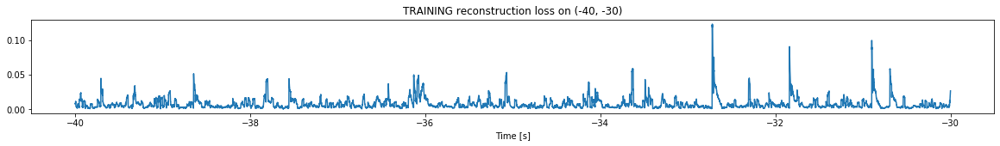

Finished training, median of the log(loss) is:  -2.2478524295564517
Triggering for section:  (-30, -20)
Using this median for triggering: -2.356837685973052
Triggering threshold is:  2.6


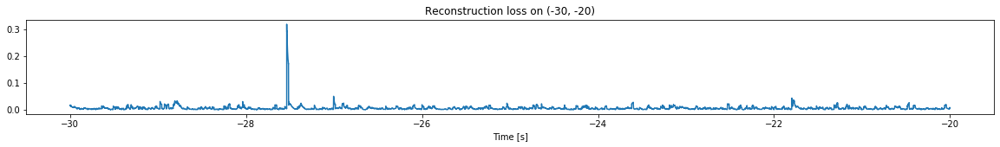

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


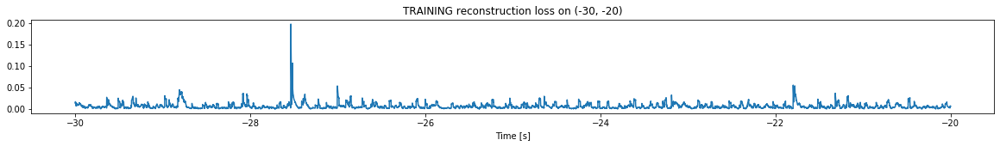

Finished training, median of the log(loss) is:  -2.267413256414515
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2478524295564517
Triggering threshold is:  2.6


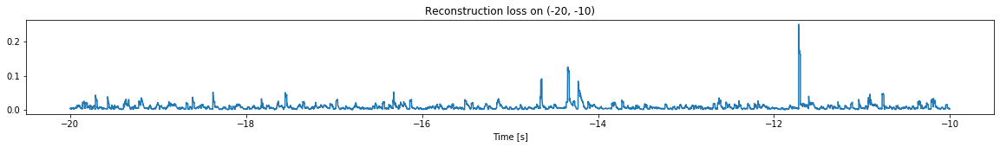

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


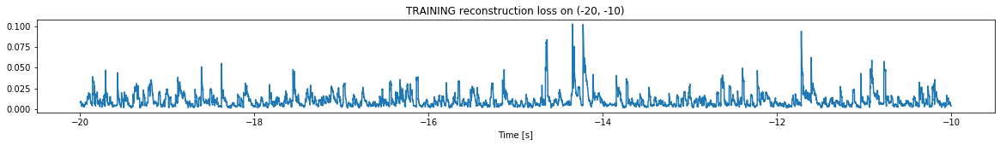

Finished training, median of the log(loss) is:  -2.116884461691261
Triggering for section:  (-10, 0)
Using this median for triggering: -2.267413256414515
Triggering threshold is:  2.6


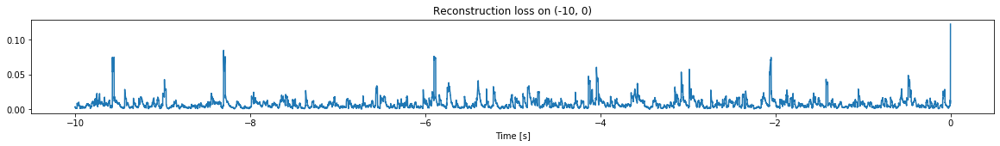

<--------
Finished simulation, all the triggered times are:  [-148.10269, -145.61339, -144.52678, -144.02359, -143.48839, -142.9188, -141.91309, -141.23909, -140.49098, -139.85579, -139.14519, -137.92479, -136.77028, -136.0718, -134.94579, -133.17009, -132.0474, -131.52489, -130.09099, -46.17999]


In [7]:
simulation("./data/Ramp20/", 10, (-212,0), -142)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1197500, 12)
Flushing input history
Number of sections: 12
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


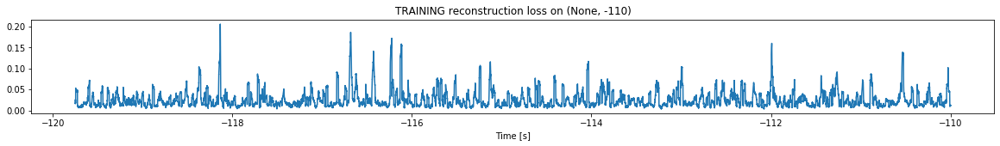

Finished training, median of the log(loss) is:  -1.702702883459316
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


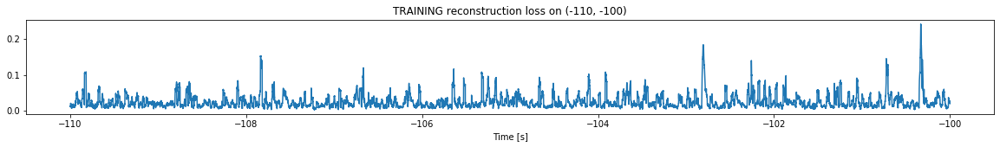

Finished training, median of the log(loss) is:  -1.6868390222607599
Triggering for section:  (-100, -90)
Using this median for triggering: -1.702702883459316
Triggering threshold is:  5.0


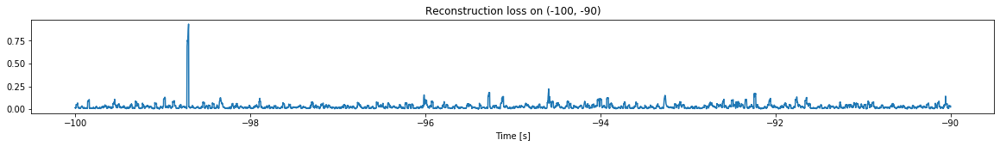

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


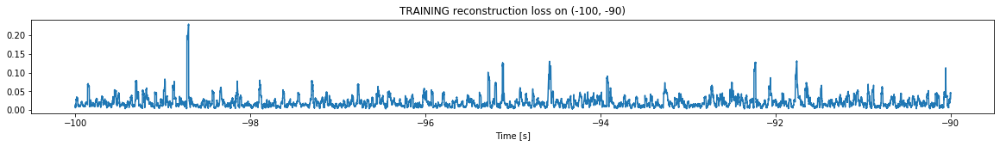

Finished training, median of the log(loss) is:  -1.7655007437736332
Triggering for section:  (-90, -80)
Using this median for triggering: -1.6868390222607599
Triggering threshold is:  4.6


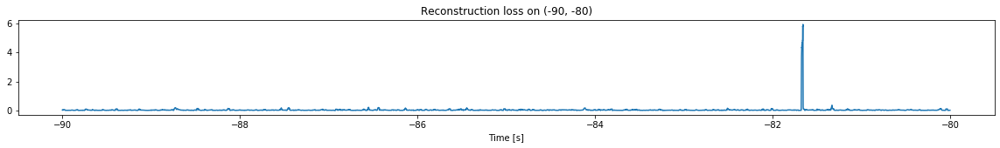

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


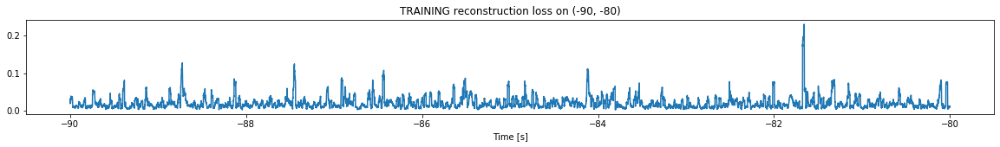

Finished training, median of the log(loss) is:  -1.805165698801391
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7655007437736332
Triggering threshold is:  4.2


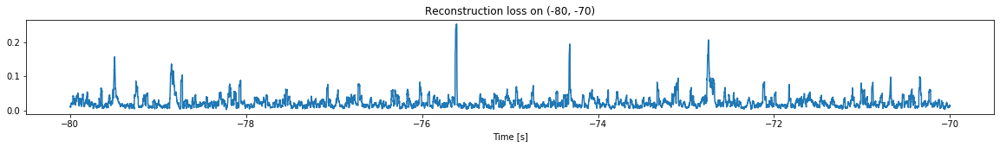

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


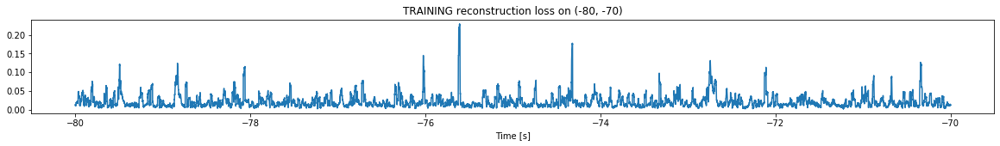

Finished training, median of the log(loss) is:  -1.7489126794456835
Triggering for section:  (-70, -60)
Using this median for triggering: -1.805165698801391
Triggering threshold is:  3.8


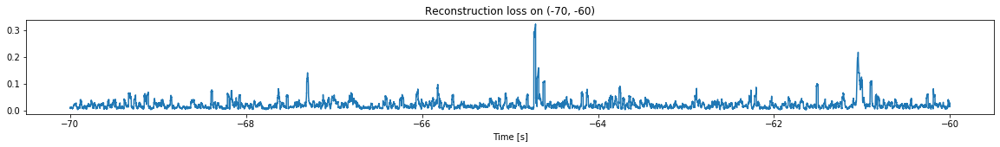

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


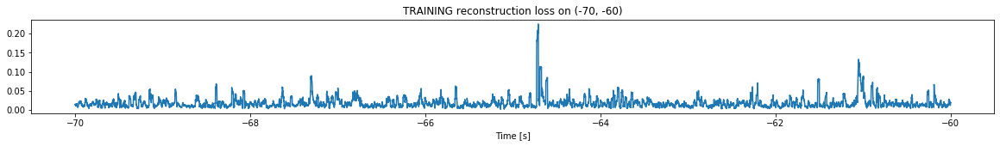

Finished training, median of the log(loss) is:  -1.8373302672093244
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7489126794456835
Triggering threshold is:  3.4000000000000004


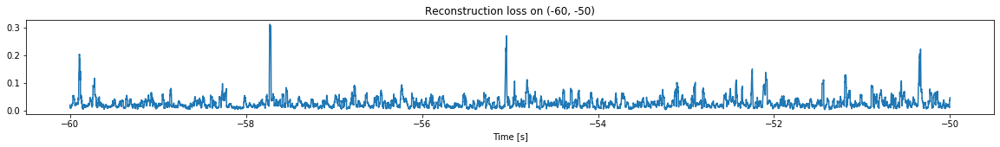

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


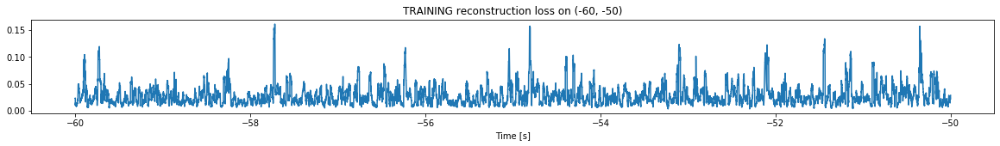

Finished training, median of the log(loss) is:  -1.6235969440252767
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8373302672093244
Triggering threshold is:  3.0


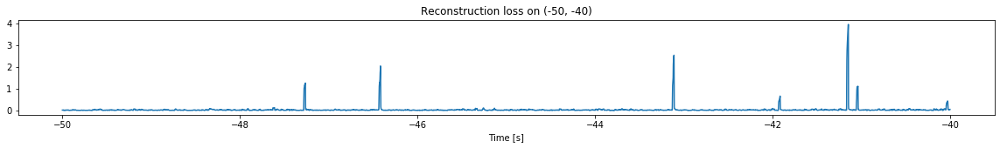

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


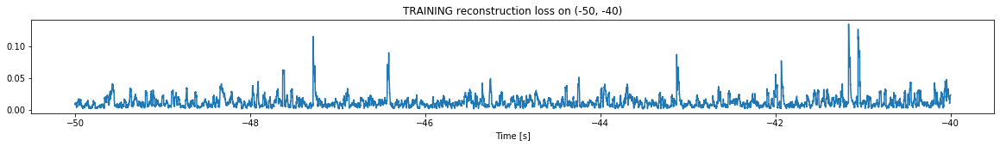

Finished training, median of the log(loss) is:  -1.9849766350617553
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6235969440252767
Triggering threshold is:  2.6


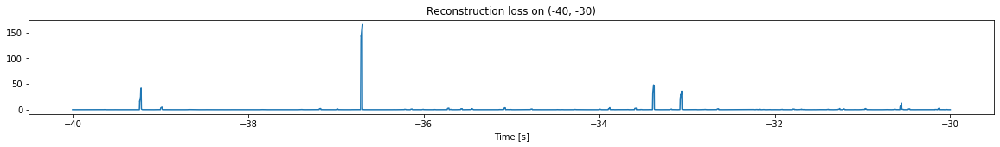

Other trigger time:  [-39.2193   -36.6991   -33.379498 -30.5548  ]
Their log loss values are:  [3.24748833 3.8442737  3.306031   2.73701233]


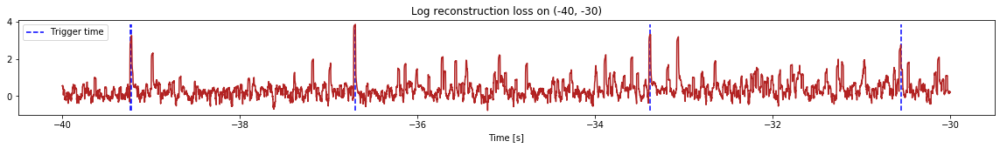

Triggered at:  [-39.2193, -36.6991, -33.379498, -30.5548]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


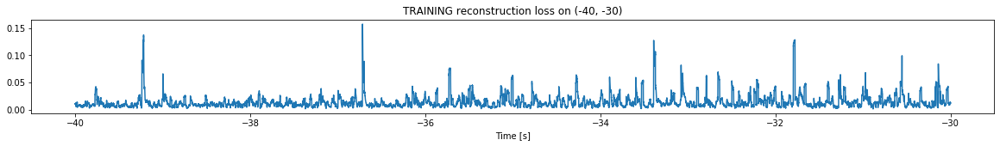

Finished training, median of the log(loss) is:  -1.979468185733819
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9849766350617553
Triggering threshold is:  2.6


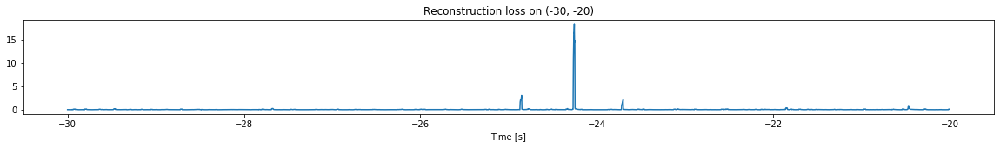

Other trigger time:  [-24.255999]
Their log loss values are:  [3.24650624]


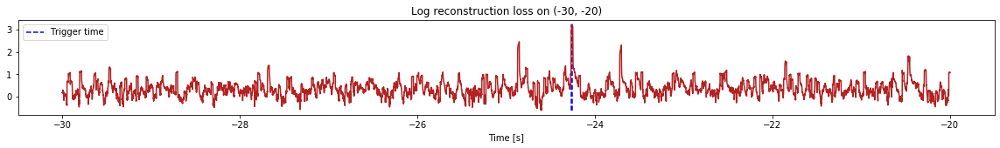

Triggered at:  [-24.255999]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


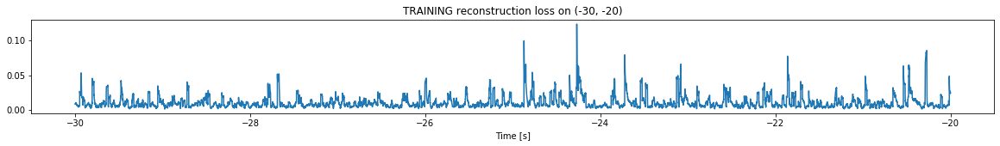

Finished training, median of the log(loss) is:  -2.108431739197386
Triggering for section:  (-20, -10)
Using this median for triggering: -1.979468185733819
Triggering threshold is:  2.6


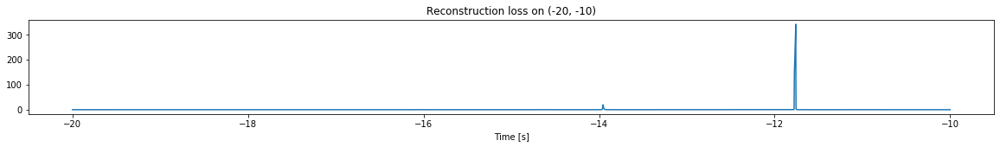

Other trigger time:  [-13.9534 -11.759 ]
Their log loss values are:  [3.281061   4.51480077]


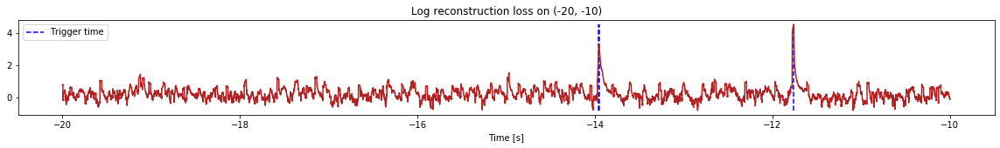

Triggered at:  [-13.9534, -11.759]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


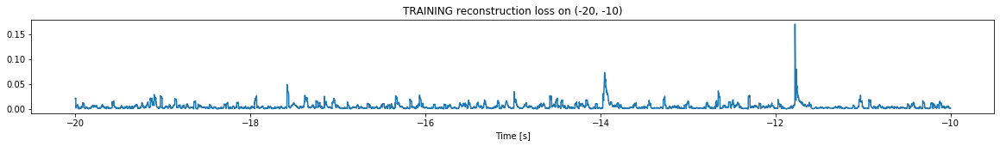

Finished training, median of the log(loss) is:  -2.428742393340813
Triggering for section:  (-10, 0)
Using this median for triggering: -2.108431739197386
Triggering threshold is:  2.6


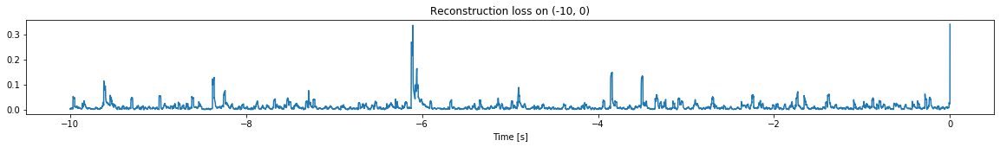

<--------
Finished simulation, all the triggered times are:  [-39.2193, -36.6991, -33.379498, -30.5548, -24.255999, -13.9534, -11.759]


In [8]:
simulation("./data/Ramp21/", 10, (-120,0), -31.1)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (797500, 12)
Flushing input history
Number of sections: 8
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-80, -70)
-------->
Entering sections:  (-70, -60)
-------->
Training for section:  (None, -70)


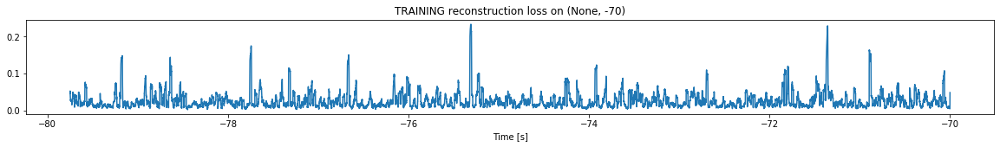

Finished training, median of the log(loss) is:  -1.6706785965474678
<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


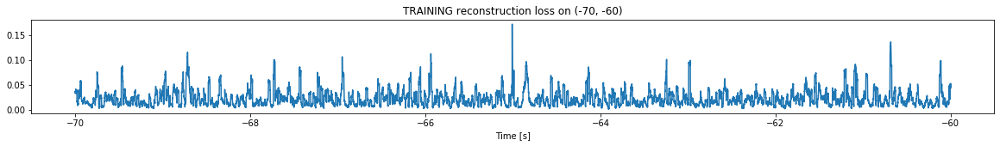

Finished training, median of the log(loss) is:  -1.7064565944730292
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6706785965474678
Triggering threshold is:  5.0


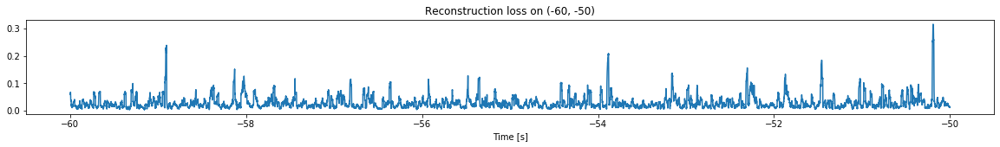

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


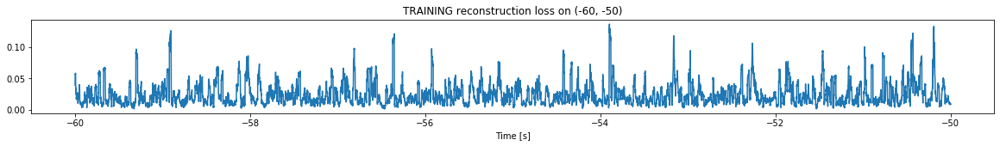

Finished training, median of the log(loss) is:  -1.697111589364149
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7064565944730292
Triggering threshold is:  4.6


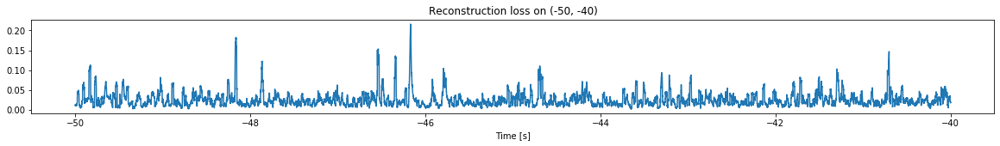

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


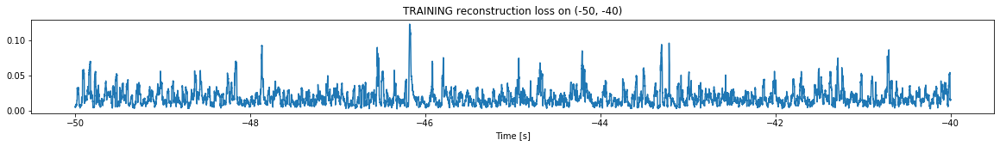

Finished training, median of the log(loss) is:  -1.7939168975849524
Triggering for section:  (-40, -30)
Using this median for triggering: -1.697111589364149
Triggering threshold is:  4.2


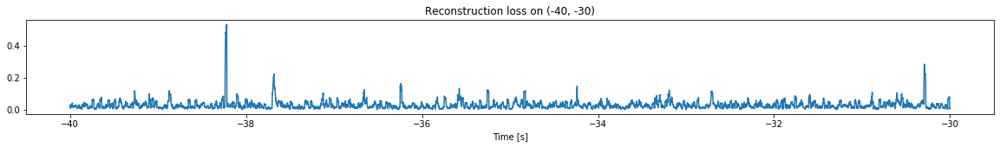

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


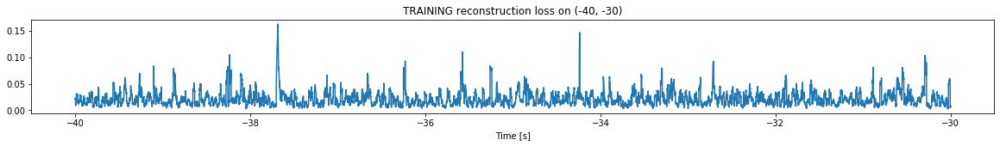

Finished training, median of the log(loss) is:  -1.7262397589186285
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7939168975849524
Triggering threshold is:  3.8


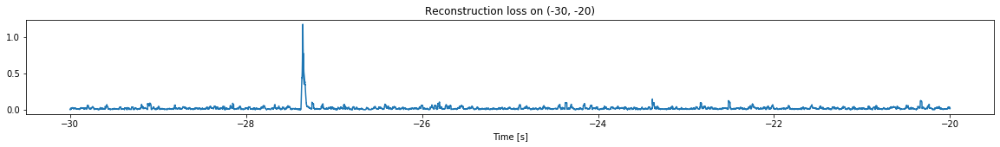

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


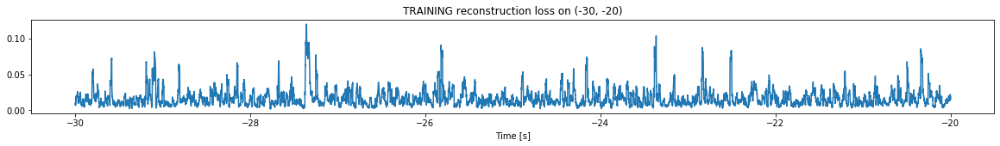

Finished training, median of the log(loss) is:  -1.8607474763148322
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7262397589186285
Triggering threshold is:  3.4000000000000004


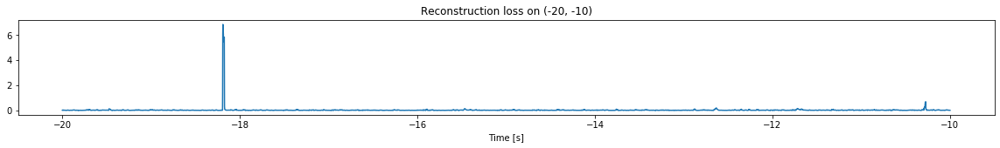

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


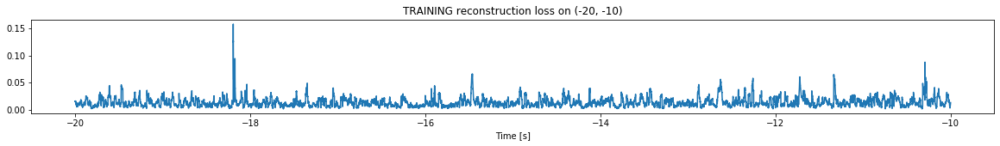

Finished training, median of the log(loss) is:  -1.930500673242781
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8607474763148322
Triggering threshold is:  3.0


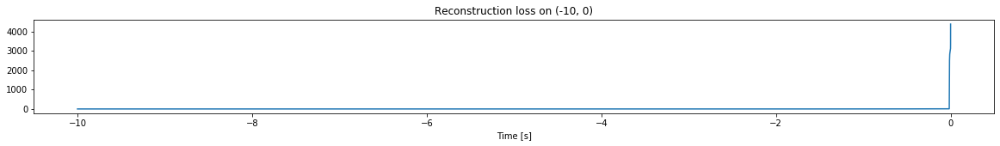

Other trigger time:  []
Their log loss values are:  []


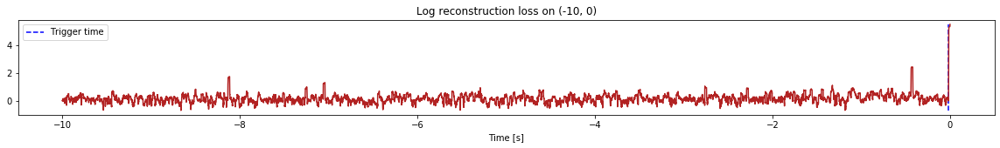

Triggered at:  []
<--------
Finished simulation, all the triggered times are:  []


In [9]:
simulation("./data/Ramp22/", 10, (-80,0), 3)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (497500, 12)
Flushing input history
Number of sections: 5
Number of triggering sections 5
List of trigger thresholds:  [0, 0, 5.0, 3.8, 2.6]
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


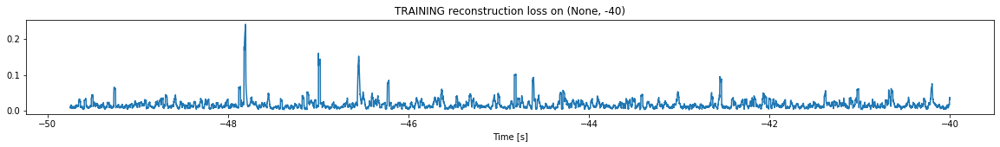

Finished training, median of the log(loss) is:  -1.8545160109456094
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


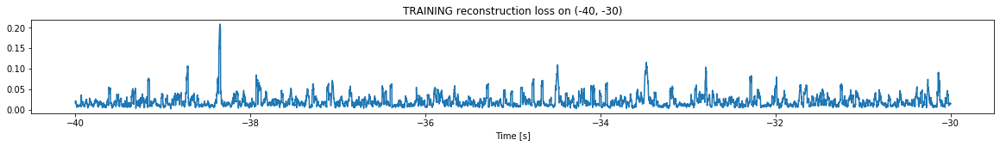

Finished training, median of the log(loss) is:  -1.779713675722158
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8545160109456094
Triggering threshold is:  5.0


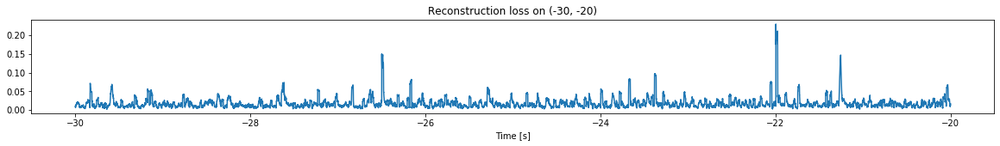

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


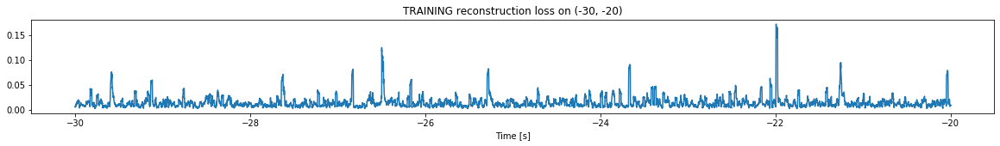

Finished training, median of the log(loss) is:  -1.9405357281105255
Triggering for section:  (-20, -10)
Using this median for triggering: -1.779713675722158
Triggering threshold is:  3.8


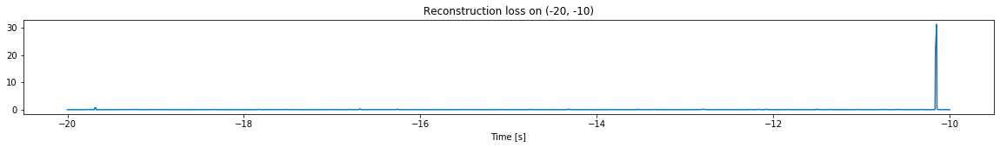

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


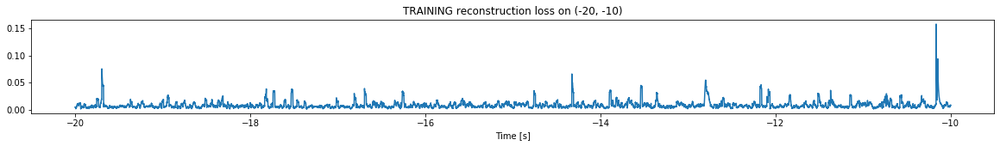

Finished training, median of the log(loss) is:  -2.1752482838388625
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9405357281105255
Triggering threshold is:  2.6


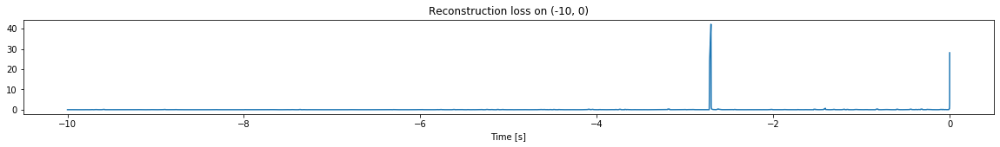

Other trigger time:  [-2.7054]
Their log loss values are:  [3.56680078]


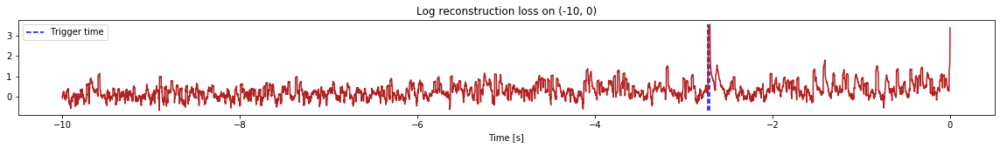

Triggered at:  [-2.7054]
<--------
Finished simulation, all the triggered times are:  [-2.7054]


In [10]:
simulation("./data/Ramp23/", 10, (-50,0), -6)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


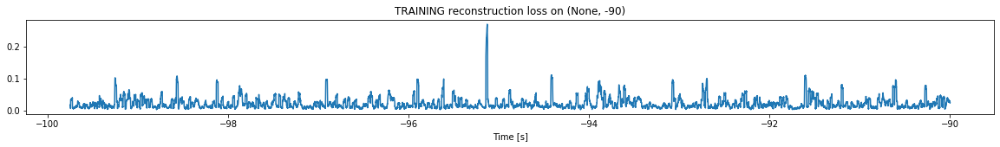

Finished training, median of the log(loss) is:  -1.7470207227044035
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


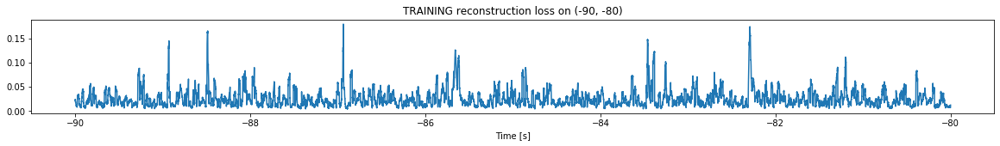

Finished training, median of the log(loss) is:  -1.6683360325530545
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7470207227044035
Triggering threshold is:  5.0


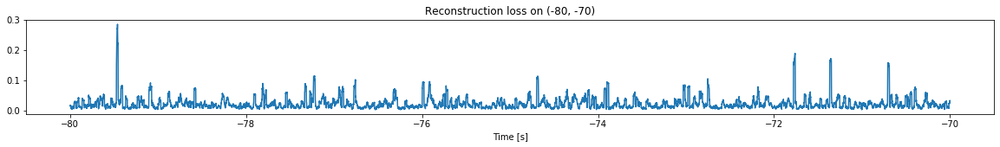

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


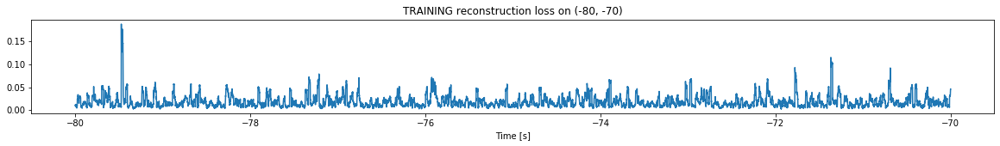

Finished training, median of the log(loss) is:  -1.822934779518652
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6683360325530545
Triggering threshold is:  4.6


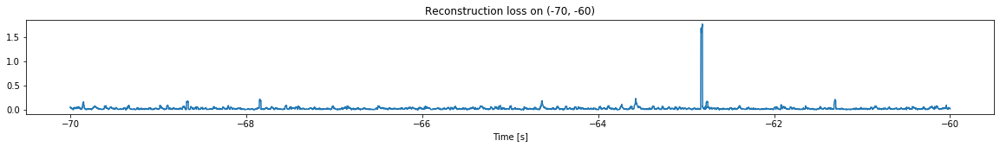

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


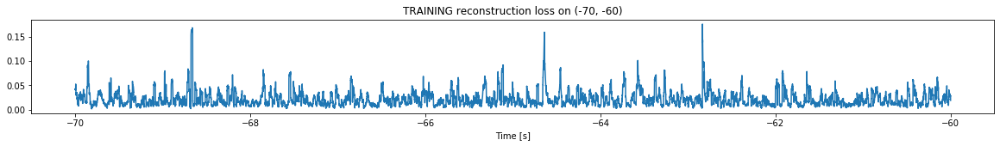

Finished training, median of the log(loss) is:  -1.7448279883252882
Triggering for section:  (-60, -50)
Using this median for triggering: -1.822934779518652
Triggering threshold is:  4.2


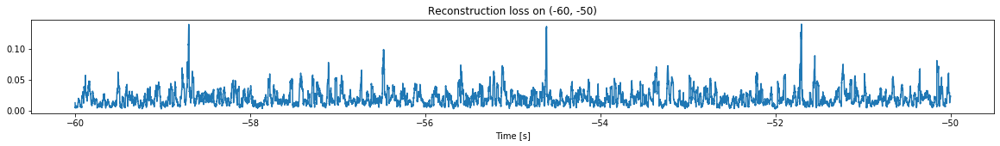

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


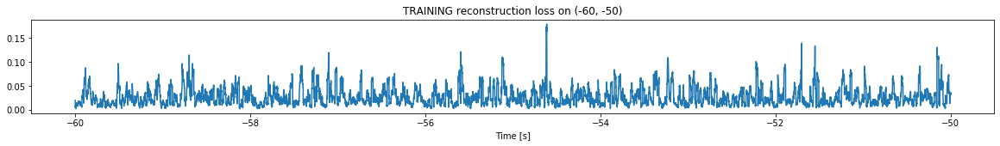

Finished training, median of the log(loss) is:  -1.626728075057359
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7448279883252882
Triggering threshold is:  3.8


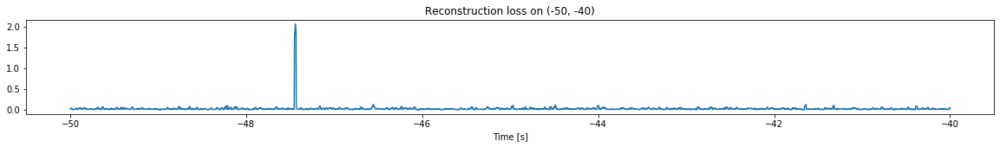

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


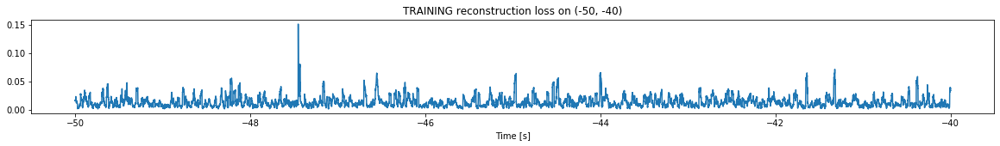

Finished training, median of the log(loss) is:  -1.9176544871822232
Triggering for section:  (-40, -30)
Using this median for triggering: -1.626728075057359
Triggering threshold is:  3.4000000000000004


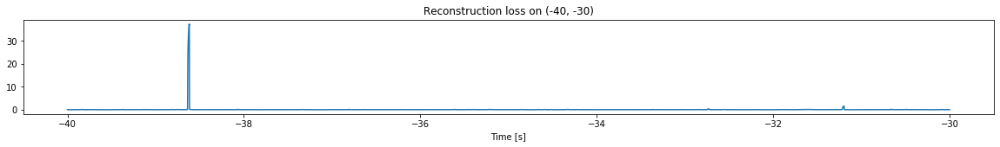

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


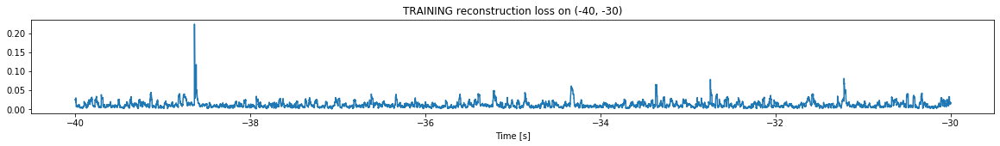

Finished training, median of the log(loss) is:  -1.9817405797178802
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9176544871822232
Triggering threshold is:  3.0


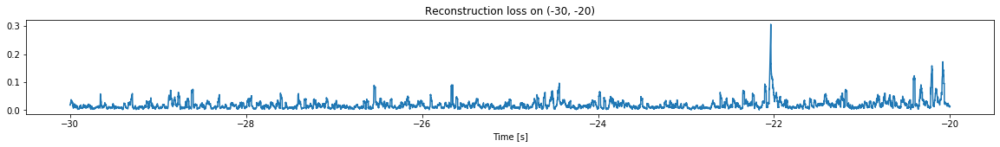

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


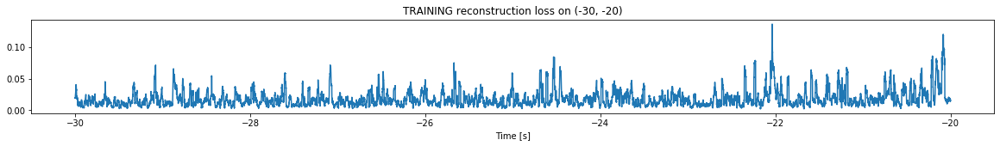

Finished training, median of the log(loss) is:  -1.8203574643319094
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9817405797178802
Triggering threshold is:  2.6


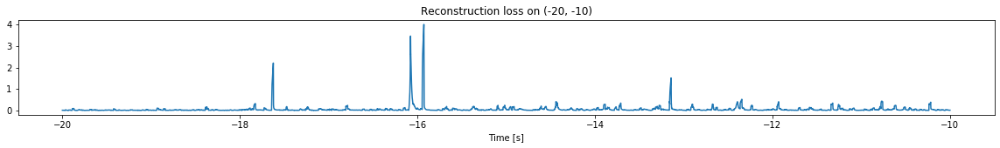

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


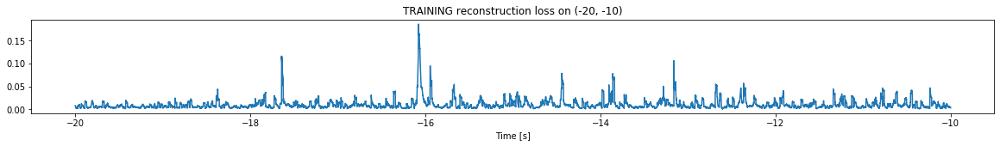

Finished training, median of the log(loss) is:  -2.0947097777276564
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8203574643319094
Triggering threshold is:  2.6


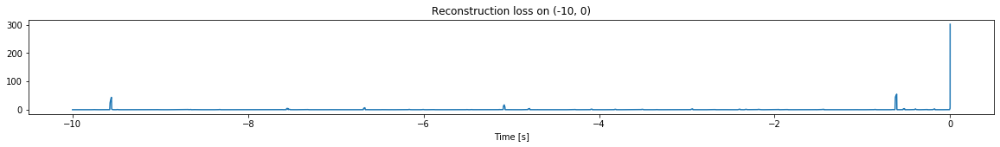

Other trigger time:  [-9.5574 -6.6685 -5.0804 -0.6089]
Their log loss values are:  [3.45951936 2.669446   3.04967832 3.56037156]


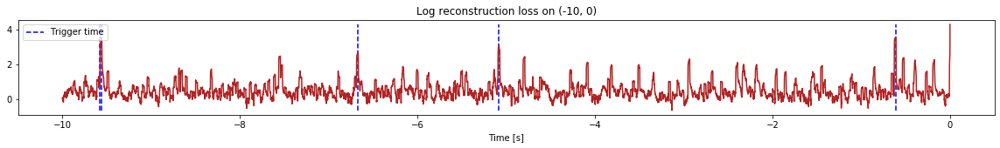

Triggered at:  [-9.5574, -6.6685, -5.0804, -0.6089]
<--------
Finished simulation, all the triggered times are:  [-9.5574, -6.6685, -5.0804, -0.6089]


In [11]:
simulation("./data/Ramp24/", 10, (-100,0), -19.3)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


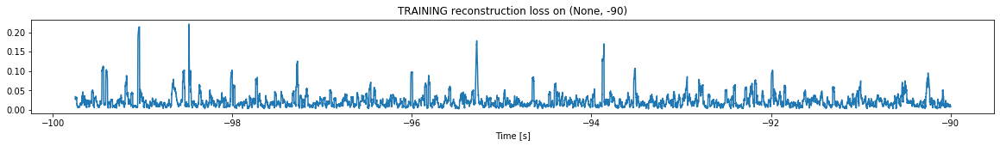

Finished training, median of the log(loss) is:  -1.7427031910139943
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


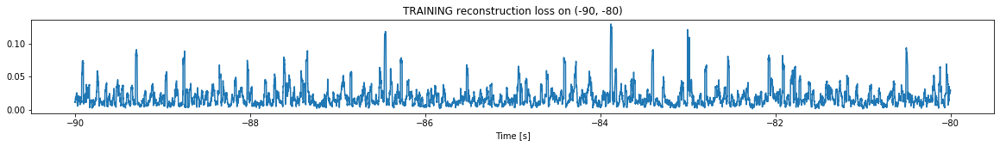

Finished training, median of the log(loss) is:  -1.8181289630236948
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7427031910139943
Triggering threshold is:  5.0


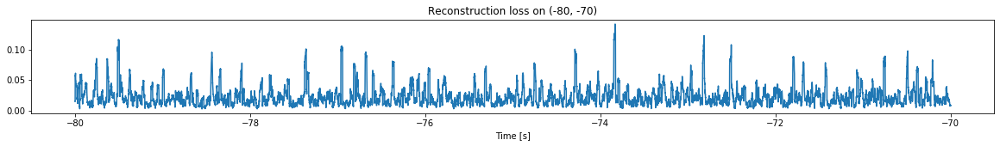

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


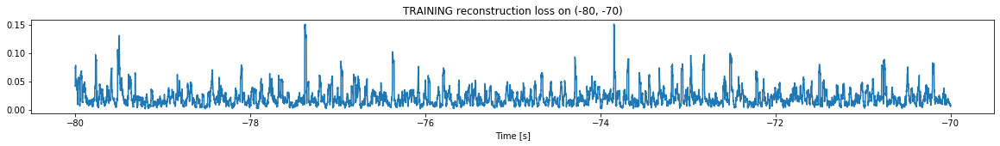

Finished training, median of the log(loss) is:  -1.7321972685124352
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8181289630236948
Triggering threshold is:  4.6


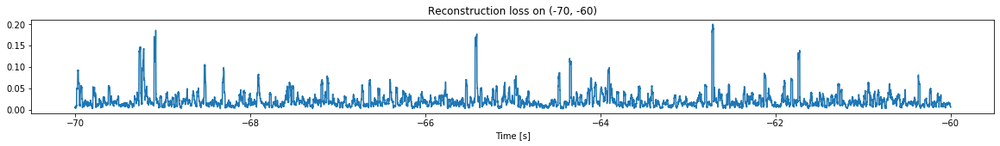

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


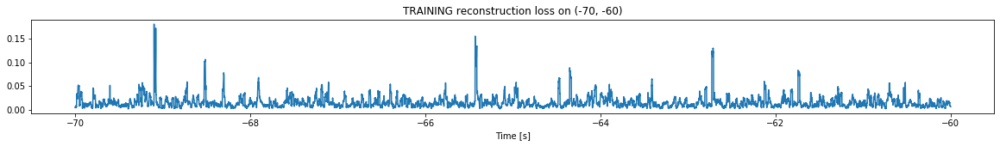

Finished training, median of the log(loss) is:  -1.8939161041351675
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7321972685124352
Triggering threshold is:  4.2


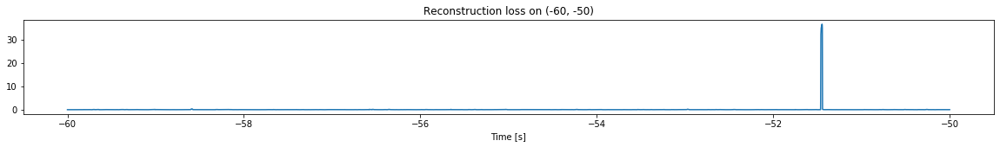

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


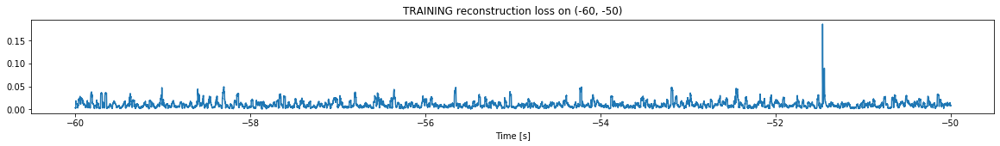

Finished training, median of the log(loss) is:  -2.043639194048545
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8939161041351675
Triggering threshold is:  3.8


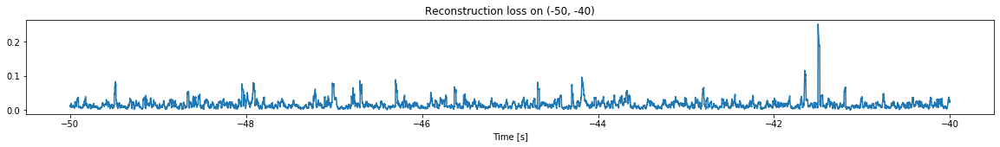

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


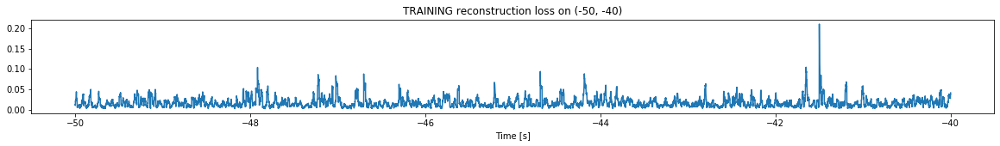

Finished training, median of the log(loss) is:  -1.85842948023565
Triggering for section:  (-40, -30)
Using this median for triggering: -2.043639194048545
Triggering threshold is:  3.4000000000000004


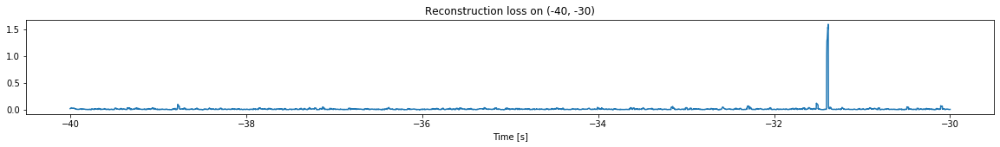

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


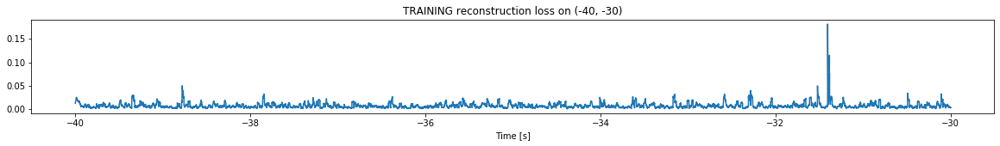

Finished training, median of the log(loss) is:  -2.2092515787289564
Triggering for section:  (-30, -20)
Using this median for triggering: -1.85842948023565
Triggering threshold is:  3.0


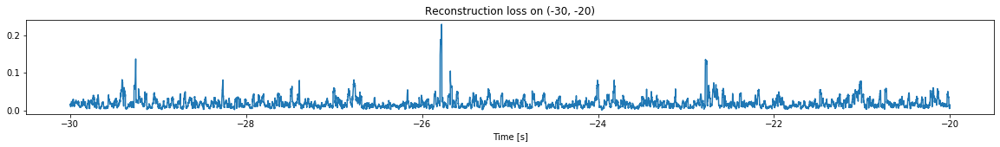

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


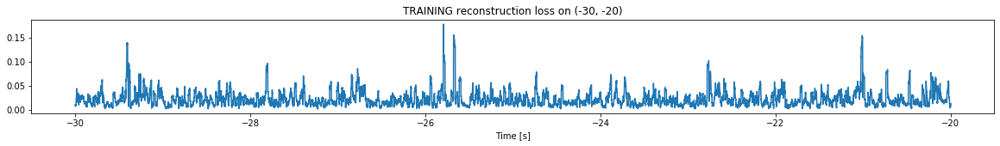

Finished training, median of the log(loss) is:  -1.713211047080697
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2092515787289564
Triggering threshold is:  2.6


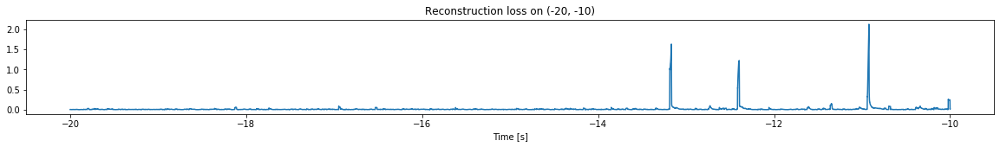

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


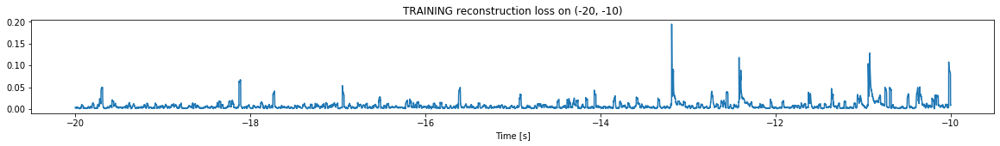

Finished training, median of the log(loss) is:  -2.287325591041408
Triggering for section:  (-10, 0)
Using this median for triggering: -1.713211047080697
Triggering threshold is:  2.6


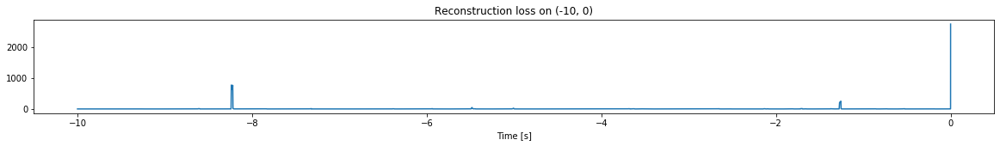

Other trigger time:  [-8.2364    -7.3210998 -5.4825    -3.6747    -2.6526    -2.1334
 -1.2574999]
Their log loss values are:  [4.6051012  2.8134503  3.38714223 2.6019265  2.71876053 2.70848548
 4.11886895]


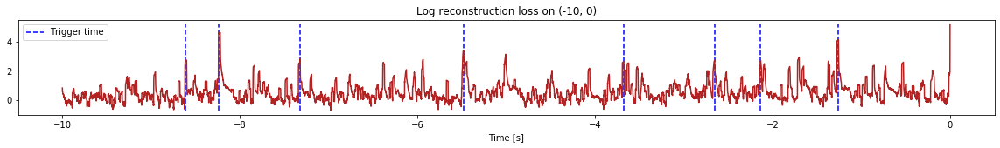

Triggered at:  [-8.2364, -7.3210998, -5.4825, -3.6747, -2.6526, -2.1334, -1.2574999]
<--------
Finished simulation, all the triggered times are:  [-8.2364, -7.3210998, -5.4825, -3.6747, -2.6526, -2.1334, -1.2574999]


In [12]:
simulation("./data/Ramp25/", 10, (-100,0), -10)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1097500, 12)
Flushing input history
Number of sections: 11
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


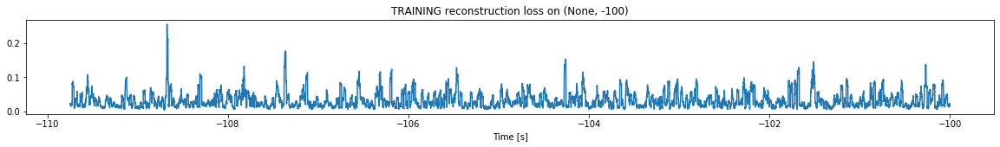

Finished training, median of the log(loss) is:  -1.5820419549911753
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


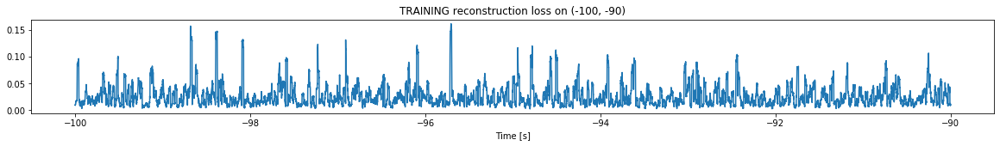

Finished training, median of the log(loss) is:  -1.6630087377283473
Triggering for section:  (-90, -80)
Using this median for triggering: -1.5820419549911753
Triggering threshold is:  5.0


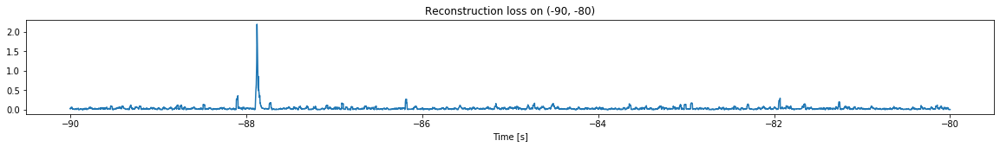

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


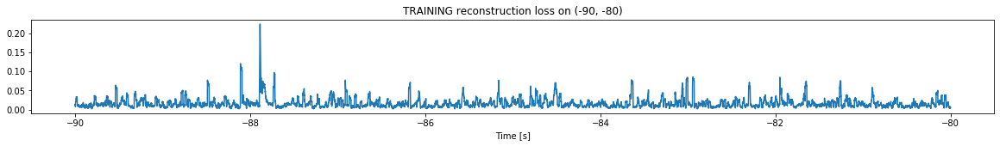

Finished training, median of the log(loss) is:  -1.868281101713511
Triggering for section:  (-80, -70)
Using this median for triggering: -1.6630087377283473
Triggering threshold is:  4.6


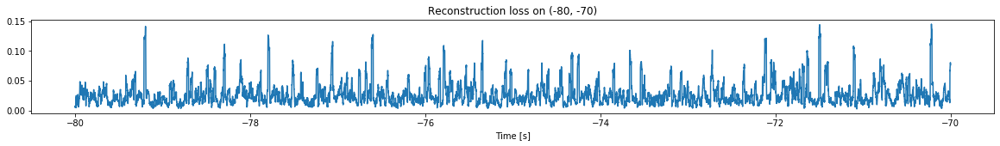

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


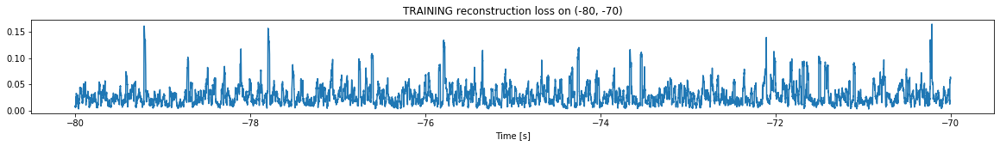

Finished training, median of the log(loss) is:  -1.6087214893456698
Triggering for section:  (-70, -60)
Using this median for triggering: -1.868281101713511
Triggering threshold is:  4.2


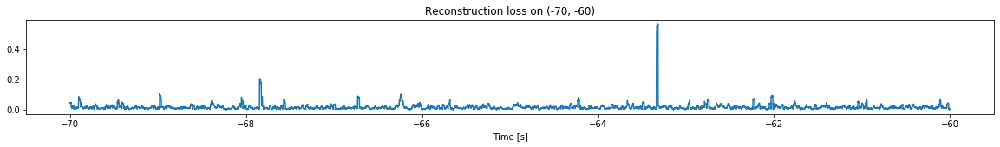

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


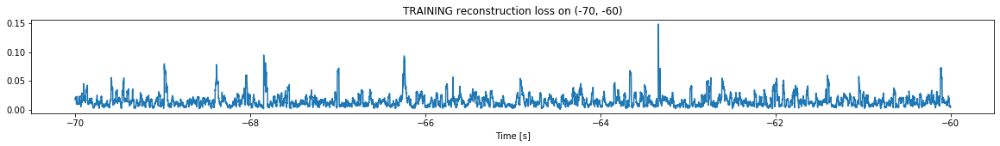

Finished training, median of the log(loss) is:  -1.8916720078359903
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6087214893456698
Triggering threshold is:  3.8


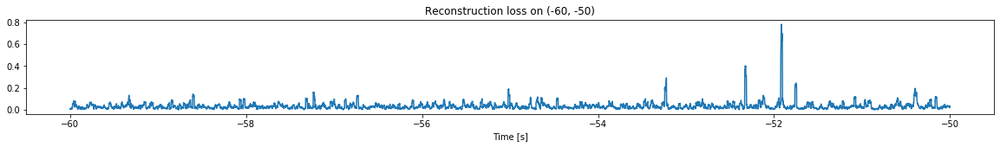

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


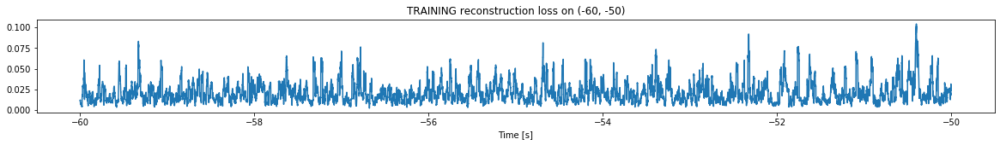

Finished training, median of the log(loss) is:  -1.7493099174816427
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8916720078359903
Triggering threshold is:  3.4000000000000004


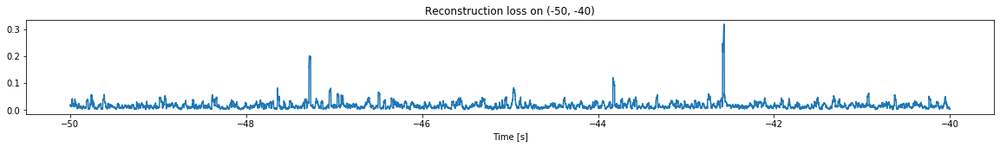

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


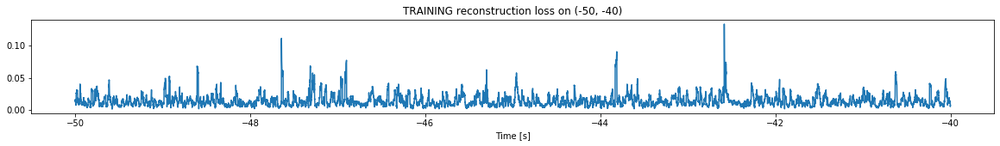

Finished training, median of the log(loss) is:  -1.9174108302044357
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7493099174816427
Triggering threshold is:  3.0


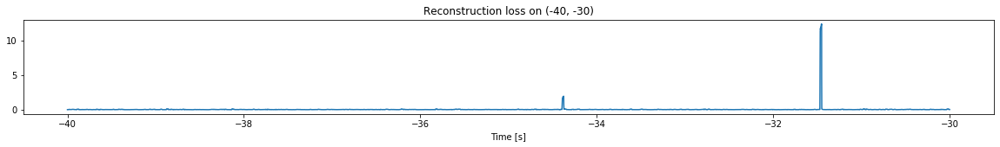

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


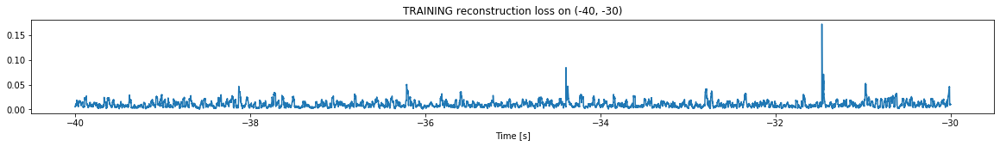

Finished training, median of the log(loss) is:  -2.0495743039905996
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9174108302044357
Triggering threshold is:  2.6


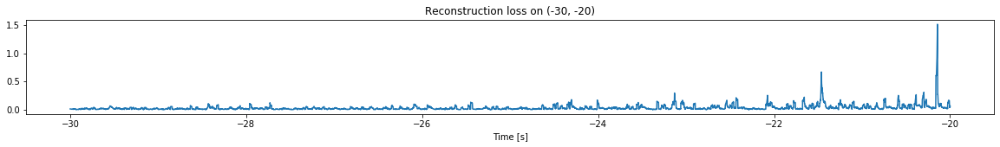

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


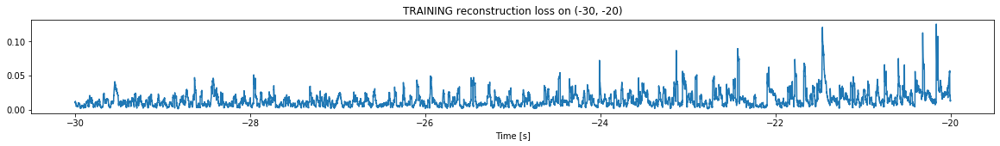

Finished training, median of the log(loss) is:  -1.9525831496835226
Triggering for section:  (-20, -10)
Using this median for triggering: -2.0495743039905996
Triggering threshold is:  2.6


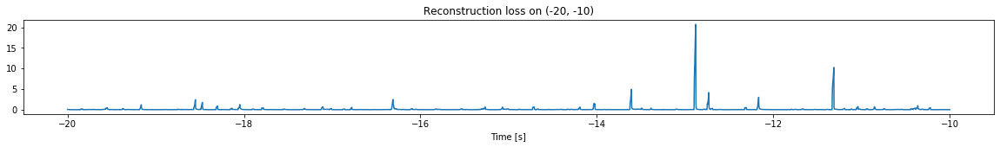

Other trigger time:  [-13.608  -12.8804 -11.3139]
Their log loss values are:  [2.74386041 3.36656044 3.06130665]


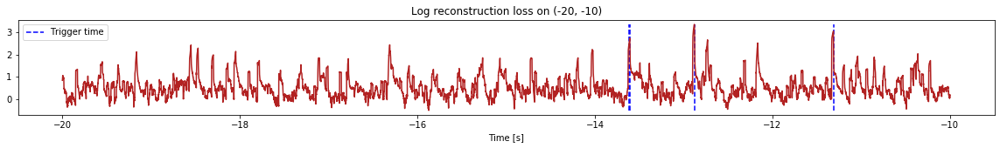

Triggered at:  [-13.608, -12.8804, -11.3139]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


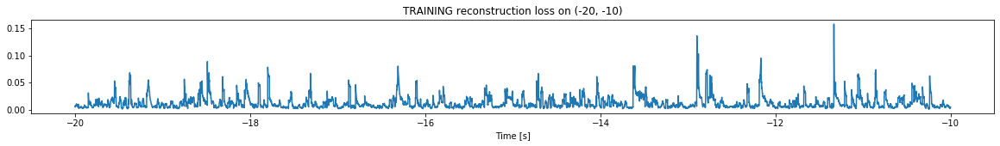

Finished training, median of the log(loss) is:  -2.0789897160793247
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9525831496835226
Triggering threshold is:  2.6


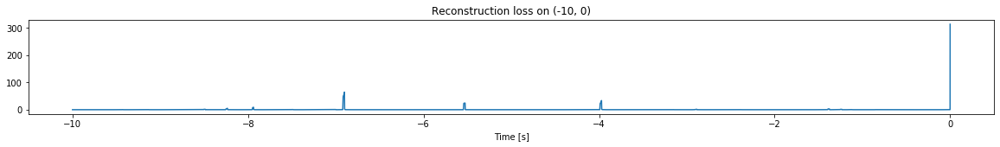

Other trigger time:  [-7.9374 -6.9013 -5.5281 -3.9722]
Their log loss values are:  [2.9086419  3.76266379 3.33991414 3.47980032]


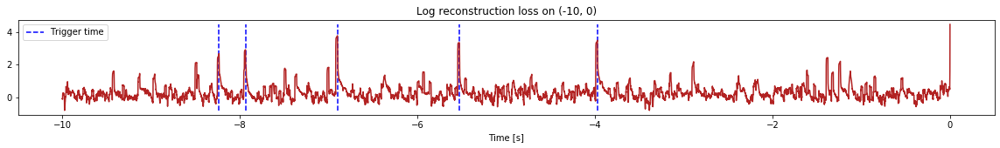

Triggered at:  [-7.9374, -6.9013, -5.5281, -3.9722]
<--------
Finished simulation, all the triggered times are:  [-13.608, -12.8804, -11.3139, -7.9374, -6.9013, -5.5281, -3.9722]


In [13]:
simulation("./data/Ramp26/", 10, (-110,0), -23)

In [14]:
#simulation("./data/Ramp27/", 10, (-70,0), 21.5)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (597500, 12)
Flushing input history
Number of sections: 6
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


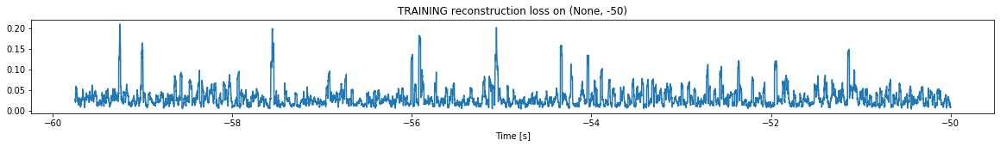

Finished training, median of the log(loss) is:  -1.5836313879080948
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


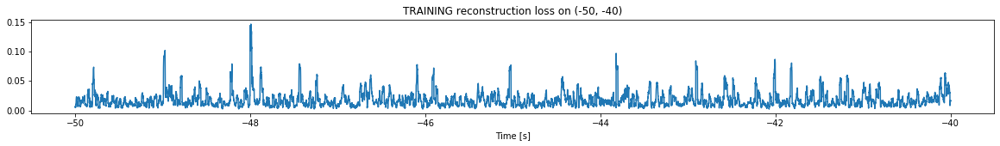

Finished training, median of the log(loss) is:  -1.8349866911739634
Triggering for section:  (-40, -30)
Using this median for triggering: -1.5836313879080948
Triggering threshold is:  5.0


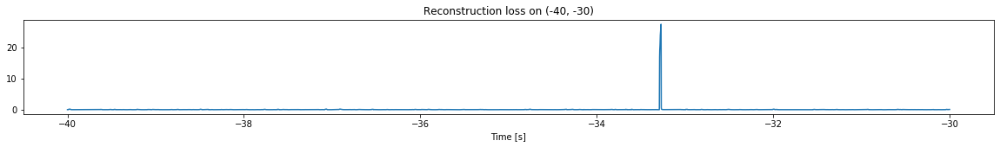

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


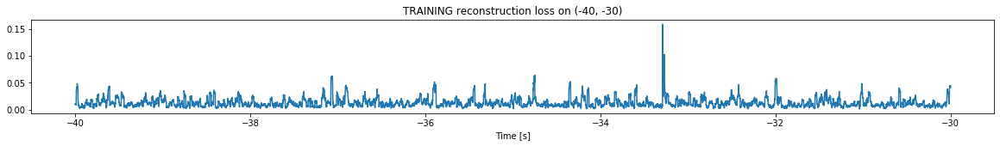

Finished training, median of the log(loss) is:  -1.9702737990204138
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8349866911739634
Triggering threshold is:  4.6


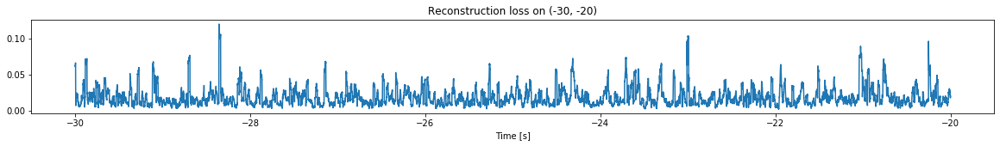

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


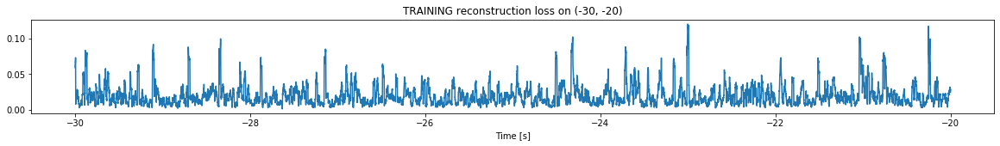

Finished training, median of the log(loss) is:  -1.7720932819827255
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9702737990204138
Triggering threshold is:  4.2


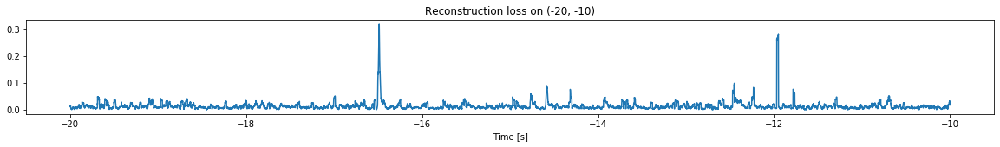

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


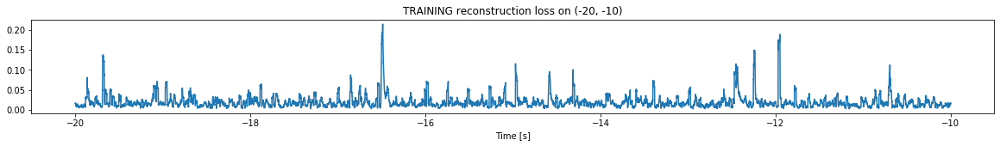

Finished training, median of the log(loss) is:  -1.794108277195848
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7720932819827255
Triggering threshold is:  3.8


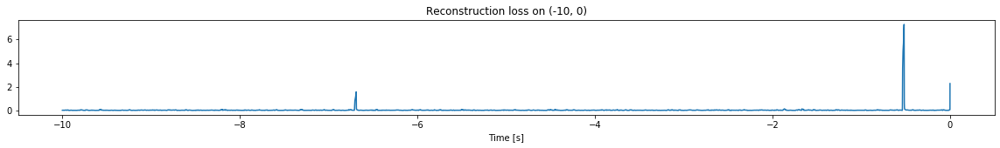

<--------
Finished simulation, all the triggered times are:  []


In [15]:
simulation("./data/Ramp28/", 10, (-60,0), 27.7)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (997500, 12)
Flushing input history
Number of sections: 10
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


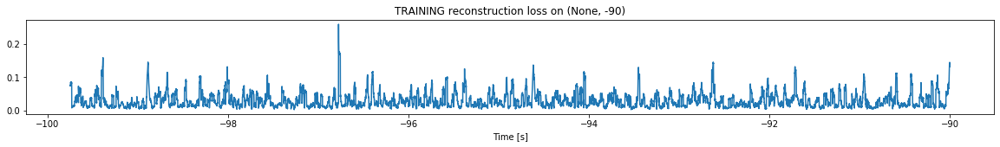

Finished training, median of the log(loss) is:  -1.6098397625044367
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


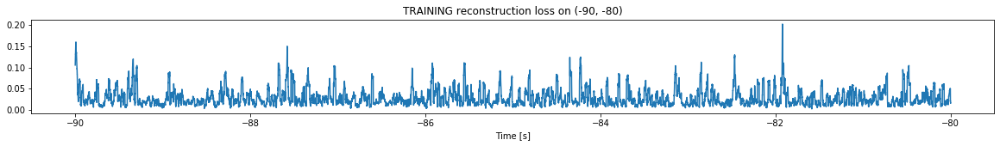

Finished training, median of the log(loss) is:  -1.638750315122131
Triggering for section:  (-80, -70)
Using this median for triggering: -1.6098397625044367
Triggering threshold is:  5.0


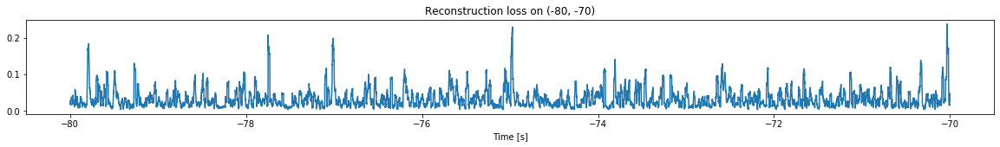

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


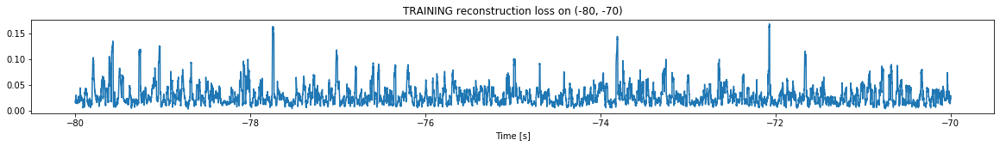

Finished training, median of the log(loss) is:  -1.6282789366692154
Triggering for section:  (-70, -60)
Using this median for triggering: -1.638750315122131
Triggering threshold is:  4.6


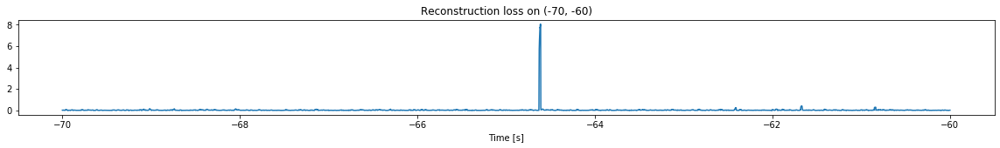

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


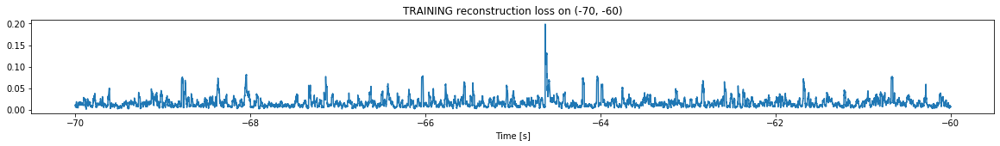

Finished training, median of the log(loss) is:  -1.8549178303417098
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6282789366692154
Triggering threshold is:  4.2


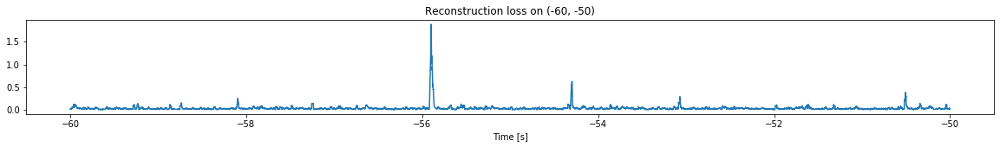

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


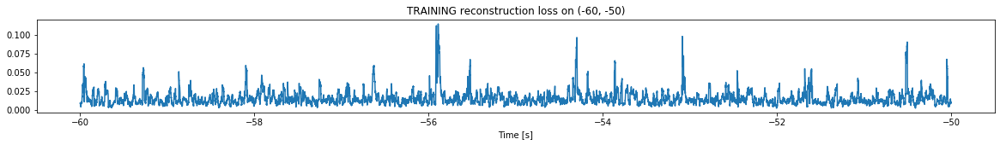

Finished training, median of the log(loss) is:  -1.8801488699625768
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8549178303417098
Triggering threshold is:  3.8


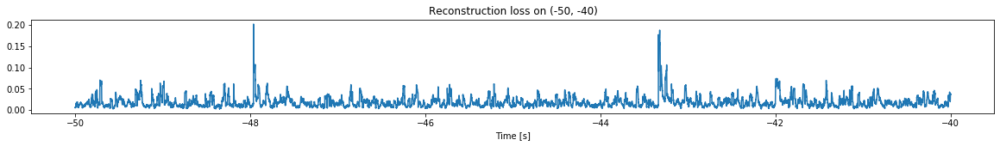

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


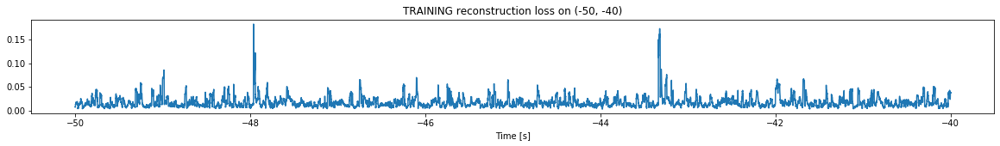

Finished training, median of the log(loss) is:  -1.842510788803938
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8801488699625768
Triggering threshold is:  3.4000000000000004


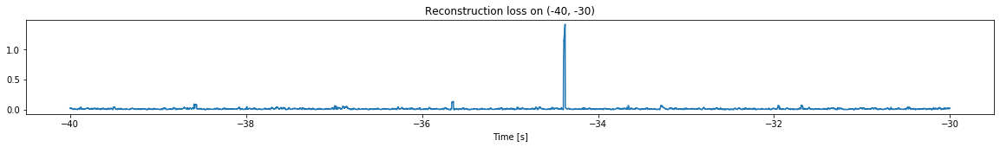

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


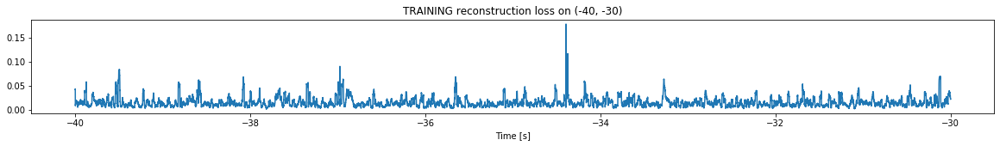

Finished training, median of the log(loss) is:  -1.902678380340196
Triggering for section:  (-30, -20)
Using this median for triggering: -1.842510788803938
Triggering threshold is:  3.0


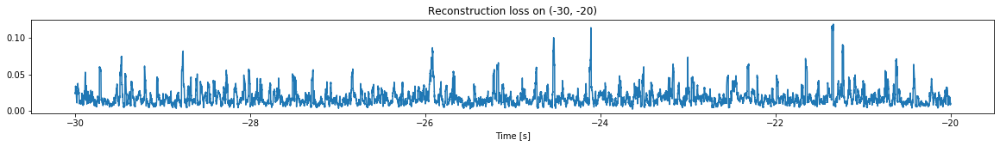

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


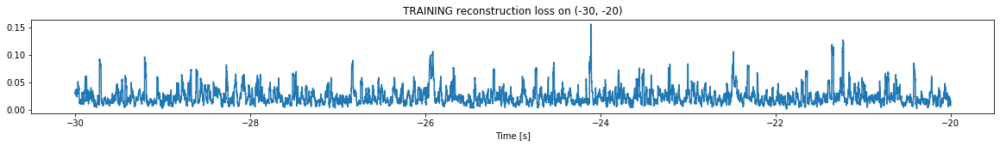

Finished training, median of the log(loss) is:  -1.6714270834409954
Triggering for section:  (-20, -10)
Using this median for triggering: -1.902678380340196
Triggering threshold is:  2.6


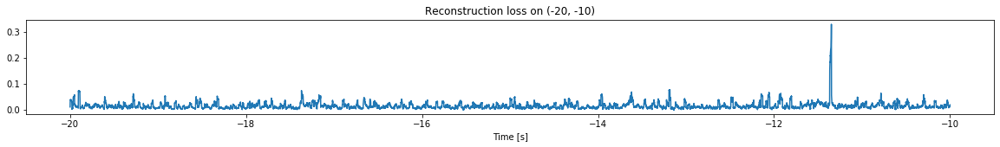

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


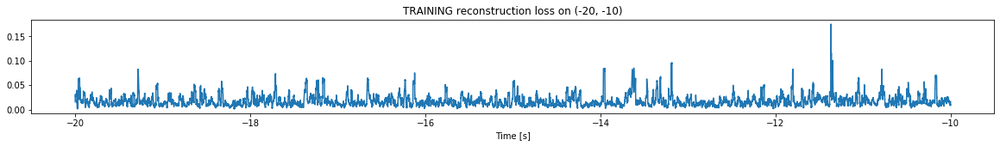

Finished training, median of the log(loss) is:  -1.8189578945900855
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6714270834409954
Triggering threshold is:  2.6


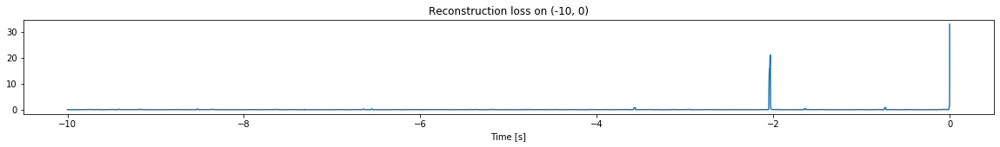

Other trigger time:  [-2.0335]
Their log loss values are:  [2.99589154]


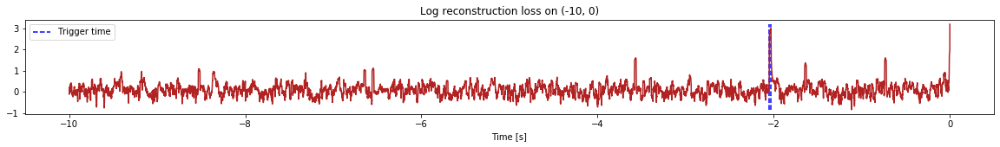

Triggered at:  [-2.0335]
<--------
Finished simulation, all the triggered times are:  [-2.0335]


In [16]:
simulation("./data/Ramp29/", 10, (-100,0), -14)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1197500, 12)
Flushing input history
Number of sections: 12
Number of triggering sections 9
List of trigger thresholds:  [0, 0, 5.0, 4.6, 4.2, 3.8, 3.4000000000000004, 3.0, 2.6]
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


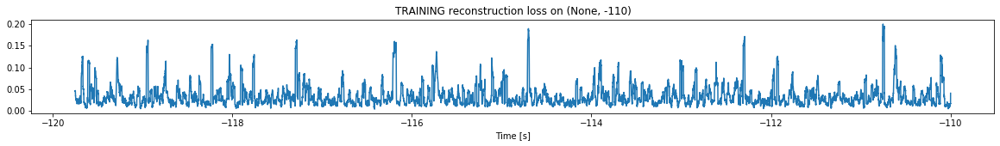

Finished training, median of the log(loss) is:  -1.5685699814505132
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


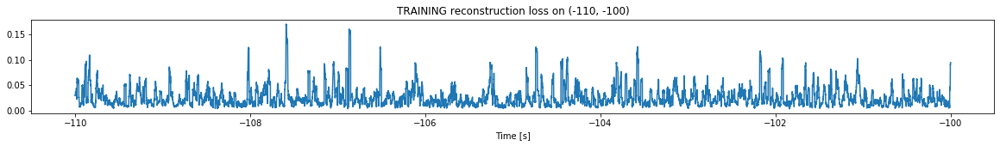

Finished training, median of the log(loss) is:  -1.6879175243309876
Triggering for section:  (-100, -90)
Using this median for triggering: -1.5685699814505132
Triggering threshold is:  5.0


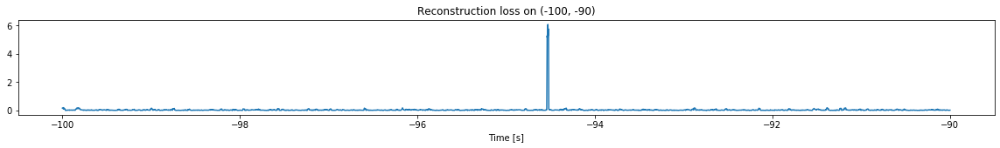

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


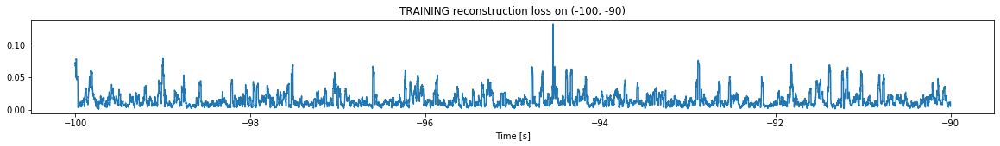

Finished training, median of the log(loss) is:  -1.9169062644073334
Triggering for section:  (-90, -80)
Using this median for triggering: -1.6879175243309876
Triggering threshold is:  4.6


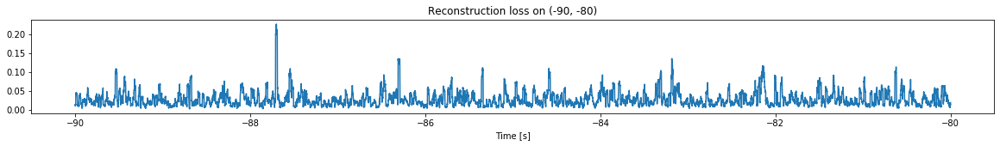

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


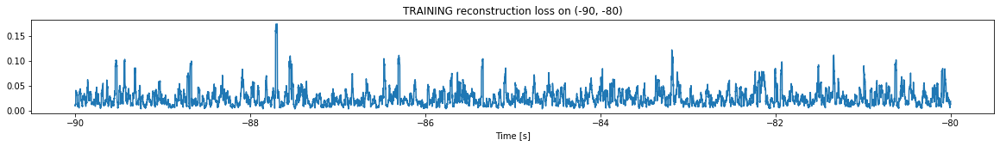

Finished training, median of the log(loss) is:  -1.6689142023370787
Triggering for section:  (-80, -70)
Using this median for triggering: -1.9169062644073334
Triggering threshold is:  4.2


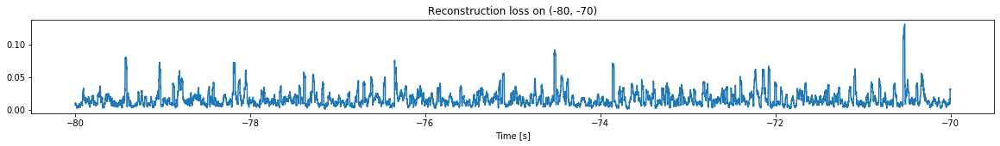

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


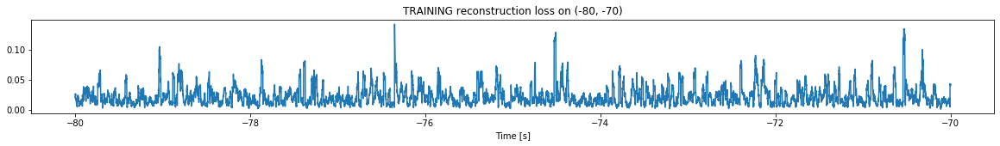

Finished training, median of the log(loss) is:  -1.717821070034668
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6689142023370787
Triggering threshold is:  3.8


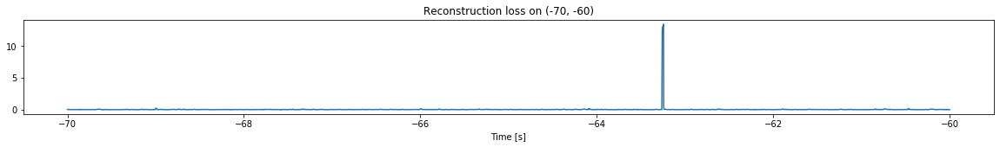

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


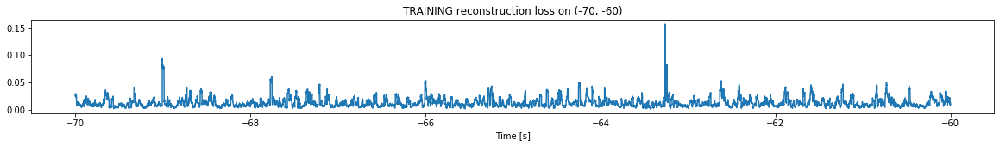

Finished training, median of the log(loss) is:  -1.9796082158400177
Triggering for section:  (-60, -50)
Using this median for triggering: -1.717821070034668
Triggering threshold is:  3.4000000000000004


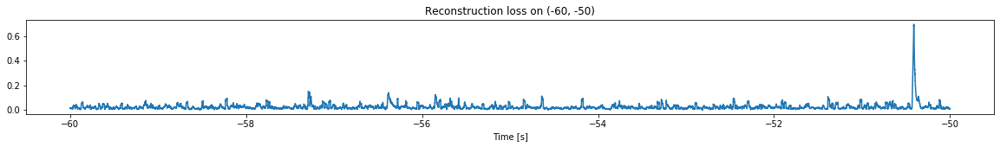

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


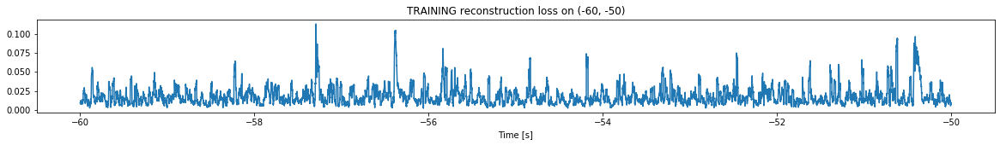

Finished training, median of the log(loss) is:  -1.826572294218627
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9796082158400177
Triggering threshold is:  3.0


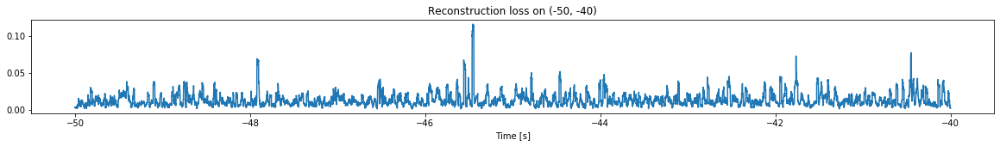

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


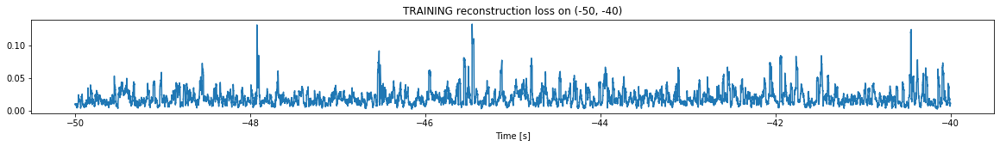

Finished training, median of the log(loss) is:  -1.7689690131152043
Triggering for section:  (-40, -30)
Using this median for triggering: -1.826572294218627
Triggering threshold is:  2.6


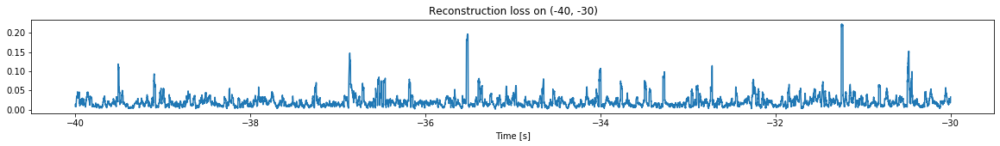

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


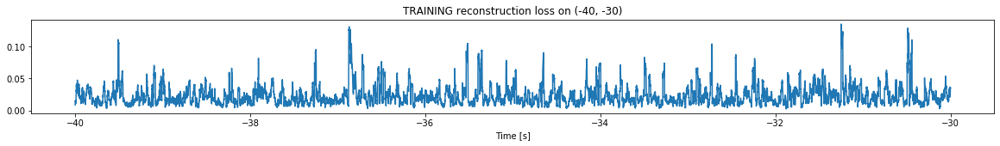

Finished training, median of the log(loss) is:  -1.716310794845648
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7689690131152043
Triggering threshold is:  2.6


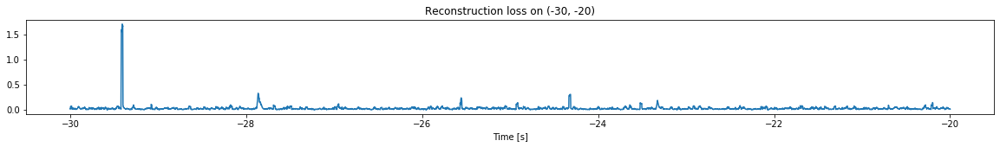

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


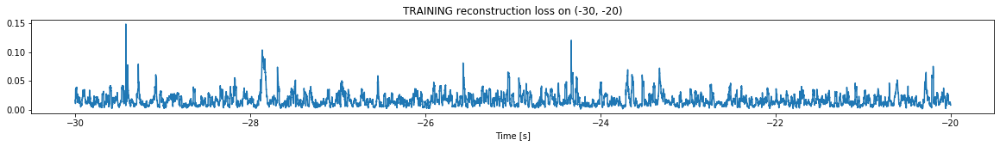

Finished training, median of the log(loss) is:  -1.8411723122902623
Triggering for section:  (-20, -10)
Using this median for triggering: -1.716310794845648
Triggering threshold is:  2.6


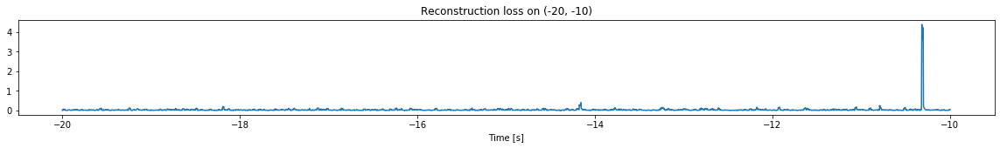

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


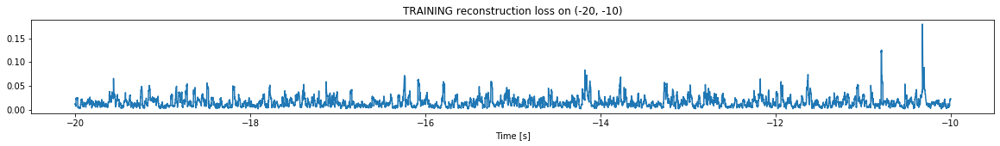

Finished training, median of the log(loss) is:  -1.881205802491469
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8411723122902623
Triggering threshold is:  2.6


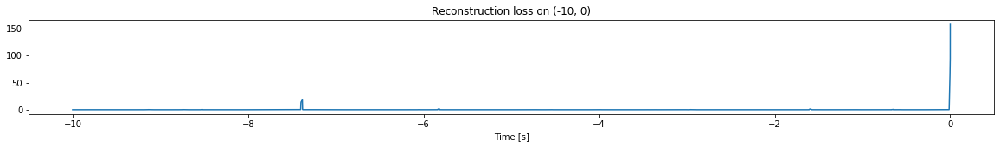

Other trigger time:  [-7.3820996]
Their log loss values are:  [3.0998508]


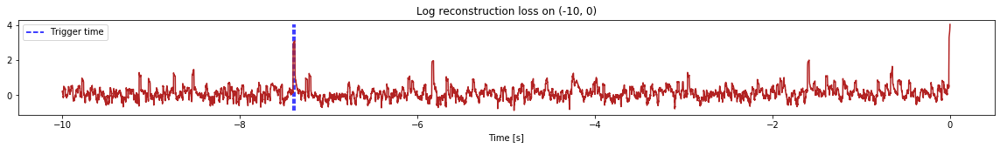

Triggered at:  [-7.3820996]
<--------
Finished simulation, all the triggered times are:  [-7.3820996]


In [17]:
simulation("./data/Ramp30/", 10, (-120,0), -33.2)